In [ ]:
!pip install git+https://github.com/GilianPonte/PrivateTargeting.git -q

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.2/323.2 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 41.3 MB/s eta 0:00:00


In [ ]:
import random
import numpy as np
def generate_and_write_seeds(file_path, num_seeds, seed=None):
    # If a seed is provided, use it for reproducibility
    if seed is not None:
        random.seed(seed)

    # Generate random seeds deterministically
    seeds = [random.getrandbits(32) for _ in range(num_seeds)]

    # Write seeds to a text file
    with open(file_path, "w") as file:
        for seed in seeds:
            file.write(str(seed) + "\n")

    print("Seeds have been written to", file_path)

def read_file(file_path):
    with open(file_path, "r") as file:
        return [int(seed.strip()) for seed in file.readlines()]

# Set the initial seed for reproducibility
initial_seed = 422312

# Generate and write seeds for seeds_data.txt
generate_and_write_seeds("seeds_data.txt", 100, seed=initial_seed)
generate_and_write_seeds("seeds_training.txt", 700, seed=initial_seed)

Seeds have been written to seeds_data.txt
Seeds have been written to seeds_training.txt


In [ ]:
# install PCNNs and simulation setup
!pip install git+https://github.com/GilianPonte/PrivateTargeting.git -q

import os
import pandas as pd
import numpy as np
import random
import tensorflow
import causal_inference
from causal_inference import simulation_data
from causal_inference import strategy1
import time

try:
    seeds_data = np.genfromtxt('/content/seeds_data.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")
try:
    seeds_training = np.genfromtxt('/content/seeds_training.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")

# set time
start_time = time.time()
tensorflow.config.experimental.enable_op_determinism()
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

# Read seeds_data and seeds_training from file
seeds_data = read_file("seeds_data.txt")
seeds_training = read_file("seeds_training.txt")

# simulation parameters
iterations = 1
results_list = []
noise_multipliers = [0] # Initialize lists to store results for each noise multiplier 0.48033, 0.7174, 1.5088, 3.5953, 6.5978, 52.174, 204,

for i in range(iterations):
  print("Iteration: {}".format(i, i))
  random.seed(seeds_data[i])
  tensorflow.random.set_seed(seeds_data[i])
  np.random.seed(seeds_data[i])
  tensorflow.keras.utils.set_random_seed(seeds_data[i])

  # read data
  data = simulation_data.data_simulation(10000)

  # Separate the columns into different DataFrames
  x = data[['covariate_1', 'covariate_2', 'covariate_3', 'covariate_4', 'covariate_5', 'covariate_6']]
  w, m, tau, mu1, mu0, y = data[['w']], data[['m']], data[['tau']], data[['mu1']], data[['mu0']], data[['y']]

  # Loop through each noise multiplier value
  for noise_index, noise_multiplier in enumerate(noise_multipliers):
    print(noise_multiplier)

    for a in range(100):
      combined_number = (noise_index * 100) + a
      print("Combined number: {}".format(combined_number, combined_number))
      random.seed(seeds_training[combined_number])
      tensorflow.random.set_seed(seeds_training[combined_number])
      np.random.seed(seeds_training[combined_number])
      tensorflow.keras.utils.set_random_seed(seeds_training[combined_number])

      # Define the directory based on the noise multiplier
      directory = f"tuner_{noise_multiplier}_iteration_{i}_algo_run_{a}_5"
      os.makedirs(directory, exist_ok=True)  # Create the directory if it doesn't exist

      # Call the function with the current noise_multiplier value
      if noise_multiplier == 0:
        print("no privacy")
        average_treatment_effect, CATE_estimates, tau_hat = strategy1.cnn(X = x,
                                                                  Y = y,
                                                                  T = w,
                                                                  scaling = True,
                                                                  batch_size = 100,
                                                                  epochs = 100,
                                                                  max_epochs = 1,
                                                                  folds = 10,
                                                                  directory = directory,
                                                                  seed = seeds_training[combined_number])
        epsilon = 0
        n = len(x)
        epsilon_conservative = 0
      if noise_multiplier != 0:
        average_treatment_effect, CATE_estimates, tau_hat, n, epsilon, noise_multiplier, epsilon_conservative = strategy1.pcnn(
            X=x,
            Y=y,
            T=w,
            scaling=True,
            batch_size=100,
            epochs=100,
            max_epochs=1,
            fixed_model = True,
            directory=directory,  # Use the directory variable here
            noise_multiplier=noise_multiplier,
            seed = seeds_training[combined_number]
            )
      # Append the results to the list
      results_list.append({
          'Noise Multiplier': noise_multiplier,
          'Average Treatment Effect': average_treatment_effect,
          'CATE Estimates': CATE_estimates,
          'Epsilon': epsilon,
          'epsilon conservative': epsilon_conservative,
          'true ate': data[['tau']].mean(),
          'true CATE': data[['tau']],
          'sample size': n,
          'data set' : i,
          'iteration' : a,
          'covariates' : x,

          })

      np.save(f"results_list_{noise_multiplier}", results_list)

      # Print or use the DataFrames as needed
      print(results_list)
      end_time = time.time()
      execution_time = end_time - start_time
      print("Execution time one sim: {:.2f} seconds".format(execution_time))

  Preparing metadata (setup.py) ... done
Iteration: 0
0
Combined number: 0
no privacy
hyperparameter optimization for yhat
the optimal architecture is: {'num_layers': 2, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.16, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.195 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.167 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.215 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.132 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.145 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.533
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.631
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.614
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.59
Fold 4: mean(tau_hat) = 0.88, sd(m_x) = 1.563
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.596
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.555
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.523
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.498
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.503
ATE = 0.8841, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.21, sd(m_x) = 1.186 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.16, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.221 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.129 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.181 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.503
Fold 1: mean(tau_hat) = 0.95, sd(m_x) = 1.598
Fold 2: mean(tau_hat) = 0.88, sd(m_x) = 1.574
Fold 3: mean(tau_hat) = 0.87, sd(m_x) = 1.554
Fold 4: mean(tau_hat) = 0.88, sd(m_x) = 1.537
Fold 5: mean(tau_hat) = 0.86, sd(m_x) = 1.562
Fold 6: mean(tau_hat) = 0.84, sd(m_x) = 1.576
Fold 7: mean(tau_hat) = 0.86, sd(m_x) = 1.502
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.471
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.479
ATE = 0.8805, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.08, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.16, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.11, sd(m_x) = 1.178 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.12, sd(m_x) = 1.156 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.153 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.114 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.135 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.162 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.532
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.581
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.564
Fold 3: mean(tau_hat) = 0.92, sd(m_x) = 1.549
Fold 4: mean(tau_hat) = 0.94, sd(m_x) = 1.53
Fold 5: mean(tau_hat) = 0.91, sd(m_x) = 1.552
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.553
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.527
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.504
Fold 9: mean(tau_hat) = 0.85, sd(m_x) = 1.505
ATE = 0.8958, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.21, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.17, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.09, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.09, sd(m_x) = 1.132 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.11, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.03, sd(m_x) = 1.098 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.113 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.20, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 512, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.522
Fold 1: mean(tau_hat) = 1.0, sd(m_x) = 1.615
Fold 2: mean(tau_hat) = 0.93, sd(m_x) = 1.609
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.577
Fold 4: mean(tau_hat) = 0.92, sd(m_x) = 1.555
Fold 5: mean(tau_hat) = 0.9, sd(m_x) = 1.582
Fold 6: mean(tau_hat) = 0.94, sd(m_x) = 1.553
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.514
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.487
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.495
ATE = 0.9093, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.171 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.171 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.190 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.214 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.126 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.145 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.174 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.88, sd(m_x) = 1.516
Fold 1: mean(tau_hat) = 0.95, sd(m_x) = 1.608
Fold 2: mean(tau_hat) = 0.87, sd(m_x) = 1.595
Fold 3: mean(tau_hat) = 0.86, sd(m_x) = 1.569
Fold 4: mean(tau_hat) = 0.87, sd(m_x) = 1.546
Fold 5: mean(tau_hat) = 0.85, sd(m_x) = 1.577
Fold 6: mean(tau_hat) = 0.92, sd(m_x) = 1.567
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.543
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.505
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.52
ATE = 0.8836, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.186 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.181 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.160 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.195 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.174 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.226 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.139 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.104 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.128 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.513
Fold 1: mean(tau_hat) = 0.94, sd(m_x) = 1.643
Fold 2: mean(tau_hat) = 0.87, sd(m_x) = 1.606
Fold 3: mean(tau_hat) = 0.86, sd(m_x) = 1.603
Fold 4: mean(tau_hat) = 0.86, sd(m_x) = 1.563
Fold 5: mean(tau_hat) = 0.85, sd(m_x) = 1.605
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.585
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.544
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.515
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.523
ATE = 0.8828, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.158 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.168 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.135 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.17, sd(m_x) = 1.220 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.18, sd(m_x) = 1.194 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.19, sd(m_x) = 1.242 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.11, sd(m_x) = 1.153 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.105 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.19, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.88, sd(m_x) = 1.494
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.546
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.534
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.512
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.487
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.508
Fold 6: mean(tau_hat) = 0.86, sd(m_x) = 1.55
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.539
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.483
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.501
ATE = 0.8942, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.166 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.12, sd(m_x) = 1.138 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.168 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.181 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.109 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.123 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.88, sd(m_x) = 1.504
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.558
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.53
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.527
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.497
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.52
Fold 6: mean(tau_hat) = 0.92, sd(m_x) = 1.556
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.519
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.506
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.503
ATE = 0.9032, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.14, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.23, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.18, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.09, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.160 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.117 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.135 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.511
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.58
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.56
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.549
Fold 4: mean(tau_hat) = 0.86, sd(m_x) = 1.53
Fold 5: mean(tau_hat) = 0.84, sd(m_x) = 1.543
Fold 6: mean(tau_hat) = 0.92, sd(m_x) = 1.564
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.534
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.513
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.511
ATE = 0.8933, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.22, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.17, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.158 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.119 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.105 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.09, sd(m_x) = 1.136 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.496
Fold 1: mean(tau_hat) = 0.95, sd(m_x) = 1.588
Fold 2: mean(tau_hat) = 0.87, sd(m_x) = 1.582
Fold 3: mean(tau_hat) = 0.94, sd(m_x) = 1.558
Fold 4: mean(tau_hat) = 0.95, sd(m_x) = 1.544
Fold 5: mean(tau_hat) = 0.92, sd(m_x) = 1.566
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.582
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.56
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.523
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.533
ATE = 0.9113, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.07, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.13, sd(m_x) = 1.162 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.146 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.207 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.116 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.130 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.15, sd(m_x) = 1.153 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.88, sd(m_x) = 1.499
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.609
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.605
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.567
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.55
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.574
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.561
Fold 7: mean(tau_hat) = 0.86, sd(m_x) = 1.533
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.5
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.509
ATE = 0.9013, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.181 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.221 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.134 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.150 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.178 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.553
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.591
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.573
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.552
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.526
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.556
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.526
Fold 7: mean(tau_hat) = 0.9, sd(m_x) = 1.544
Fold 8: mean(tau_hat) = 0.97, sd(m_x) = 1.503
Fold 9: mean(tau_hat) = 0.91, sd(m_x) = 1.513
ATE = 0.9058, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.08, sd(m_x) = 1.210 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.16, sd(m_x) = 1.210 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.11, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.12, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.10, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.12, sd(m_x) = 1.194 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.113 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.110 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.20, sd(m_x) = 1.153 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.518
Fold 1: mean(tau_hat) = 0.91, sd(m_x) = 1.572
Fold 2: mean(tau_hat) = 0.84, sd(m_x) = 1.533
Fold 3: mean(tau_hat) = 0.84, sd(m_x) = 1.529
Fold 4: mean(tau_hat) = 0.84, sd(m_x) = 1.504
Fold 5: mean(tau_hat) = 0.82, sd(m_x) = 1.518
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.559
Fold 7: mean(tau_hat) = 0.89, sd(m_x) = 1.531
Fold 8: mean(tau_hat) = 0.96, sd(m_x) = 1.492
Fold 9: mean(tau_hat) = 0.91, sd(m_x) = 1.51
ATE = 0.8753, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.13, sd(m_x) = 1.210 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.22, sd(m_x) = 1.211 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.17, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.18, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.173 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.224 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.141 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.156 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.79, sd(m_x) = 1.526
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.56
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.549
Fold 3: mean(tau_hat) = 0.92, sd(m_x) = 1.561
Fold 4: mean(tau_hat) = 0.93, sd(m_x) = 1.546
Fold 5: mean(tau_hat) = 0.91, sd(m_x) = 1.571
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.58
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.547
Fold 8: mean(tau_hat) = 0.94, sd(m_x) = 1.495
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.516
ATE = 0.9007, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.218 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.223 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.208 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.15, sd(m_x) = 1.181 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.15, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.16, sd(m_x) = 1.201 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.09, sd(m_x) = 1.117 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.122 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.152 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.524
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.619
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.605
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.544
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.53
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.55
Fold 6: mean(tau_hat) = 0.86, sd(m_x) = 1.606
Fold 7: mean(tau_hat) = 0.86, sd(m_x) = 1.528
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.502
Fold 9: mean(tau_hat) = 0.85, sd(m_x) = 1.517
ATE = 0.8876, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.195 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.190 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.14, sd(m_x) = 1.194 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.15, sd(m_x) = 1.167 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.16, sd(m_x) = 1.216 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.08, sd(m_x) = 1.125 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.17, sd(m_x) = 1.145 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.14, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.88, sd(m_x) = 1.525
Fold 1: mean(tau_hat) = 0.95, sd(m_x) = 1.614
Fold 2: mean(tau_hat) = 0.88, sd(m_x) = 1.603
Fold 3: mean(tau_hat) = 0.86, sd(m_x) = 1.579
Fold 4: mean(tau_hat) = 0.87, sd(m_x) = 1.554
Fold 5: mean(tau_hat) = 0.85, sd(m_x) = 1.583
Fold 6: mean(tau_hat) = 0.94, sd(m_x) = 1.54
Fold 7: mean(tau_hat) = 0.89, sd(m_x) = 1.502
Fold 8: mean(tau_hat) = 0.94, sd(m_x) = 1.473
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.478
ATE = 0.8947, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.201 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.204 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.14, sd(m_x) = 1.215 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.15, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.16, sd(m_x) = 1.240 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.08, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.17, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.14, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.492
Fold 1: mean(tau_hat) = 0.95, sd(m_x) = 1.602
Fold 2: mean(tau_hat) = 0.88, sd(m_x) = 1.594
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.55
Fold 4: mean(tau_hat) = 0.9, sd(m_x) = 1.537
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.567
Fold 6: mean(tau_hat) = 0.92, sd(m_x) = 1.548
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.524
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.458
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.47
ATE = 0.8947, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.156 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.133 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.88, sd(m_x) = 1.507
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.586
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.58
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.548
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.524
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.56
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.557
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.527
Fold 8: mean(tau_hat) = 0.94, sd(m_x) = 1.494
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.502
ATE = 0.8992, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.216 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.10, sd(m_x) = 1.193 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.168 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.12, sd(m_x) = 1.215 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.130 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.09, sd(m_x) = 1.098 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.07, sd(m_x) = 1.129 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.518
Fold 1: mean(tau_hat) = 0.93, sd(m_x) = 1.646
Fold 2: mean(tau_hat) = 0.85, sd(m_x) = 1.632
Fold 3: mean(tau_hat) = 0.84, sd(m_x) = 1.603
Fold 4: mean(tau_hat) = 0.85, sd(m_x) = 1.586
Fold 5: mean(tau_hat) = 0.84, sd(m_x) = 1.609
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.546
Fold 7: mean(tau_hat) = 0.91, sd(m_x) = 1.532
Fold 8: mean(tau_hat) = 0.98, sd(m_x) = 1.491
Fold 9: mean(tau_hat) = 0.93, sd(m_x) = 1.504
ATE = 0.8865, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.13, sd(m_x) = 1.211 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.22, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.17, sd(m_x) = 1.186 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.18, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.222 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.142 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.157 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.493
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.573
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.579
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.541
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.518
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.552
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.549
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.514
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.451
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.466
ATE = 0.8948, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.13, sd(m_x) = 1.212 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.23, sd(m_x) = 1.222 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.18, sd(m_x) = 1.210 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.18, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.211 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.16, sd(m_x) = 1.235 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.146 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.15, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.518
Fold 1: mean(tau_hat) = 0.99, sd(m_x) = 1.6
Fold 2: mean(tau_hat) = 0.92, sd(m_x) = 1.596
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.565
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.54
Fold 5: mean(tau_hat) = 0.91, sd(m_x) = 1.545
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.578
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.53
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.5
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.506
ATE = 0.9048, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.10, sd(m_x) = 1.173 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.151 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.198 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.107 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.120 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.09, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.531
Fold 1: mean(tau_hat) = 0.99, sd(m_x) = 1.568
Fold 2: mean(tau_hat) = 0.92, sd(m_x) = 1.582
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.55
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.53
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.554
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.562
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.533
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.484
Fold 9: mean(tau_hat) = 0.85, sd(m_x) = 1.499
ATE = 0.8922, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.10, sd(m_x) = 1.133 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.183 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.155 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.115 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.135 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.162 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.511
Fold 1: mean(tau_hat) = 0.95, sd(m_x) = 1.599
Fold 2: mean(tau_hat) = 0.88, sd(m_x) = 1.587
Fold 3: mean(tau_hat) = 0.86, sd(m_x) = 1.559
Fold 4: mean(tau_hat) = 0.87, sd(m_x) = 1.541
Fold 5: mean(tau_hat) = 0.85, sd(m_x) = 1.563
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.565
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.535
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.514
Fold 9: mean(tau_hat) = 0.85, sd(m_x) = 1.515
ATE = 0.8712, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.05, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.13, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.08, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.10, sd(m_x) = 1.147 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.183 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.198 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.109 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.131 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.157 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.533
Fold 1: mean(tau_hat) = 0.99, sd(m_x) = 1.603
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.581
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.563
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.546
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.563
Fold 6: mean(tau_hat) = 0.86, sd(m_x) = 1.535
Fold 7: mean(tau_hat) = 0.81, sd(m_x) = 1.5
Fold 8: mean(tau_hat) = 0.89, sd(m_x) = 1.482
Fold 9: mean(tau_hat) = 0.84, sd(m_x) = 1.49
ATE = 0.8847, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.13, sd(m_x) = 1.209 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.21, sd(m_x) = 1.212 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.17, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.12, sd(m_x) = 1.201 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.04, sd(m_x) = 1.114 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.13, sd(m_x) = 1.131 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.10, sd(m_x) = 1.161 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.493
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.616
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.593
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.542
Fold 4: mean(tau_hat) = 0.92, sd(m_x) = 1.519
Fold 5: mean(tau_hat) = 0.9, sd(m_x) = 1.542
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.555
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.526
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.497
Fold 9: mean(tau_hat) = 0.91, sd(m_x) = 1.501
ATE = 0.906, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.157 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.157 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.206 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.119 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.123 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.147 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.508
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.555
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.526
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.549
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.532
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.555
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.544
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.516
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.501
Fold 9: mean(tau_hat) = 0.85, sd(m_x) = 1.5
ATE = 0.8881, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.174 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.16, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.156 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.208 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.117 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.139 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.502
Fold 1: mean(tau_hat) = 0.94, sd(m_x) = 1.587
Fold 2: mean(tau_hat) = 0.87, sd(m_x) = 1.566
Fold 3: mean(tau_hat) = 0.86, sd(m_x) = 1.547
Fold 4: mean(tau_hat) = 0.87, sd(m_x) = 1.522
Fold 5: mean(tau_hat) = 0.85, sd(m_x) = 1.547
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.572
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.546
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.518
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.523
ATE = 0.8791, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.08, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.211 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.13, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.16, sd(m_x) = 1.208 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.17, sd(m_x) = 1.181 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.18, sd(m_x) = 1.229 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.10, sd(m_x) = 1.142 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.168 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.79, sd(m_x) = 1.525
Fold 1: mean(tau_hat) = 0.94, sd(m_x) = 1.61
Fold 2: mean(tau_hat) = 0.87, sd(m_x) = 1.603
Fold 3: mean(tau_hat) = 0.93, sd(m_x) = 1.549
Fold 4: mean(tau_hat) = 0.94, sd(m_x) = 1.531
Fold 5: mean(tau_hat) = 0.92, sd(m_x) = 1.55
Fold 6: mean(tau_hat) = 0.94, sd(m_x) = 1.553
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.54
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.493
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.513
ATE = 0.901, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.212 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.16, sd(m_x) = 1.183 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.181 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.119 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.153 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.553
Fold 1: mean(tau_hat) = 1.01, sd(m_x) = 1.619
Fold 2: mean(tau_hat) = 0.94, sd(m_x) = 1.608
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.505
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.488
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.508
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.574
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.543
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.509
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.521
ATE = 0.9058, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.190 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.161 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.204 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.123 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.138 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.82, sd(m_x) = 1.519
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.559
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.528
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.552
Fold 4: mean(tau_hat) = 0.92, sd(m_x) = 1.532
Fold 5: mean(tau_hat) = 0.9, sd(m_x) = 1.56
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.555
Fold 7: mean(tau_hat) = 0.86, sd(m_x) = 1.533
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.505
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.505
ATE = 0.9002, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.206 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.09, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.10, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.10, sd(m_x) = 1.208 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.02, sd(m_x) = 1.118 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.138 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.09, sd(m_x) = 1.166 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.521
Fold 1: mean(tau_hat) = 0.99, sd(m_x) = 1.611
Fold 2: mean(tau_hat) = 0.92, sd(m_x) = 1.601
Fold 3: mean(tau_hat) = 0.93, sd(m_x) = 1.559
Fold 4: mean(tau_hat) = 0.94, sd(m_x) = 1.537
Fold 5: mean(tau_hat) = 0.93, sd(m_x) = 1.571
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.582
Fold 7: mean(tau_hat) = 0.82, sd(m_x) = 1.546
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.474
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.486
ATE = 0.9116, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.14, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.24, sd(m_x) = 1.193 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.18, sd(m_x) = 1.190 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.11, sd(m_x) = 1.145 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.09, sd(m_x) = 1.178 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.09, sd(m_x) = 1.151 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.10, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.03, sd(m_x) = 1.115 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.130 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.09, sd(m_x) = 1.160 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.509
Fold 1: mean(tau_hat) = 0.91, sd(m_x) = 1.638
Fold 2: mean(tau_hat) = 0.84, sd(m_x) = 1.628
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.532
Fold 4: mean(tau_hat) = 0.88, sd(m_x) = 1.488
Fold 5: mean(tau_hat) = 0.93, sd(m_x) = 1.599
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.571
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.557
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.513
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.521
ATE = 0.8891, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.10, sd(m_x) = 1.198 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.12, sd(m_x) = 1.218 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.134 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.152 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.17, sd(m_x) = 1.198 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.529
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.53
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.539
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.501
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.482
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.517
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.571
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.508
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.477
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.487
ATE = 0.8944, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.146 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.08, sd(m_x) = 1.110 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.117 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.09, sd(m_x) = 1.146 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.81, sd(m_x) = 1.514
Fold 1: mean(tau_hat) = 1.02, sd(m_x) = 1.61
Fold 2: mean(tau_hat) = 0.95, sd(m_x) = 1.598
Fold 3: mean(tau_hat) = 0.94, sd(m_x) = 1.57
Fold 4: mean(tau_hat) = 0.94, sd(m_x) = 1.546
Fold 5: mean(tau_hat) = 0.93, sd(m_x) = 1.576
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.573
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.527
Fold 8: mean(tau_hat) = 0.96, sd(m_x) = 1.517
Fold 9: mean(tau_hat) = 0.91, sd(m_x) = 1.52
ATE = 0.9222, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.13, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.23, sd(m_x) = 1.212 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.18, sd(m_x) = 1.206 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.18, sd(m_x) = 1.178 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.16, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.17, sd(m_x) = 1.160 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.18, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.10, sd(m_x) = 1.122 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.13, sd(m_x) = 1.115 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.20, sd(m_x) = 1.216 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 512, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.81, sd(m_x) = 1.573
Fold 1: mean(tau_hat) = 0.89, sd(m_x) = 1.641
Fold 2: mean(tau_hat) = 0.82, sd(m_x) = 1.64
Fold 3: mean(tau_hat) = 0.8, sd(m_x) = 1.601
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.494
Fold 5: mean(tau_hat) = 0.92, sd(m_x) = 1.639
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.569
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.547
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.496
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.509
ATE = 0.8673, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.21, sd(m_x) = 1.208 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.17, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.178 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.207 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.122 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.106 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.09, sd(m_x) = 1.141 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.8, sd(m_x) = 1.503
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.606
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.617
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.576
Fold 4: mean(tau_hat) = 0.87, sd(m_x) = 1.521
Fold 5: mean(tau_hat) = 0.85, sd(m_x) = 1.55
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.565
Fold 7: mean(tau_hat) = 0.89, sd(m_x) = 1.548
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.517
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.521
ATE = 0.8944, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.221 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.204 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.08, sd(m_x) = 1.161 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.09, sd(m_x) = 1.140 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.10, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.03, sd(m_x) = 1.100 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.11, sd(m_x) = 1.113 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.17, sd(m_x) = 1.142 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.91, sd(m_x) = 1.537
Fold 1: mean(tau_hat) = 0.91, sd(m_x) = 1.57
Fold 2: mean(tau_hat) = 0.84, sd(m_x) = 1.568
Fold 3: mean(tau_hat) = 0.93, sd(m_x) = 1.552
Fold 4: mean(tau_hat) = 0.95, sd(m_x) = 1.535
Fold 5: mean(tau_hat) = 0.92, sd(m_x) = 1.561
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.564
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.536
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.504
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.508
ATE = 0.8983, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.138 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.102 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.111 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.497
Fold 1: mean(tau_hat) = 0.93, sd(m_x) = 1.581
Fold 2: mean(tau_hat) = 0.85, sd(m_x) = 1.578
Fold 3: mean(tau_hat) = 0.84, sd(m_x) = 1.55
Fold 4: mean(tau_hat) = 0.85, sd(m_x) = 1.524
Fold 5: mean(tau_hat) = 0.83, sd(m_x) = 1.559
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.588
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.559
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.515
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.515
ATE = 0.867, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.05, sd(m_x) = 1.178 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.14, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.09, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.11, sd(m_x) = 1.136 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.10, sd(m_x) = 1.201 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.219 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.04, sd(m_x) = 1.127 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.147 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.10, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.89, sd(m_x) = 1.546
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.593
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.618
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.565
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.5
Fold 5: mean(tau_hat) = 0.92, sd(m_x) = 1.596
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.584
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.525
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.479
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.495
ATE = 0.9093, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.208 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.171 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.122 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.11, sd(m_x) = 1.126 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.08, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.482
Fold 1: mean(tau_hat) = 0.99, sd(m_x) = 1.621
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.614
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.559
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.549
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.567
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.556
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.531
Fold 8: mean(tau_hat) = 0.94, sd(m_x) = 1.491
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.496
ATE = 0.8984, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.08, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.198 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.162 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.222 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.127 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.118 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.142 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.553
Fold 1: mean(tau_hat) = 0.94, sd(m_x) = 1.618
Fold 2: mean(tau_hat) = 0.87, sd(m_x) = 1.602
Fold 3: mean(tau_hat) = 0.85, sd(m_x) = 1.573
Fold 4: mean(tau_hat) = 0.87, sd(m_x) = 1.559
Fold 5: mean(tau_hat) = 0.85, sd(m_x) = 1.583
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.566
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.541
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.507
Fold 9: mean(tau_hat) = 0.85, sd(m_x) = 1.51
ATE = 0.8669, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.212 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.22, sd(m_x) = 1.220 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.17, sd(m_x) = 1.209 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.124 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.115 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.13, sd(m_x) = 1.121 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.10, sd(m_x) = 1.155 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.88, sd(m_x) = 1.51
Fold 1: mean(tau_hat) = 1.01, sd(m_x) = 1.627
Fold 2: mean(tau_hat) = 0.94, sd(m_x) = 1.619
Fold 3: mean(tau_hat) = 0.93, sd(m_x) = 1.584
Fold 4: mean(tau_hat) = 0.94, sd(m_x) = 1.567
Fold 5: mean(tau_hat) = 0.91, sd(m_x) = 1.594
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.556
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.526
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.483
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.496
ATE = 0.9146, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.05, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.14, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.10, sd(m_x) = 1.151 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.10, sd(m_x) = 1.126 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.117 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.132 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.15, sd(m_x) = 1.212 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.81, sd(m_x) = 1.496
Fold 1: mean(tau_hat) = 1.01, sd(m_x) = 1.571
Fold 2: mean(tau_hat) = 0.93, sd(m_x) = 1.553
Fold 3: mean(tau_hat) = 0.93, sd(m_x) = 1.534
Fold 4: mean(tau_hat) = 0.93, sd(m_x) = 1.505
Fold 5: mean(tau_hat) = 0.91, sd(m_x) = 1.535
Fold 6: mean(tau_hat) = 0.86, sd(m_x) = 1.525
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.52
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.489
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.497
ATE = 0.9049, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.06, sd(m_x) = 1.167 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.15, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.10, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.11, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.08, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.08, sd(m_x) = 1.145 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.09, sd(m_x) = 1.190 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.02, sd(m_x) = 1.105 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.11, sd(m_x) = 1.119 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.08, sd(m_x) = 1.150 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.521
Fold 1: mean(tau_hat) = 0.95, sd(m_x) = 1.606
Fold 2: mean(tau_hat) = 0.87, sd(m_x) = 1.6
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.544
Fold 4: mean(tau_hat) = 0.92, sd(m_x) = 1.528
Fold 5: mean(tau_hat) = 0.9, sd(m_x) = 1.548
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.562
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.527
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.475
Fold 9: mean(tau_hat) = 0.84, sd(m_x) = 1.485
ATE = 0.8876, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.209 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.21, sd(m_x) = 1.223 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.17, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.07, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.07, sd(m_x) = 1.139 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.09, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.01, sd(m_x) = 1.104 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.108 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.09, sd(m_x) = 1.136 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.89, sd(m_x) = 1.515
Fold 1: mean(tau_hat) = 0.9, sd(m_x) = 1.583
Fold 2: mean(tau_hat) = 0.83, sd(m_x) = 1.585
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.554
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.54
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.562
Fold 6: mean(tau_hat) = 0.92, sd(m_x) = 1.572
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.546
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.505
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.52
ATE = 0.889, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.225 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.22, sd(m_x) = 1.224 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.204 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.18, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.16, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.16, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.17, sd(m_x) = 1.220 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.09, sd(m_x) = 1.133 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.19, sd(m_x) = 1.153 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.17, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.477
Fold 1: mean(tau_hat) = 1.0, sd(m_x) = 1.532
Fold 2: mean(tau_hat) = 0.94, sd(m_x) = 1.544
Fold 3: mean(tau_hat) = 0.92, sd(m_x) = 1.581
Fold 4: mean(tau_hat) = 0.92, sd(m_x) = 1.556
Fold 5: mean(tau_hat) = 0.91, sd(m_x) = 1.581
Fold 6: mean(tau_hat) = 0.92, sd(m_x) = 1.552
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.549
Fold 8: mean(tau_hat) = 0.94, sd(m_x) = 1.492
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.507
ATE = 0.9208, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.08, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.13, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.09, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.09, sd(m_x) = 1.147 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.10, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.03, sd(m_x) = 1.109 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.128 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.09, sd(m_x) = 1.157 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.81, sd(m_x) = 1.489
Fold 1: mean(tau_hat) = 0.91, sd(m_x) = 1.614
Fold 2: mean(tau_hat) = 0.83, sd(m_x) = 1.588
Fold 3: mean(tau_hat) = 0.82, sd(m_x) = 1.578
Fold 4: mean(tau_hat) = 0.83, sd(m_x) = 1.554
Fold 5: mean(tau_hat) = 0.81, sd(m_x) = 1.575
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.526
Fold 7: mean(tau_hat) = 0.91, sd(m_x) = 1.519
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.502
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.511
ATE = 0.8612, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.215 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.215 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.158 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.210 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.122 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.504
Fold 1: mean(tau_hat) = 1.01, sd(m_x) = 1.597
Fold 2: mean(tau_hat) = 0.94, sd(m_x) = 1.581
Fold 3: mean(tau_hat) = 0.92, sd(m_x) = 1.527
Fold 4: mean(tau_hat) = 0.93, sd(m_x) = 1.509
Fold 5: mean(tau_hat) = 0.9, sd(m_x) = 1.533
Fold 6: mean(tau_hat) = 0.86, sd(m_x) = 1.572
Fold 7: mean(tau_hat) = 0.81, sd(m_x) = 1.542
Fold 8: mean(tau_hat) = 0.88, sd(m_x) = 1.522
Fold 9: mean(tau_hat) = 0.83, sd(m_x) = 1.524
ATE = 0.8916, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.167 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.178 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.16, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.15, sd(m_x) = 1.227 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.16, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.17, sd(m_x) = 1.247 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.09, sd(m_x) = 1.160 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.18, sd(m_x) = 1.181 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.20, sd(m_x) = 1.247 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.88, sd(m_x) = 1.526
Fold 1: mean(tau_hat) = 0.93, sd(m_x) = 1.596
Fold 2: mean(tau_hat) = 0.86, sd(m_x) = 1.597
Fold 3: mean(tau_hat) = 0.85, sd(m_x) = 1.56
Fold 4: mean(tau_hat) = 0.86, sd(m_x) = 1.541
Fold 5: mean(tau_hat) = 0.84, sd(m_x) = 1.57
Fold 6: mean(tau_hat) = 0.87, sd(m_x) = 1.582
Fold 7: mean(tau_hat) = 0.93, sd(m_x) = 1.544
Fold 8: mean(tau_hat) = 1.0, sd(m_x) = 1.5
Fold 9: mean(tau_hat) = 0.95, sd(m_x) = 1.516
ATE = 0.897, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000,

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.201 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.16, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.201 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.122 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.134 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.166 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.497
Fold 1: mean(tau_hat) = 0.99, sd(m_x) = 1.61
Fold 2: mean(tau_hat) = 0.92, sd(m_x) = 1.584
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.569
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.539
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.565
Fold 6: mean(tau_hat) = 0.94, sd(m_x) = 1.559
Fold 7: mean(tau_hat) = 0.89, sd(m_x) = 1.52
Fold 8: mean(tau_hat) = 0.96, sd(m_x) = 1.495
Fold 9: mean(tau_hat) = 0.91, sd(m_x) = 1.512
ATE = 0.9152, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.173 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.13, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.14, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.16, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.112 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.122 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.145 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.503
Fold 1: mean(tau_hat) = 0.95, sd(m_x) = 1.558
Fold 2: mean(tau_hat) = 0.88, sd(m_x) = 1.533
Fold 3: mean(tau_hat) = 0.87, sd(m_x) = 1.528
Fold 4: mean(tau_hat) = 0.88, sd(m_x) = 1.493
Fold 5: mean(tau_hat) = 0.86, sd(m_x) = 1.522
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.559
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.52
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.509
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.5
ATE = 0.8868, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.174 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.11, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.151 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.119 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.13, sd(m_x) = 1.129 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.51
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.575
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.545
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.536
Fold 4: mean(tau_hat) = 0.9, sd(m_x) = 1.505
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.53
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.551
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.527
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.505
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.5
ATE = 0.8943, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, '

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.160 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.158 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.140 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.10, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.158 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.12, sd(m_x) = 1.210 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.04, sd(m_x) = 1.119 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.13, sd(m_x) = 1.141 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.10, sd(m_x) = 1.167 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.54
Fold 1: mean(tau_hat) = 0.92, sd(m_x) = 1.625
Fold 2: mean(tau_hat) = 0.85, sd(m_x) = 1.625
Fold 3: mean(tau_hat) = 0.84, sd(m_x) = 1.591
Fold 4: mean(tau_hat) = 0.84, sd(m_x) = 1.57
Fold 5: mean(tau_hat) = 0.83, sd(m_x) = 1.601
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.546
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.525
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.494
Fold 9: mean(tau_hat) = 0.85, sd(m_x) = 1.503
ATE = 0.8586, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.07, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.15, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.10, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.11, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.143 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.107 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.122 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.193 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.51
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.624
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.62
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.588
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.571
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.591
Fold 6: mean(tau_hat) = 0.92, sd(m_x) = 1.601
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.543
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.499
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.518
ATE = 0.8857, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.183 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.126 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.174 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.089 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.107 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.133 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.8, sd(m_x) = 1.514
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.628
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.611
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.588
Fold 4: mean(tau_hat) = 0.9, sd(m_x) = 1.564
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.591
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.537
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.508
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.483
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.485
ATE = 0.8865, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.07, sd(m_x) = 1.183 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.15, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.10, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.11, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.193 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.160 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.208 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.117 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.140 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.497
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.566
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.539
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.531
Fold 4: mean(tau_hat) = 0.9, sd(m_x) = 1.496
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.526
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.563
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.535
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.509
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.51
ATE = 0.8896, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.186 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.166 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.194 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.162 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.207 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.123 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.134 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.173 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.571
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.6
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.596
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.565
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.542
Fold 5: mean(tau_hat) = 0.86, sd(m_x) = 1.566
Fold 6: mean(tau_hat) = 0.92, sd(m_x) = 1.539
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.549
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.489
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.511
ATE = 0.8922, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.178 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.12, sd(m_x) = 1.137 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.147 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.111 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.13, sd(m_x) = 1.109 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.10, sd(m_x) = 1.127 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.489
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.592
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.572
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.55
Fold 4: mean(tau_hat) = 0.9, sd(m_x) = 1.532
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.554
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.545
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.515
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.498
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.497
ATE = 0.8899, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.204 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.224 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.147 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.115 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.131 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.504
Fold 1: mean(tau_hat) = 0.94, sd(m_x) = 1.585
Fold 2: mean(tau_hat) = 0.87, sd(m_x) = 1.565
Fold 3: mean(tau_hat) = 0.86, sd(m_x) = 1.512
Fold 4: mean(tau_hat) = 0.86, sd(m_x) = 1.518
Fold 5: mean(tau_hat) = 0.93, sd(m_x) = 1.567
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.59
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.523
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.497
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.508
ATE = 0.891, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.173 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.10, sd(m_x) = 1.118 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.14, sd(m_x) = 1.209 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.15, sd(m_x) = 1.181 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.16, sd(m_x) = 1.230 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.09, sd(m_x) = 1.142 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.133 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.160 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.52
Fold 1: mean(tau_hat) = 0.91, sd(m_x) = 1.613
Fold 2: mean(tau_hat) = 0.85, sd(m_x) = 1.62
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.557
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.535
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.575
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.571
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.554
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.491
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.516
ATE = 0.8871, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.08, sd(m_x) = 1.183 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.190 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.12, sd(m_x) = 1.158 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.08, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.09, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.10, sd(m_x) = 1.204 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.02, sd(m_x) = 1.115 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.125 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.158 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.79, sd(m_x) = 1.523
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.615
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.598
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.574
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.553
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.574
Fold 6: mean(tau_hat) = 0.92, sd(m_x) = 1.58
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.549
Fold 8: mean(tau_hat) = 0.98, sd(m_x) = 1.489
Fold 9: mean(tau_hat) = 0.93, sd(m_x) = 1.492
ATE = 0.9001, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.208 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.215 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.15, sd(m_x) = 1.195 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.16, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.17, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.09, sd(m_x) = 1.124 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.18, sd(m_x) = 1.145 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.15, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.8, sd(m_x) = 1.512
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.612
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.6
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.554
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.532
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.561
Fold 6: mean(tau_hat) = 0.86, sd(m_x) = 1.566
Fold 7: mean(tau_hat) = 0.81, sd(m_x) = 1.542
Fold 8: mean(tau_hat) = 0.88, sd(m_x) = 1.509
Fold 9: mean(tau_hat) = 0.83, sd(m_x) = 1.516
ATE = 0.874, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.209 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.194 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.09, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.10, sd(m_x) = 1.153 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.11, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.03, sd(m_x) = 1.119 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.13, sd(m_x) = 1.128 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.512
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.581
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.581
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.546
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.535
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.555
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.544
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.541
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.503
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.52
ATE = 0.893, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.204 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.216 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.178 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.158 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.208 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.119 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.138 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.167 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 512, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.51
Fold 1: mean(tau_hat) = 0.91, sd(m_x) = 1.621
Fold 2: mean(tau_hat) = 0.84, sd(m_x) = 1.611
Fold 3: mean(tau_hat) = 0.87, sd(m_x) = 1.576
Fold 4: mean(tau_hat) = 0.88, sd(m_x) = 1.55
Fold 5: mean(tau_hat) = 0.86, sd(m_x) = 1.579
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.571
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.544
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.513
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.522
ATE = 0.879, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.07, sd(m_x) = 1.186 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.16, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.11, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.12, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.222 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.245 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.151 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.17, sd(m_x) = 1.101 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.14, sd(m_x) = 1.135 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.89, sd(m_x) = 1.484
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.589
Fold 2: mean(tau_hat) = 0.88, sd(m_x) = 1.596
Fold 3: mean(tau_hat) = 0.87, sd(m_x) = 1.566
Fold 4: mean(tau_hat) = 0.88, sd(m_x) = 1.53
Fold 5: mean(tau_hat) = 0.86, sd(m_x) = 1.56
Fold 6: mean(tau_hat) = 0.93, sd(m_x) = 1.562
Fold 7: mean(tau_hat) = 0.82, sd(m_x) = 1.533
Fold 8: mean(tau_hat) = 0.89, sd(m_x) = 1.489
Fold 9: mean(tau_hat) = 0.84, sd(m_x) = 1.501
ATE = 0.8842, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.193 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.158 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.186 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.157 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.120 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.138 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.168 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.502
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.575
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.549
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.55
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.536
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.554
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.558
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.53
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.506
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.508
ATE = 0.893, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.13, sd(m_x) = 1.156 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.16, sd(m_x) = 1.210 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.123 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.135 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.14, sd(m_x) = 1.168 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.507
Fold 1: mean(tau_hat) = 0.93, sd(m_x) = 1.575
Fold 2: mean(tau_hat) = 0.86, sd(m_x) = 1.578
Fold 3: mean(tau_hat) = 0.85, sd(m_x) = 1.542
Fold 4: mean(tau_hat) = 0.86, sd(m_x) = 1.524
Fold 5: mean(tau_hat) = 0.97, sd(m_x) = 1.585
Fold 6: mean(tau_hat) = 0.84, sd(m_x) = 1.541
Fold 7: mean(tau_hat) = 0.79, sd(m_x) = 1.514
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.464
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.468
ATE = 0.8772, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.171 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.13, sd(m_x) = 1.153 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.195 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.108 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.131 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.157 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.494
Fold 1: mean(tau_hat) = 0.99, sd(m_x) = 1.61
Fold 2: mean(tau_hat) = 0.92, sd(m_x) = 1.597
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.566
Fold 4: mean(tau_hat) = 0.92, sd(m_x) = 1.549
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.576
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.559
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.533
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.505
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.51
ATE = 0.897, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.08, sd(m_x) = 1.204 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.13, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.10, sd(m_x) = 1.198 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.12, sd(m_x) = 1.226 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.04, sd(m_x) = 1.141 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.105 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.168 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.567
Fold 1: mean(tau_hat) = 1.02, sd(m_x) = 1.651
Fold 2: mean(tau_hat) = 0.94, sd(m_x) = 1.647
Fold 3: mean(tau_hat) = 0.93, sd(m_x) = 1.616
Fold 4: mean(tau_hat) = 0.93, sd(m_x) = 1.589
Fold 5: mean(tau_hat) = 0.92, sd(m_x) = 1.62
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.557
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.465
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.431
Fold 9: mean(tau_hat) = 0.85, sd(m_x) = 1.439
ATE = 0.9059, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.21, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.08, sd(m_x) = 1.124 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.161 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.112 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.132 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.168 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.499
Fold 1: mean(tau_hat) = 0.99, sd(m_x) = 1.626
Fold 2: mean(tau_hat) = 0.92, sd(m_x) = 1.609
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.579
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.559
Fold 5: mean(tau_hat) = 0.94, sd(m_x) = 1.586
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.563
Fold 7: mean(tau_hat) = 0.86, sd(m_x) = 1.547
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.461
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.479
ATE = 0.9064, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.227 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.222 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.216 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.15, sd(m_x) = 1.193 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.16, sd(m_x) = 1.161 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.17, sd(m_x) = 1.211 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.09, sd(m_x) = 1.124 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.18, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.15, sd(m_x) = 1.167 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 512, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.509
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.633
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.61
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.589
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.574
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.599
Fold 6: mean(tau_hat) = 0.84, sd(m_x) = 1.572
Fold 7: mean(tau_hat) = 0.79, sd(m_x) = 1.542
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.499
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.499
ATE = 0.8904, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.216 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.218 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.210 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.16, sd(m_x) = 1.183 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.183 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.156 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.208 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.120 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.123 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.513
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.582
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.563
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.549
Fold 4: mean(tau_hat) = 0.92, sd(m_x) = 1.526
Fold 5: mean(tau_hat) = 0.9, sd(m_x) = 1.551
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.544
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.521
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.496
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.506
ATE = 0.8977, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.08, sd(m_x) = 1.174 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.166 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.13, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.14, sd(m_x) = 1.195 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.161 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.16, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.08, sd(m_x) = 1.124 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.17, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.14, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.516
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.621
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.598
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.579
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.554
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.583
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.568
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.537
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.518
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.518
ATE = 0.8963, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.194 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.186 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.161 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.10, sd(m_x) = 1.174 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.10, sd(m_x) = 1.143 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.11, sd(m_x) = 1.194 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.04, sd(m_x) = 1.108 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.125 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.16, sd(m_x) = 1.193 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.511
Fold 1: mean(tau_hat) = 0.91, sd(m_x) = 1.59
Fold 2: mean(tau_hat) = 0.84, sd(m_x) = 1.582
Fold 3: mean(tau_hat) = 0.82, sd(m_x) = 1.553
Fold 4: mean(tau_hat) = 0.83, sd(m_x) = 1.535
Fold 5: mean(tau_hat) = 0.81, sd(m_x) = 1.556
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.617
Fold 7: mean(tau_hat) = 0.89, sd(m_x) = 1.536
Fold 8: mean(tau_hat) = 0.96, sd(m_x) = 1.506
Fold 9: mean(tau_hat) = 0.91, sd(m_x) = 1.517
ATE = 0.8706, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.174 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.167 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.11, sd(m_x) = 1.133 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.211 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.173 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.223 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.138 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.155 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.17, sd(m_x) = 1.167 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.89, sd(m_x) = 1.504
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.588
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.553
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.542
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.51
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.533
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.553
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.542
Fold 8: mean(tau_hat) = 0.96, sd(m_x) = 1.509
Fold 9: mean(tau_hat) = 0.91, sd(m_x) = 1.522
ATE = 0.9036, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.04, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.14, sd(m_x) = 1.191 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.09, sd(m_x) = 1.171 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.152 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.09, sd(m_x) = 1.186 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.10, sd(m_x) = 1.161 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.11, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.03, sd(m_x) = 1.119 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.135 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.20, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.88, sd(m_x) = 1.516
Fold 1: mean(tau_hat) = 0.91, sd(m_x) = 1.616
Fold 2: mean(tau_hat) = 0.83, sd(m_x) = 1.605
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.52
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.501
Fold 5: mean(tau_hat) = 0.9, sd(m_x) = 1.529
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.602
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.522
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.475
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.493
ATE = 0.8859, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.21, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.17, sd(m_x) = 1.186 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.17, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.215 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.127 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.143 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.174 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 512, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.89, sd(m_x) = 1.511
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.588
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.573
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.548
Fold 4: mean(tau_hat) = 0.9, sd(m_x) = 1.522
Fold 5: mean(tau_hat) = 0.93, sd(m_x) = 1.614
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.581
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.559
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.523
Fold 9: mean(tau_hat) = 0.85, sd(m_x) = 1.532
ATE = 0.8977, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.16, sd(m_x) = 1.218 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.26, sd(m_x) = 1.237 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.20, sd(m_x) = 1.218 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.20, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.15, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.17, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.18, sd(m_x) = 1.222 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.10, sd(m_x) = 1.138 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.11, sd(m_x) = 1.097 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.14, sd(m_x) = 1.224 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.544
Fold 1: mean(tau_hat) = 1.0, sd(m_x) = 1.603
Fold 2: mean(tau_hat) = 0.93, sd(m_x) = 1.599
Fold 3: mean(tau_hat) = 0.92, sd(m_x) = 1.566
Fold 4: mean(tau_hat) = 0.94, sd(m_x) = 1.536
Fold 5: mean(tau_hat) = 0.93, sd(m_x) = 1.56
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.528
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.503
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.473
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.484
ATE = 0.9122, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.08, sd(m_x) = 1.183 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.13, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.207 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.115 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.135 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 1, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.506
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.577
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.551
Fold 3: mean(tau_hat) = 0.91, sd(m_x) = 1.554
Fold 4: mean(tau_hat) = 0.92, sd(m_x) = 1.548
Fold 5: mean(tau_hat) = 0.9, sd(m_x) = 1.564
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.565
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.543
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.503
Fold 9: mean(tau_hat) = 0.85, sd(m_x) = 1.513
ATE = 0.8906, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.198 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.013


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 3: mean(m_x) = 1.11, sd(m_x) = 1.135 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.136 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.12, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.108 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.123 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.17, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.81, sd(m_x) = 1.496
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.611
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.596
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.558
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.55
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.575
Fold 6: mean(tau_hat) = 0.94, sd(m_x) = 1.564
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.539
Fold 8: mean(tau_hat) = 0.93, sd(m_x) = 1.514
Fold 9: mean(tau_hat) = 0.88, sd(m_x) = 1.528
ATE = 0.8904, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.16, sd(m_x) = 1.223 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.26, sd(m_x) = 1.229 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.21, sd(m_x) = 1.218 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.21, sd(m_x) = 1.201 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.234 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.140 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.131 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.156 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.496
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.57
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.555
Fold 3: mean(tau_hat) = 0.9, sd(m_x) = 1.567
Fold 4: mean(tau_hat) = 0.93, sd(m_x) = 1.466
Fold 5: mean(tau_hat) = 0.91, sd(m_x) = 1.488
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.563
Fold 7: mean(tau_hat) = 0.82, sd(m_x) = 1.518
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.483
Fold 9: mean(tau_hat) = 0.84, sd(m_x) = 1.495
ATE = 0.8912, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.201 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.190 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.16, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.117 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.147 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.172 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.484
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.599
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.582
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.542
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.522
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.554
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.581
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.558
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.493
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.501
ATE = 0.8892, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.16, sd(m_x) = 1.216 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.25, sd(m_x) = 1.227 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.20, sd(m_x) = 1.212 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.21, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.150 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.08, sd(m_x) = 1.113 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.124 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.14, sd(m_x) = 1.162 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.9, sd(m_x) = 1.477
Fold 1: mean(tau_hat) = 0.96, sd(m_x) = 1.553
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.566
Fold 3: mean(tau_hat) = 0.94, sd(m_x) = 1.53
Fold 4: mean(tau_hat) = 0.96, sd(m_x) = 1.526
Fold 5: mean(tau_hat) = 0.94, sd(m_x) = 1.542
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.531
Fold 7: mean(tau_hat) = 0.89, sd(m_x) = 1.518
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.47
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.475
ATE = 0.923, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000,

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.210 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.216 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.16, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.13, sd(m_x) = 1.198 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.14, sd(m_x) = 1.173 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.218 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.07, sd(m_x) = 1.134 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.148 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.18, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.81, sd(m_x) = 1.519
Fold 1: mean(tau_hat) = 0.94, sd(m_x) = 1.63
Fold 2: mean(tau_hat) = 0.87, sd(m_x) = 1.622
Fold 3: mean(tau_hat) = 0.85, sd(m_x) = 1.59
Fold 4: mean(tau_hat) = 0.86, sd(m_x) = 1.57
Fold 5: mean(tau_hat) = 0.84, sd(m_x) = 1.595
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.576
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.56
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.513
Fold 9: mean(tau_hat) = 0.9, sd(m_x) = 1.529
ATE = 0.881, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.194 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.17, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.195 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.166 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.217 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.127 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.142 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.498
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.59
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.588
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.554
Fold 4: mean(tau_hat) = 0.9, sd(m_x) = 1.537
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.562
Fold 6: mean(tau_hat) = 0.84, sd(m_x) = 1.541
Fold 7: mean(tau_hat) = 0.89, sd(m_x) = 1.524
Fold 8: mean(tau_hat) = 0.97, sd(m_x) = 1.487
Fold 9: mean(tau_hat) = 0.92, sd(m_x) = 1.492
ATE = 0.904, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.16, sd(m_x) = 1.190 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.24, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.19, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.20, sd(m_x) = 1.161 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.193 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.214 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.128 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.145 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.523
Fold 1: mean(tau_hat) = 1.0, sd(m_x) = 1.613
Fold 2: mean(tau_hat) = 0.93, sd(m_x) = 1.604
Fold 3: mean(tau_hat) = 0.92, sd(m_x) = 1.573
Fold 4: mean(tau_hat) = 0.92, sd(m_x) = 1.554
Fold 5: mean(tau_hat) = 0.9, sd(m_x) = 1.578
Fold 6: mean(tau_hat) = 0.94, sd(m_x) = 1.58
Fold 7: mean(tau_hat) = 0.83, sd(m_x) = 1.487
Fold 8: mean(tau_hat) = 0.89, sd(m_x) = 1.505
Fold 9: mean(tau_hat) = 0.84, sd(m_x) = 1.507
ATE = 0.9027, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.22, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.17, sd(m_x) = 1.171 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.10, sd(m_x) = 1.195 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.10, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.12, sd(m_x) = 1.215 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.04, sd(m_x) = 1.128 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.13, sd(m_x) = 1.146 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.10, sd(m_x) = 1.179 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.527
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.598
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.583
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.547
Fold 4: mean(tau_hat) = 0.9, sd(m_x) = 1.53
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.561
Fold 6: mean(tau_hat) = 0.87, sd(m_x) = 1.588
Fold 7: mean(tau_hat) = 0.89, sd(m_x) = 1.539
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.498
Fold 9: mean(tau_hat) = 0.91, sd(m_x) = 1.515
ATE = 0.8977, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.204 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.194 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.171 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.112 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.125 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.13, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.521
Fold 1: mean(tau_hat) = 1.02, sd(m_x) = 1.631
Fold 2: mean(tau_hat) = 0.95, sd(m_x) = 1.636
Fold 3: mean(tau_hat) = 0.95, sd(m_x) = 1.554
Fold 4: mean(tau_hat) = 0.96, sd(m_x) = 1.536
Fold 5: mean(tau_hat) = 0.94, sd(m_x) = 1.563
Fold 6: mean(tau_hat) = 0.86, sd(m_x) = 1.539
Fold 7: mean(tau_hat) = 0.85, sd(m_x) = 1.496
Fold 8: mean(tau_hat) = 0.91, sd(m_x) = 1.454
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.469
ATE = 0.9124, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.198 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.211 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.14, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.217 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.125 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.141 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.174 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.88, sd(m_x) = 1.513
Fold 1: mean(tau_hat) = 0.94, sd(m_x) = 1.632
Fold 2: mean(tau_hat) = 0.86, sd(m_x) = 1.611
Fold 3: mean(tau_hat) = 0.86, sd(m_x) = 1.589
Fold 4: mean(tau_hat) = 0.86, sd(m_x) = 1.565
Fold 5: mean(tau_hat) = 0.84, sd(m_x) = 1.593
Fold 6: mean(tau_hat) = 0.88, sd(m_x) = 1.554
Fold 7: mean(tau_hat) = 0.86, sd(m_x) = 1.511
Fold 8: mean(tau_hat) = 0.92, sd(m_x) = 1.464
Fold 9: mean(tau_hat) = 0.87, sd(m_x) = 1.483
ATE = 0.8771, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.05, sd(m_x) = 1.171 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.15, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.10, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.10, sd(m_x) = 1.142 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.193 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.12, sd(m_x) = 1.164 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.216 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.128 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.145 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.83, sd(m_x) = 1.52
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.594
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.588
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.548
Fold 4: mean(tau_hat) = 0.91, sd(m_x) = 1.537
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.56
Fold 6: mean(tau_hat) = 0.84, sd(m_x) = 1.572
Fold 7: mean(tau_hat) = 0.93, sd(m_x) = 1.541
Fold 8: mean(tau_hat) = 1.0, sd(m_x) = 1.501
Fold 9: mean(tau_hat) = 0.94, sd(m_x) = 1.51
ATE = 0.9107, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.217 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.21, sd(m_x) = 1.221 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.17, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.08, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.09, sd(m_x) = 1.166 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.10, sd(m_x) = 1.206 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.03, sd(m_x) = 1.128 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.131 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.165 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.499
Fold 1: mean(tau_hat) = 0.93, sd(m_x) = 1.58
Fold 2: mean(tau_hat) = 0.87, sd(m_x) = 1.586
Fold 3: mean(tau_hat) = 0.85, sd(m_x) = 1.549
Fold 4: mean(tau_hat) = 0.85, sd(m_x) = 1.526
Fold 5: mean(tau_hat) = 0.95, sd(m_x) = 1.575
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.617
Fold 7: mean(tau_hat) = 0.84, sd(m_x) = 1.521
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.472
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.486
ATE = 0.8816, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.04, sd(m_x) = 1.163 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.12, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.07, sd(m_x) = 1.161 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.08, sd(m_x) = 1.147 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.15, sd(m_x) = 1.218 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.16, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.17, sd(m_x) = 1.238 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.09, sd(m_x) = 1.150 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.13, sd(m_x) = 1.110 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.12, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.9, sd(m_x) = 1.506
Fold 1: mean(tau_hat) = 1.01, sd(m_x) = 1.615
Fold 2: mean(tau_hat) = 0.94, sd(m_x) = 1.616
Fold 3: mean(tau_hat) = 0.93, sd(m_x) = 1.583
Fold 4: mean(tau_hat) = 0.93, sd(m_x) = 1.559
Fold 5: mean(tau_hat) = 0.92, sd(m_x) = 1.589
Fold 6: mean(tau_hat) = 0.87, sd(m_x) = 1.512
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.549
Fold 8: mean(tau_hat) = 0.94, sd(m_x) = 1.514
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.525
ATE = 0.9189, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.16, sd(m_x) = 1.143 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.10, sd(m_x) = 1.160 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.10, sd(m_x) = 1.132 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.12, sd(m_x) = 1.176 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.04, sd(m_x) = 1.093 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.120 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 2, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.514
Fold 1: mean(tau_hat) = 0.93, sd(m_x) = 1.585
Fold 2: mean(tau_hat) = 0.85, sd(m_x) = 1.56
Fold 3: mean(tau_hat) = 0.84, sd(m_x) = 1.543
Fold 4: mean(tau_hat) = 0.85, sd(m_x) = 1.515
Fold 5: mean(tau_hat) = 0.84, sd(m_x) = 1.546
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.566
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.55
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.515
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.522
ATE = 0.8788, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.12, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.21, sd(m_x) = 1.210 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.16, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.18, sd(m_x) = 1.188 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.195 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.15, sd(m_x) = 1.225 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.131 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.15, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.23, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.524
Fold 1: mean(tau_hat) = 0.94, sd(m_x) = 1.57
Fold 2: mean(tau_hat) = 0.86, sd(m_x) = 1.553
Fold 3: mean(tau_hat) = 0.86, sd(m_x) = 1.533
Fold 4: mean(tau_hat) = 0.87, sd(m_x) = 1.52
Fold 5: mean(tau_hat) = 0.85, sd(m_x) = 1.532
Fold 6: mean(tau_hat) = 0.87, sd(m_x) = 1.571
Fold 7: mean(tau_hat) = 0.82, sd(m_x) = 1.541
Fold 8: mean(tau_hat) = 0.89, sd(m_x) = 1.512
Fold 9: mean(tau_hat) = 0.83, sd(m_x) = 1.523
ATE = 0.8641, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.08, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.17, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.12, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.13, sd(m_x) = 1.171 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.14, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.15, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.16, sd(m_x) = 1.231 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.08, sd(m_x) = 1.138 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.17, sd(m_x) = 1.158 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.15, sd(m_x) = 1.190 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.9, sd(m_x) = 1.536
Fold 1: mean(tau_hat) = 0.89, sd(m_x) = 1.572
Fold 2: mean(tau_hat) = 0.82, sd(m_x) = 1.545
Fold 3: mean(tau_hat) = 0.94, sd(m_x) = 1.534
Fold 4: mean(tau_hat) = 0.95, sd(m_x) = 1.524
Fold 5: mean(tau_hat) = 0.93, sd(m_x) = 1.548
Fold 6: mean(tau_hat) = 0.92, sd(m_x) = 1.609
Fold 7: mean(tau_hat) = 0.86, sd(m_x) = 1.579
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.476
Fold 9: mean(tau_hat) = 0.91, sd(m_x) = 1.483
ATE = 0.9083, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.10, sd(m_x) = 1.187 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.19, sd(m_x) = 1.199 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.175 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.162 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.09, sd(m_x) = 1.166 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.10, sd(m_x) = 1.140 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.10, sd(m_x) = 1.189 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.03, sd(m_x) = 1.101 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.12, sd(m_x) = 1.114 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.17, sd(m_x) = 1.180 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.87, sd(m_x) = 1.536
Fold 1: mean(tau_hat) = 0.91, sd(m_x) = 1.569
Fold 2: mean(tau_hat) = 0.84, sd(m_x) = 1.544
Fold 3: mean(tau_hat) = 0.84, sd(m_x) = 1.544
Fold 4: mean(tau_hat) = 0.84, sd(m_x) = 1.5
Fold 5: mean(tau_hat) = 0.82, sd(m_x) = 1.536
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.577
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.54
Fold 8: mean(tau_hat) = 0.96, sd(m_x) = 1.511
Fold 9: mean(tau_hat) = 0.91, sd(m_x) = 1.519
ATE = 0.8772, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 100

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.06, sd(m_x) = 1.192 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.15, sd(m_x) = 1.185 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.10, sd(m_x) = 1.173 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.11, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.11, sd(m_x) = 1.202 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.11, sd(m_x) = 1.173 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.13, sd(m_x) = 1.225 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.05, sd(m_x) = 1.136 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.14, sd(m_x) = 1.154 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.11, sd(m_x) = 1.183 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.9, sd(m_x) = 1.474
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.584
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.572
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.542
Fold 4: mean(tau_hat) = 0.9, sd(m_x) = 1.528
Fold 5: mean(tau_hat) = 0.89, sd(m_x) = 1.552
Fold 6: mean(tau_hat) = 0.9, sd(m_x) = 1.564
Fold 7: mean(tau_hat) = 0.88, sd(m_x) = 1.539
Fold 8: mean(tau_hat) = 0.9, sd(m_x) = 1.495
Fold 9: mean(tau_hat) = 0.86, sd(m_x) = 1.509
ATE = 0.9, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, '

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.11, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.20, sd(m_x) = 1.201 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.15, sd(m_x) = 1.197 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.15, sd(m_x) = 1.169 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.12, sd(m_x) = 1.204 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.13, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.14, sd(m_x) = 1.225 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.06, sd(m_x) = 1.134 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.144 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.18, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.84, sd(m_x) = 1.498
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.599
Fold 2: mean(tau_hat) = 0.9, sd(m_x) = 1.594
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.548
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.536
Fold 5: mean(tau_hat) = 0.88, sd(m_x) = 1.571
Fold 6: mean(tau_hat) = 0.91, sd(m_x) = 1.573
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.533
Fold 8: mean(tau_hat) = 0.94, sd(m_x) = 1.494
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.503
ATE = 0.897, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.09, sd(m_x) = 1.212 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.216 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.13, sd(m_x) = 1.203 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.14, sd(m_x) = 1.184 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.16, sd(m_x) = 1.182 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.17, sd(m_x) = 1.159 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.18, sd(m_x) = 1.205 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.10, sd(m_x) = 1.126 and mean(e_x) = 0.50, sd(e_x) = 0.014


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 8: mean(m_x) = 1.16, sd(m_x) = 1.112 and mean(e_x) = 0.50, sd(e_x) = 0.011


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 9: mean(m_x) = 1.16, sd(m_x) = 1.157 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 3, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.86, sd(m_x) = 1.505
Fold 1: mean(tau_hat) = 0.97, sd(m_x) = 1.619
Fold 2: mean(tau_hat) = 0.89, sd(m_x) = 1.608
Fold 3: mean(tau_hat) = 0.88, sd(m_x) = 1.579
Fold 4: mean(tau_hat) = 0.89, sd(m_x) = 1.556
Fold 5: mean(tau_hat) = 0.87, sd(m_x) = 1.586
Fold 6: mean(tau_hat) = 0.84, sd(m_x) = 1.549
Fold 7: mean(tau_hat) = 0.8, sd(m_x) = 1.52
Fold 8: mean(tau_hat) = 0.94, sd(m_x) = 1.492
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.502
ATE = 0.8844, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(m_x) = 1.15, sd(m_x) = 1.224 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 1: mean(m_x) = 1.24, sd(m_x) = 1.231 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 2: mean(m_x) = 1.20, sd(m_x) = 1.221 and mean(e_x) = 0.50, sd(e_x) = 0.013
Fold 3: mean(m_x) = 1.19, sd(m_x) = 1.200 and mean(e_x) = 0.50, sd(e_x) = 0.015


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 4: mean(m_x) = 1.14, sd(m_x) = 1.196 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 5: mean(m_x) = 1.15, sd(m_x) = 1.170 and mean(e_x) = 0.50, sd(e_x) = 0.019
Fold 6: mean(m_x) = 1.16, sd(m_x) = 1.217 and mean(e_x) = 0.50, sd(e_x) = 0.012
Fold 7: mean(m_x) = 1.09, sd(m_x) = 1.135 and mean(e_x) = 0.50, sd(e_x) = 0.014
Fold 8: mean(m_x) = 1.18, sd(m_x) = 1.149 and mean(e_x) = 0.50, sd(e_x) = 0.011
Fold 9: mean(m_x) = 1.15, sd(m_x) = 1.177 and mean(e_x) = 0.50, sd(e_x) = 0.011
hyperparameter optimization for tau hat
the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.85, sd(m_x) = 1.497
Fold 1: mean(tau_hat) = 0.98, sd(m_x) = 1.649
Fold 2: mean(tau_hat) = 0.91, sd(m_x) = 1.656
Fold 3: mean(tau_hat) = 0.89, sd(m_x) = 1.61
Fold 4: mean(tau_hat) = 0.88, sd(m_x) = 1.5
Fold 5: mean(tau_hat) = 0.94, sd(m_x) = 1.624
Fold 6: mean(tau_hat) = 0.89, sd(m_x) = 1.535
Fold 7: mean(tau_hat) = 0.87, sd(m_x) = 1.547
Fold 8: mean(tau_hat) = 0.95, sd(m_x) = 1.51
Fold 9: mean(tau_hat) = 0.89, sd(m_x) = 1.523
ATE = 0.9065, std(ATE) = 0.0
[{'Noise Multiplier': 0, 'Average Treatment Effect': array([0.88412808]), 'CATE Estimates': array([ 2.65572476,  3.62857103,  0.66894025, ...,  0.35206491,
       -1.21259975,  3.09817457]), 'Epsilon': 0, 'epsilon conservative': 0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 1000

In [ ]:
results_list[99]

{'Noise Multiplier': 0,
 'Average Treatment Effect': array([0.90647577]),
 'CATE Estimates': array([ 2.41442823,  3.4618392 ,  0.53141093, ...,  0.39821422,
        -1.17951596,  3.05057001]),
 'Epsilon': 0,
 'epsilon conservative': 0,
 'true ate': tau    0.914625
 dtype: float64,
 'true CATE':            tau
 0     2.389199
 1     3.411504
 2     0.670646
 3     1.211674
 4     0.194792
 ...        ...
 9995 -0.838167
 9996  7.816234
 9997  0.341807
 9998 -1.302357
 9999  3.133805
 
 [10000 rows x 1 columns],
 'sample size': 10000,
 'data set': 0,
 'iteration': 99,
 'covariates':       covariate_1  covariate_2  covariate_3  covariate_4  covariate_5  \
 0        0.064739     1.279096     1.066144    -0.278968     0.331180   
 1        0.408127     1.538532    -0.776965     0.299686    -1.375021   
 2        0.139255     0.070398    -0.567934     0.002388     0.007849   
 3        1.079066    -0.822581     1.072944     1.283982     0.413035   
 4       -0.115427    -0.293860     0.60973

In [ ]:
combined_dfs = []
for iteration_data in results_list:
    # Extract 'CATE Estimates' and convert it into a DataFrame
    cate_estimates_df = pd.DataFrame(iteration_data['CATE Estimates'], columns=['CATE Estimates'])

    # Extract 'covariates'
    covariates_df = iteration_data['covariates']

    # Combine CATE Estimates and covariates into a single DataFrame
    combined_df = pd.concat([cate_estimates_df, covariates_df], axis=1)

    # Add additional columns for 'Noise Multiplier', 'Average Treatment Effect', 'Epsilon', etc.
    combined_df['epsilon conservative'] = iteration_data['epsilon conservative']
    combined_df['sample size'] = iteration_data['sample size']
    combined_df['true CATE'] = iteration_data['true CATE']
    combined_df['iteration'] = iteration_data['iteration']

    # Append to the list of combined dataframes
    combined_dfs.append(combined_df)

# Concatenate all dataframes into one final dataframe
final_df = pd.concat(combined_dfs, ignore_index=True)

# Print the final DataFrame
print(final_df)

        CATE Estimates  covariate_1  covariate_2  covariate_3  covariate_4  \
0             2.655725     0.064739     1.279096     1.066144    -0.278968   
1             3.628571     0.408127     1.538532    -0.776965     0.299686   
2             0.668940     0.139255     0.070398    -0.567934     0.002388   
3             1.008711     1.079066    -0.822581     1.072944     1.283982   
4             0.083122    -0.115427    -0.293860     0.609731     0.036314   
...                ...          ...          ...          ...          ...   
999995       -0.845848    -0.968345    -0.833609    -0.501945    -0.661743   
999996        7.383557    -0.063139     2.744738    -0.996055    -1.216475   
999997        0.398214     0.180610    -0.705112    -0.593308    -1.346337   
999998       -1.179516    -1.341482    -1.519962     1.009012     0.550487   
999999        3.050570    -0.712818     1.809669     2.427190     0.397044   

        covariate_5  covariate_6  epsilon conservative  sample 

In [ ]:
final_df.to_csv('results_sim1_CNN.csv', index=False)

In [ ]:
import pandas as pd

# Initialize lists to store indices, mean CATE values, epsilon values, and data set values
indices = []
mean_CATE_values = []
epsilon_values = []
dataset_values = []
true_ate_values = []

# Iterate over the results in results_list
for i in range(len(results_list)):
    # Assuming 'CATE Estimates', 'Epsilon', and 'data set' are keys in each result containing the respective values
    CATE_estimates = results_list[i]['CATE Estimates']
    epsilon = results_list[i]['epsilon conservative']
    dataset = results_list[i]['data set']
    true_ate = results_list[i]['true ate']

    # Calculate the mean of the CATE estimates
    mean_CATE = CATE_estimates.mean()

    # Append the index, mean CATE value, epsilon value, and data set value to the lists
    indices.append(i)
    mean_CATE_values.append(mean_CATE)
    epsilon_values.append(epsilon)
    dataset_values.append(dataset)
    true_ate_values.append(true_ate)

# Combine indices, mean CATE values, epsilon values, and data set values into a DataFrame
combined_values = pd.DataFrame({
    'Indices': indices,
    'Mean CATE': mean_CATE_values,
    'Epsilon': epsilon_values,
    'true ate': true_ate_values,
    'Data Set': dataset_values
})

# Print the combined values
print(combined_values)


   Indices  Mean CATE  Epsilon                        true ate  Data Set
0        0   0.583830   50.000  tau    0.914625
dtype: float64         0
1        1   0.728696   13.002  tau    0.914625
dtype: float64         0
2        2   0.725155    3.000  tau    0.914625
dtype: float64         0
3        3   0.694431    1.000  tau    0.914625
dtype: float64         0
4        4   0.710242    0.500  tau    0.914625
dtype: float64         0
5        5   0.497766    0.050  tau    0.914625
dtype: float64         0
6        6   0.106864    0.010  tau    0.914625
dtype: float64         0


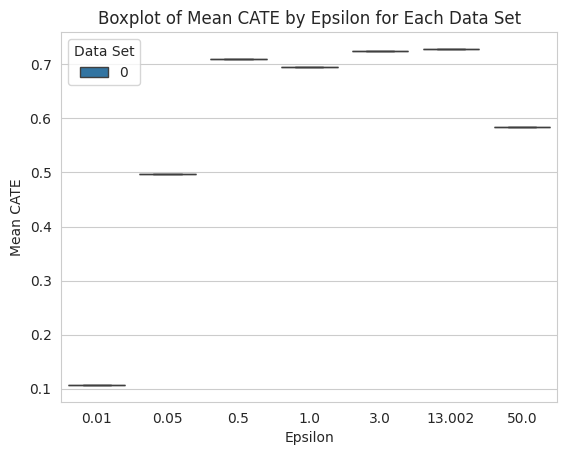

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame containing the data
# Create the boxplot with hue='Data Set'
sns.boxplot(x='Epsilon', y='Mean CATE', data=combined_values, hue='Data Set')

# Set the title and labels
plt.title('Boxplot of Mean CATE by Epsilon for Each Data Set')
plt.xlabel('Epsilon')
plt.ylabel('Mean CATE')

# Show the plot
plt.show()

In [ ]:
pd.DataFrame(results_list[0]['CATE Estimates']).to_csv("estimatedCATE_n1000.csv")

In [ ]:
# Save each set of CATE Estimates to a CSV file by Epsilon level
for record in results_list:
    epsilon = record['epsilon conservative']
    estimates = record['CATE Estimates']
    df = pd.DataFrame({
        'CATE Estimates': estimates
    })
    filename = f'sim_1_{epsilon}_n10000.csv'
    df.to_csv(filename, index=False)

# dimensionality


In [ ]:
def data_simulation_covariates(n, num_covariates):
    # Generate random covariates
    covariates = [np.random.normal(size=n) for _ in range(num_covariates)]

    # Create the design matrix
    x = np.column_stack(covariates)

    # Generate treatment indicator
    p = 0.5
    w = np.random.binomial(1, p, size=n)

    # Generate outcomes and treatment effects
    m = np.maximum(0, x[:, 0] + x[:, 1]) + np.maximum(0, x[:, 2] + x[:, 3])
    tau = x[:, 0] + np.log(1 + np.exp(x[:, 1])) ** 2
    mu1 = m + tau / 2
    mu0 = m - tau / 2
    y = w * mu1 + (1 - w) * mu0 + 0.5 * np.random.normal(size=n)

    # Create a dictionary to hold the data
    data = {'w': w, 'm': m, 'tau': tau, 'mu1': mu1, 'mu0': mu0, 'y': y}
    for i in range(num_covariates):
        data[f'covariate_{i+1}'] = covariates[i]

    # Create a Pandas DataFrame
    df = pd.DataFrame(data)

    return df

In [ ]:
# install PCNNs and simulation setup
!pip install git+https://github.com/GilianPonte/PrivateTargeting.git -q

import os
import pandas as pd
import numpy as np
import random
import tensorflow
import causal_inference
from causal_inference import simulation_data
from causal_inference import strategy1
import time

try:
    seeds_data = np.genfromtxt('/content/seeds_data.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")
try:
    seeds_training = np.genfromtxt('/content/seeds_training.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")

# set time
start_time = time.time()
tensorflow.config.experimental.enable_op_determinism()
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

# Read seeds_data and seeds_training from file
seeds_data = read_file("seeds_data.txt")
seeds_training = read_file("seeds_training.txt")

# simulation parameters
iterations = 1
results_list = []
noise_multipliers = [52.174] # Initialize lists to store results for each noise multiplier ,8.7,3.4,1.12,0.845,0.567,0.3543

for i in range(iterations):
  print("Iteration: {}".format(i, i))
  random.seed(seeds_data[i])
  tensorflow.random.set_seed(seeds_data[i])
  np.random.seed(seeds_data[i])
  tensorflow.keras.utils.set_random_seed(seeds_data[i])

  # read data
  data = data_simulation_covariates(10000,25) # we vary the second argument here from 10, 50, 100,1000

  # Separate the columns into different DataFrames
  covariate_columns = [col for col in data.columns if col.startswith('covariate_')]
  x = data[covariate_columns]
  w, m, tau, mu1, mu0, y = data[['w']], data[['m']], data[['tau']], data[['mu1']], data[['mu0']], data[['y']]

  # Loop through each noise multiplier value
  for noise_index, noise_multiplier in enumerate(noise_multipliers):
    print(noise_multiplier)

    for a in range(1):
      combined_number = (noise_index * 100) + a
      print("Combined number: {}".format(combined_number, combined_number))
      random.seed(seeds_training[combined_number])
      tensorflow.random.set_seed(seeds_training[combined_number])
      np.random.seed(seeds_training[combined_number])
      tensorflow.keras.utils.set_random_seed(seeds_training[combined_number])

      # Define the directory based on the noise multiplier
      directory = f"tuner_{noise_multiplier}_iteration_{i}_algo_run_{a}211212"
      os.makedirs(directory, exist_ok=True)  # Create the directory if it doesn't exist

      # Call the function with the current noise_multiplier value
      if noise_multiplier == 0:
        print("no privacy")
        average_treatment_effect, CATE_estimates, tau_hat = strategy1.cnn(X = x,
                                                                  Y = y,
                                                                  T = w,
                                                                  scaling = True,
                                                                  batch_size = 100,
                                                                  epochs = 100,
                                                                  max_epochs = 10,
                                                                  folds = 10,
                                                                  directory = directory,
                                                                  seed = seeds_training[combined_number])
        epsilon = 0
        n = len(x)
        epsilon_conservative = 0
      if noise_multiplier != 0:
        average_treatment_effect, CATE_estimates, tau_hat, n, epsilon, noise_multiplier, epsilon_conservative = strategy1.pcnn(
            X=x,
            Y=y,
            T=w,
            scaling=True,
            batch_size=100,
            epochs=100,
            max_epochs=10,
            fixed_model = True,
            directory=directory,  # Use the directory variable here
            noise_multiplier=noise_multiplier,
            seed = seeds_training[combined_number]
            )
      # Append the results to the list
      results_list.append({
          'Noise Multiplier': noise_multiplier,
          'Average Treatment Effect': average_treatment_effect,
          'CATE Estimates': CATE_estimates,
          'Epsilon': epsilon,
          'epsilon conservative': epsilon_conservative,
          'true ate': data[['tau']].mean(),
          'true CATE': data[['tau']],
          'sample size': n,
          'data set' : i,
          'iteration' : a,
          'covariates' : x,

          })

      np.save(f"results_list_{noise_multiplier}", results_list)

      # Print or use the DataFrames as needed
      print(results_list)
      end_time = time.time()
      execution_time = end_time - start_time
      print("Execution time one sim: {:.2f} seconds".format(execution_time))

  Preparing metadata (setup.py) ... done
Iteration: 0
52.174
Combined number: 0
DP-SGD performed over 10000 examples with 100 examples per iteration, noise
multiplier 52.174 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 0.0001 computed
with RDP accounting:
    Epsilon with each example occurring once per epoch:         0.643
    Epsilon assuming Poisson sampling (*):                      0.050

User-level DP with add-or-remove-one adjacency at delta = 0.0001 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.643
    Epsilon assuming Poisson sampling (*):                      0.050

(*) Poisson sampling is not usually done in training pipelines, but assuming
that the data was randomly shuffled, it is believed that the actual epsilon
shoul

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'relu', 'units_1': 16, 'units_2': 512, 'units_3': 32, 'tuner/epochs': 10, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 1.15, sd(m_x) = 1.178 and mean(e_x) = 0.50, sd(e_x) = 0.033
Fold 1: mean(m_x) = 1.18, sd(m_x) = 1.213 and mean(e_x) = 0.50, sd(e_x) = 0.031
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.71, sd(tau_hat) = 0.632
Fold 1: mean(tau_hat) = 0.69, sd(tau_hat) = 0.615
ATE = 0.6987424680825323
[{'Noise Multiplier': 52.174, 'Average Treatment Effect': 0.6987424680825323, 'CATE Estimates': array([ 1.25770402,  1.81162274,  0.34512377, ...,  0.84840846,
       -0.57361031,  1.51862657]), 'Epsilon': 0.0001, 'epsilon conservative': 0.05, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, 'data set': 0, 'iteration': 0, 'covariates':       covariate_1  covariate_2  covariate_3  covariate_4  covariate_5  \
0        0.064739     1.279096     1.066144    -0.278968     0.331180   
1        0.408127     1.538532    -0.776965     0.299686    -1.375021   
2        0.139255     0.070398    -0.567934     0.002388     0.007849   
3       

In [ ]:
pd.DataFrame(results_list[0]['CATE Estimates']).to_csv("sim_1_0.05_n10000_k25.csv")

# Confounding

In [ ]:
def data_simulation_covariates_confounding(n, num_covariates):
    # Generate random covariates
    covariates = [np.random.normal(size=n) for _ in range(num_covariates)]

    # Create the design matrix
    x = np.column_stack(covariates)

    # Generate treatment indicator
    p = 1/(1 + np.exp(x[:,1] + x[:,2] + x[:,3]))
    w = np.random.binomial(1, p, size=n)

    # Generate outcomes and treatment effects
    m = np.maximum(0, x[:, 0] + x[:, 1]) + np.maximum(0, x[:, 2] + x[:, 3])
    tau = x[:, 0] + np.log(1 + np.exp(x[:, 1])) ** 2
    mu1 = m + tau / 2
    mu0 = m - tau / 2
    y = w * mu1 + (1 - w) * mu0 + 0.5 * np.random.normal(size=n)

    # Create a dictionary to hold the data
    data = {'w': w, 'm': m, 'tau': tau, 'mu1': mu1, 'mu0': mu0, 'y': y}
    for i in range(num_covariates):
        data[f'covariate_{i+1}'] = covariates[i]

    # Create a Pandas DataFrame
    df = pd.DataFrame(data)

    return df

In [ ]:
# install PCNNs and simulation setup
!pip install git+https://github.com/GilianPonte/PrivateTargeting.git -q

import os
import pandas as pd
import numpy as np
import random
import tensorflow
import causal_inference
from causal_inference import simulation_data
from causal_inference import strategy1
import time

try:
    seeds_data = np.genfromtxt('/content/seeds_data.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")
try:
    seeds_training = np.genfromtxt('/content/seeds_training.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")

# set time
start_time = time.time()
tensorflow.config.experimental.enable_op_determinism()
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

# Read seeds_data and seeds_training from file
seeds_data = read_file("seeds_data.txt")
seeds_training = read_file("seeds_training.txt")

# simulation parameters
iterations = 1
results_list = []
noise_multipliers = [0.48033, 0.7174, 1.5088, 3.5953, 6.5978, 52.174, 204] # Initialize lists to store results for each noise multiplier ,8.7,3.4,1.12,0.845,0.567,0.3543

for i in range(iterations):
  print("Iteration: {}".format(i, i))
  random.seed(seeds_data[i])
  tensorflow.random.set_seed(seeds_data[i])
  np.random.seed(seeds_data[i])
  tensorflow.keras.utils.set_random_seed(seeds_data[i])

  # read data
  data = data_simulation_covariates_confounding(10000,10) # we vary the second argument here from 10, 50, 100,1000

  # Separate the columns into different DataFrames
  covariate_columns = [col for col in data.columns if col.startswith('covariate_')]
  x = data[covariate_columns]
  w, m, tau, mu1, mu0, y = data[['w']], data[['m']], data[['tau']], data[['mu1']], data[['mu0']], data[['y']]

  # Loop through each noise multiplier value
  for noise_index, noise_multiplier in enumerate(noise_multipliers):
    print(noise_multiplier)

    for a in range(1):
      combined_number = (noise_index * 100) + a
      print("Combined number: {}".format(combined_number, combined_number))
      random.seed(seeds_training[combined_number])
      tensorflow.random.set_seed(seeds_training[combined_number])
      np.random.seed(seeds_training[combined_number])
      tensorflow.keras.utils.set_random_seed(seeds_training[combined_number])

      # Define the directory based on the noise multiplier
      directory = f"tuner_{noise_multiplier}_iteration_{i}_algo_run_{a}21_confounding_1212"
      os.makedirs(directory, exist_ok=True)  # Create the directory if it doesn't exist

      # Call the function with the current noise_multiplier value
      if noise_multiplier == 0:
        print("no privacy")
        average_treatment_effect, CATE_estimates, tau_hat = strategy1.cnn(X = x,
                                                                  Y = y,
                                                                  T = w,
                                                                  scaling = True,
                                                                  batch_size = 100,
                                                                  epochs = 100,
                                                                  max_epochs = 10,
                                                                  folds = 10,
                                                                  directory = directory,
                                                                  seed = seeds_training[combined_number])
        epsilon = 0
        n = len(x)
        epsilon_conservative = 0
      if noise_multiplier != 0:
        average_treatment_effect, CATE_estimates, tau_hat, n, epsilon, noise_multiplier, epsilon_conservative = strategy1.pcnn(
            X=x,
            Y=y,
            T=w,
            scaling=True,
            batch_size=100,
            epochs=100,
            max_epochs=10,
            fixed_model = True,
            directory=directory,  # Use the directory variable here
            noise_multiplier=noise_multiplier,
            seed = seeds_training[combined_number]
            )
      # Append the results to the list
      results_list.append({
          'Noise Multiplier': noise_multiplier,
          'Average Treatment Effect': average_treatment_effect,
          'CATE Estimates': CATE_estimates,
          'Epsilon': epsilon,
          'epsilon conservative': epsilon_conservative,
          'true ate': data[['tau']].mean(),
          'true CATE': data[['tau']],
          'sample size': n,
          'data set' : i,
          'iteration' : a,
          'covariates' : x,

          })

      np.save(f"results_list_{noise_multiplier}", results_list)

      # Print or use the DataFrames as needed
      print(results_list)
      end_time = time.time()
      execution_time = end_time - start_time
      print("Execution time one sim: {:.2f} seconds".format(execution_time))

  Preparing metadata (setup.py) ... done
Iteration: 0
0.48033
Combined number: 0
DP-SGD performed over 10000 examples with 100 examples per iteration, noise
multiplier 0.48033 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 0.0001 computed
with RDP accounting:
    Epsilon with each example occurring once per epoch:       303.407
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 0.0001 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       303.407
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in training pipelines, but assuming
that the data was randomly shuffled, it is believed that the actual epsilon
sho

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 512, 'activation': 'leaky-relu', 'units_1': 256, 'units_2': 32, 'units_3': 512, 'tuner/epochs': 10, 'tuner/initial_epoch': 4, 'tuner/bracket': 1, 'tuner/round': 1, 'tuner/trial_id': '0019'}
Fold 0: mean(m_x) = 0.93, sd(m_x) = 0.959 and mean(e_x) = 0.52, sd(e_x) = 0.288
Fold 1: mean(m_x) = 0.93, sd(m_x) = 0.955 and mean(e_x) = 0.49, sd(e_x) = 0.292
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.65, sd(tau_hat) = 0.698
Fold 1: mean(tau_hat) = 0.52, sd(tau_hat) = 0.750
ATE = 0.5838301961762831
[{'Noise Multiplier': 0.48033, 'Average Treatment Effect': 0.5838301961762831, 'CATE Estimates': array([ 1.00272822,  1.65808702,  0.89190692, ...,  0.51852435,
       -1.01391768,  0.72131199]), 'Epsilon': 0.0001, 'epsilon conservative': 50.0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, 'data set': 0, 'iteration': 0, 'covariates':       covariate_1  covariate_2  covariate_3  covariate_4  covariate_5  \
0        0.064739     1.279096     1.066144    -0.278968     0.331180   
1        0.408127     1.538532    -0.776965     0.299686    -1.375021   
2        0.139255     0.070398    -0.567934     0.002388     0.007849   
3      

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 256, 'activation': 'relu', 'units_1': 256, 'units_2': 64, 'tuner/epochs': 10, 'tuner/initial_epoch': 4, 'tuner/bracket': 1, 'tuner/round': 1, 'tuner/trial_id': '0021'}
Fold 0: mean(m_x) = 0.96, sd(m_x) = 1.011 and mean(e_x) = 0.50, sd(e_x) = 0.290
Fold 1: mean(m_x) = 0.98, sd(m_x) = 1.006 and mean(e_x) = 0.50, sd(e_x) = 0.290
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.66, sd(tau_hat) = 1.229
Fold 1: mean(tau_hat) = 0.80, sd(tau_hat) = 1.447
ATE = 0.7286955141082406
[{'Noise Multiplier': 0.48033, 'Average Treatment Effect': 0.5838301961762831, 'CATE Estimates': array([ 1.00272822,  1.65808702,  0.89190692, ...,  0.51852435,
       -1.01391768,  0.72131199]), 'Epsilon': 0.0001, 'epsilon conservative': 50.0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, 'data set': 0, 'iteration': 0, 'covariates':       covariate_1  covariate_2  covariate_3  covariate_4  covariate_5  \
0        0.064739     1.279096     1.066144    -0.278968     0.331180   
1        0.408127     1.538532    -0.776965     0.299686    -1.375021   
2        0.139255     0.070398    -0.567934     0.002388     0.007849   
3      

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 256, 'activation': 'relu', 'units_1': 256, 'units_2': 64, 'units_3': 8, 'tuner/epochs': 10, 'tuner/initial_epoch': 4, 'tuner/bracket': 1, 'tuner/round': 1, 'tuner/trial_id': '0018'}
Fold 0: mean(m_x) = 1.00, sd(m_x) = 1.003 and mean(e_x) = 0.51, sd(e_x) = 0.284


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 0.99, sd(m_x) = 0.995 and mean(e_x) = 0.50, sd(e_x) = 0.296
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.72, sd(tau_hat) = 1.365
Fold 1: mean(tau_hat) = 0.73, sd(tau_hat) = 1.380
ATE = 0.7251549469262362
[{'Noise Multiplier': 0.48033, 'Average Treatment Effect': 0.5838301961762831, 'CATE Estimates': array([ 1.00272822,  1.65808702,  0.89190692, ...,  0.51852435,
       -1.01391768,  0.72131199]), 'Epsilon': 0.0001, 'epsilon conservative': 50.0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, 'data set': 0, 'iteration': 0, 'covariates':       covariate_1  covariate_2  covariate_3  covariate_4  covariate_5  \
0        0.064739     1.279096     1.066144    -0.278968     0.331180   
1        0.408127     1.538532    -0.776965     0.299686    -1.375021   
2        0.139255     0.070398    -0.567934     0.002388     0.007849   
3      

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 512, 'activation': 'relu', 'units_1': 16, 'units_2': 8, 'units_3': 32, 'tuner/epochs': 10, 'tuner/initial_epoch': 4, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0012'}
Fold 0: mean(m_x) = 0.96, sd(m_x) = 0.985 and mean(e_x) = 0.50, sd(e_x) = 0.292


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 0.96, sd(m_x) = 0.992 and mean(e_x) = 0.50, sd(e_x) = 0.290
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.69, sd(tau_hat) = 0.769
Fold 1: mean(tau_hat) = 0.70, sd(tau_hat) = 0.773
ATE = 0.6944305097419768
[{'Noise Multiplier': 0.48033, 'Average Treatment Effect': 0.5838301961762831, 'CATE Estimates': array([ 1.00272822,  1.65808702,  0.89190692, ...,  0.51852435,
       -1.01391768,  0.72131199]), 'Epsilon': 0.0001, 'epsilon conservative': 50.0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, 'data set': 0, 'iteration': 0, 'covariates':       covariate_1  covariate_2  covariate_3  covariate_4  covariate_5  \
0        0.064739     1.279096     1.066144    -0.278968     0.331180   
1        0.408127     1.538532    -0.776965     0.299686    -1.375021   
2        0.139255     0.070398    -0.567934     0.002388     0.007849   
3      

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 512, 'activation': 'relu', 'units_1': 256, 'units_2': 16, 'units_3': 64, 'tuner/epochs': 4, 'tuner/initial_epoch': 2, 'tuner/bracket': 2, 'tuner/round': 1, 'tuner/trial_id': '0004'}
Fold 0: mean(m_x) = 0.90, sd(m_x) = 0.974 and mean(e_x) = 0.50, sd(e_x) = 0.294
Fold 1: mean(m_x) = 0.93, sd(m_x) = 0.977 and mean(e_x) = 0.50, sd(e_x) = 0.287
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.67, sd(tau_hat) = 1.067
Fold 1: mean(tau_hat) = 0.75, sd(tau_hat) = 1.026
ATE = 0.7102418872684241
[{'Noise Multiplier': 0.48033, 'Average Treatment Effect': 0.5838301961762831, 'CATE Estimates': array([ 1.00272822,  1.65808702,  0.89190692, ...,  0.51852435,
       -1.01391768,  0.72131199]), 'Epsilon': 0.0001, 'epsilon conservative': 50.0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, 'data set': 0, 'iteration': 0, 'covariates':       covariate_1  covariate_2  covariate_3  covariate_4  covariate_5  \
0        0.064739     1.279096     1.066144    -0.278968     0.331180   
1        0.408127     1.538532    -0.776965     0.299686    -1.375021   
2        0.139255     0.070398    -0.567934     0.002388     0.007849   
3      

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 32, 'activation': 'leaky-relu', 'units_1': 512, 'units_2': 16, 'units_3': 64, 'tuner/epochs': 10, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 1.01, sd(m_x) = 1.003 and mean(e_x) = 0.50, sd(e_x) = 0.291


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 0.97, sd(m_x) = 1.001 and mean(e_x) = 0.50, sd(e_x) = 0.290
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.47, sd(tau_hat) = 0.163
Fold 1: mean(tau_hat) = 0.53, sd(tau_hat) = 0.150
ATE = 0.49776566448453813
[{'Noise Multiplier': 0.48033, 'Average Treatment Effect': 0.5838301961762831, 'CATE Estimates': array([ 1.00272822,  1.65808702,  0.89190692, ...,  0.51852435,
       -1.01391768,  0.72131199]), 'Epsilon': 0.0001, 'epsilon conservative': 50.0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, 'data set': 0, 'iteration': 0, 'covariates':       covariate_1  covariate_2  covariate_3  covariate_4  covariate_5  \
0        0.064739     1.279096     1.066144    -0.278968     0.331180   
1        0.408127     1.538532    -0.776965     0.299686    -1.375021   
2        0.139255     0.070398    -0.567934     0.002388     0.007849   
3     

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 64, 'activation': 'leaky-relu', 'units_1': 256, 'units_2': 8, 'units_3': 16, 'tuner/epochs': 10, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 0.97, sd(m_x) = 1.046 and mean(e_x) = 0.50, sd(e_x) = 0.299
Fold 1: mean(m_x) = 0.95, sd(m_x) = 1.020 and mean(e_x) = 0.50, sd(e_x) = 0.282
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.11, sd(tau_hat) = 0.171
Fold 1: mean(tau_hat) = 0.11, sd(tau_hat) = 0.171
ATE = 0.1068639014095068
[{'Noise Multiplier': 0.48033, 'Average Treatment Effect': 0.5838301961762831, 'CATE Estimates': array([ 1.00272822,  1.65808702,  0.89190692, ...,  0.51852435,
       -1.01391768,  0.72131199]), 'Epsilon': 0.0001, 'epsilon conservative': 50.0, 'true ate': tau    0.914625
dtype: float64, 'true CATE':            tau
0     2.389199
1     3.411504
2     0.670646
3     1.211674
4     0.194792
...        ...
9995 -0.838167
9996  7.816234
9997  0.341807
9998 -1.302357
9999  3.133805

[10000 rows x 1 columns], 'sample size': 10000, 'data set': 0, 'iteration': 0, 'covariates':       covariate_1  covariate_2  covariate_3  covariate_4  covariate_5  \
0        0.064739     1.279096     1.066144    -0.278968     0.331180   
1        0.408127     1.538532    -0.776965     0.299686    -1.375021   
2        0.139255     0.070398    -0.567934     0.002388     0.007849   
3      

In [ ]:
results_list

[{'Noise Multiplier': 0.48033,
  'Average Treatment Effect': 0.5838301961762831,
  'CATE Estimates': array([ 1.00272822,  1.65808702,  0.89190692, ...,  0.51852435,
         -1.01391768,  0.72131199]),
  'Epsilon': 0.0001,
  'epsilon conservative': 50.0,
  'true ate': tau    0.914625
  dtype: float64,
  'true CATE':            tau
  0     2.389199
  1     3.411504
  2     0.670646
  3     1.211674
  4     0.194792
  ...        ...
  9995 -0.838167
  9996  7.816234
  9997  0.341807
  9998 -1.302357
  9999  3.133805
  
  [10000 rows x 1 columns],
  'sample size': 10000,
  'data set': 0,
  'iteration': 0,
  'covariates':       covariate_1  covariate_2  covariate_3  covariate_4  covariate_5  \
  0        0.064739     1.279096     1.066144    -0.278968     0.331180   
  1        0.408127     1.538532    -0.776965     0.299686    -1.375021   
  2        0.139255     0.070398    -0.567934     0.002388     0.007849   
  3        1.079066    -0.822581     1.072944     1.283982     0.413035   
 

In [ ]:
# Save each set of CATE Estimates to a CSV file by Epsilon level
for record in results_list:
    epsilon = record['epsilon conservative']
    estimates = record['CATE Estimates']
    df = pd.DataFrame({
        'CATE Estimates': estimates
    })
    filename = f'sim_1_{epsilon}_n10000_confounding.csv'
    df.to_csv(filename, index=False)

In [ ]:
pd.DataFrame(results_list[0]['true CATE']).to_csv("sim_1_n10000_confounding.csv")

# variety of distributional families


In [ ]:
import numpy as np
import pandas as pd

def data_simulation_covariates(n, num_covariates):
    # Generate random covariates from different distributions
    covariates = []
    for i in range(num_covariates):
      if i < num_covariates - 4:
        if i % 2 == 0:
            covariates.append(np.random.normal(loc=0, scale=1, size=n))  # Standard normal distribution
        else:
            covariates.append(np.random.normal(loc=2, scale=2, size=n))  # Normal distribution with different mean and std dev
      elif i == num_covariates - 4 or i == num_covariates - 3:
        if i % 2 == 0:
            covariates.append(np.random.binomial(n=10, p=0.3, size=n))  # Binomial with different parameters
        else:
            covariates.append(np.random.binomial(n=20, p=0.7, size=n))  # Binomial with another set of parameters
      else:
        if i % 2 == 0:
            covariates.append(np.random.exponential(scale=1, size=n))  # Exponential with mean 1
        else:
            covariates.append(np.random.exponential(scale=50, size=n))  # Exponential with mean 50



    # Create the design matrix
    x = np.column_stack(covariates)

    # Generate treatment indicator
    p = 0.95
    w = np.random.binomial(1, p, size=n)

    # Generate outcomes and treatment effects
    m = np.maximum(0, x[:, 0] + x[:, 1]) + np.maximum(0, x[:, 2] + x[:, 3])
    tau = x[:, 0] + np.log(1 + np.exp(x[:, 1])) ** 2
    mu1 = m + tau / 2
    mu0 = m - tau / 2
    y = w * mu1 + (1 - w) * mu0 + 0.5 * np.random.normal(size=n)

    # Create a dictionary to hold the data
    data = {'w': w, 'm': m, 'tau': tau, 'mu1': mu1, 'mu0': mu0, 'y': y}
    for i in range(num_covariates):
        data[f'covariate_{i+1}'] = covariates[i]

    # Create a Pandas DataFrame
    df = pd.DataFrame(data)

    return df


In [ ]:
data_simulation_covariates(10000, 10).describe()

,w,m,tau,mu1,mu0,y,covariate_1,covariate_2,covariate_3,covariate_4,covariate_5,covariate_6,covariate_7,covariate_8,covariate_9,covariate_10
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.949300,4.470058,8.088764,8.514440,0.425676,8.124478,-0.008654,2.014144,0.004615,1.998907,-0.009969,1.992620,2.989700,14.009900,1.003540,50.242942
std,0.219395,2.704750,9.773821,6.890347,3.862417,7.000805,0.997926,1.990326,1.008957,2.019950,1.002107,1.966212,1.448103,2.030915,1.007897,50.514519
min,0.000000,0.000000,-3.559808,-1.779904,-37.718135,-23.607090,-4.035746,-5.521047,-3.681130,-7.376395,-4.300397,-6.450423,0.000000,7.000000,0.000225,0.005823
25%,1.000000,2.441540,1.350804,3.520807,-0.737675,3.166993,-0.689352,0.668409,-0.684510,0.632831,-0.680926,0.661316,2.000000,13.000000,0.285021,14.735815
50%,1.000000,4.230402,4.611805,6.883943,0.927659,6.528198,-0.020188,2.004691,0.015262,2.004338,-0.013679,1.995252,3.000000,14.000000,0.700218,34.605618
75%,1.000000,6.233211,11.474596,11.726424,2.780394,11.413473,0.659316,3.351625,0.688984,3.354971,0.670139,3.283387,4.000000,15.000000,1.390751,69.205271
max,1.000000,18.276715,99.397400,61.679265,11.487515,61.863085,4.132138,9.961282,3.752428,10.241831,4.037489,9.877195,9.000000,20.000000,11.066084,501.157341


In [ ]:
data_simulation_covariates(10000, 10).describe()

,w,m,tau,mu1,mu0,y,covariate_1,covariate_2,covariate_3,covariate_4,covariate_5,covariate_6,covariate_7,covariate_8,covariate_9,covariate_10
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.945900,4.488507,8.047309,8.512162,0.464853,8.080727,0.017303,2.006246,-0.000309,2.016438,0.003717,1.998796,3.004100,13.995000,0.998816,50.280618
std,0.226226,2.661624,9.576543,6.741352,3.818081,6.878756,1.005130,1.980811,1.008443,2.015237,0.992767,1.996574,1.458662,2.043867,1.004132,50.562393
min,0.000000,0.000000,-3.035195,-1.464994,-31.867019,-20.104854,-3.794676,-5.849002,-4.070477,-5.733719,-3.628520,-5.453008,0.000000,5.000000,0.000423,0.003573
25%,1.000000,2.535876,1.417314,3.638605,-0.761381,3.231789,-0.653871,0.659290,-0.673832,0.627640,-0.680989,0.612343,2.000000,13.000000,0.286650,14.479888
50%,1.000000,4.319368,4.597253,6.966907,0.877527,6.562871,0.017688,2.009729,-0.006024,2.010139,-0.000087,2.004540,3.000000,14.000000,0.679259,34.420291
75%,1.000000,6.243507,11.681964,11.793224,2.872627,11.395579,0.698379,3.364596,0.675179,3.365991,0.686361,3.349405,4.000000,15.000000,1.386612,69.831869
max,1.000000,16.073047,79.460605,50.095977,10.432602,50.652865,4.015680,8.991236,3.886949,9.852423,4.084444,10.348688,9.000000,20.000000,9.528672,432.555854


In [ ]:
def pcnn(X, Y, T, scaling=True, batch_size=100, epochs=100, max_epochs=1, directory="tuner", fixed_model = False, noise_multiplier=1, seed = 1):
    """
    Private Causal Neural Network (PCNN) algorithm for estimating average treatment effects.

    Args:
    X (numpy.ndarray): Features matrix.
    Y (numpy.ndarray): Outcome vector.
    T (numpy.ndarray): Treatment vector.
    scaling (bool, optional): Whether to scale the features matrix. Default is True.
    simulations (int, optional): Number of simulations. Default is 1.
    batch_size (int, optional): Batch size for training. Default is 100.
    epochs (int, optional): Number of epochs for training. Default is 100.
    max_epochs (int, optional): Maximum number of epochs for hyperparameter optimization. Default is 10.
    directory (str, optional): Directory for saving hyperparameter optimization results. Default is "tuner".
    noise_multiplier (float, optional): Noise multiplier for differential privacy. Default is 1.

    Returns:
    tuple: Tuple containing average treatment effect, CATE estimates, trained tau_hat model, and privacy risk .
    """

    import random
    import re
    import numpy as np
    import tensorflow as tf
    import tensorflow_privacy
    from tensorflow import keras
    from keras.layers import Activation, LeakyReLU
    from keras import backend as K
    from keras import layers
    from keras.utils import get_custom_objects
    from sklearn.model_selection import KFold
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.linear_model import LogisticRegression
    import pandas as pd
    import math
    import keras_tuner

    # set random seeds
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)
    tf.keras.utils.set_random_seed(seed)

    # Check if batch size divides the data evenly
    if (len(X)/2) % batch_size != 0:
        divisors = [i for i in range(1, int(math.sqrt((len(X)/2))) + 1) if (len(X)/2) % i == 0]
        divisors += [(len(X)/2) // i for i in divisors if (len(X)/2) // i != i]
        divisors.sort()
        raise ValueError("The batch size you have specified does not divide the data into a whole number.\nPlease select one of the following possible batch sizes: {}".format(np.round(divisors)))

    # Calculate epsilon
    statement = tensorflow_privacy.compute_dp_sgd_privacy_statement(
        number_of_examples=len(X),
        batch_size=batch_size,
        num_epochs=epochs,
        noise_multiplier=noise_multiplier,
        delta=1/len(X),
        used_microbatching=False,
        max_examples_per_user=1
    )
    print(statement)

    # Extract epsilon and noise_multiplier from the statement
    numbers = [float(num) if '.' in num else int(num) for num in re.findall(r'\d+\.\d+|\d+', statement)]
    n, epsilon, noise_multiplier, epsilon_conservative = numbers[0], numbers[8], numbers[2], numbers[7]


    # callback settings for early stopping and saving
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, mode="min")  # early stopping just like in rboost

    # define ate loss is equal to mean squared error between pseudo outcome and prediction of net.
    def ATE(y_true, y_pred):
        return tf.reduce_mean(y_pred, axis=-1)  # Note the `axis=-1`

    def generate_fixed_architecture(X):
      model = keras.Sequential()
      model.add(keras.Input(shape=(X.shape[1],)))

      # Define the architecture with 4 layers
      num_layers = 4
      units = 64

      for _ in range(num_layers):
          model.add(layers.Dense(units, activation='tanh')) # https://arxiv.org/pdf/2007.14191.pdf
          units = max(units // 2, 1)  # Reduce the number of units by half for each subsequent layer

      # Add output layer
      model.add(layers.Dense(1, activation='linear'))

      model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=0.001),
        loss="mean_squared_error",
        metrics=["MSE"],
      )
      return model

    average_treatment_effect = []  # storage of ate estimates
    all_CATE_estimates = []  # Store CATE estimates for each simulation

    ## scale the data for well-behaved gradients
    if scaling == True:
        scaler0 = MinMaxScaler(feature_range=(-1, 1))
        scaler0 = scaler0.fit(X)
        X = scaler0.transform(X)
        X = pd.DataFrame(X)

    ## Add leaky-relu so we can use it as a string
    get_custom_objects().update({'leaky-relu': Activation(LeakyReLU(alpha=0.2))})

    def build_model(hp):
        model = keras.Sequential()
        model.add(keras.Input(shape=(X.shape[1],)))
        # Tune the number of layers.
        for i in range(hp.Int("num_layers", 1, 4)):
            model.add(
                layers.Dense(
                    # Tune number of units separately.
                    units=hp.Choice(f"units_{i}", [8, 16, 32, 64, 256, 512]),
                    activation=hp.Choice("activation", ["leaky-relu", "relu"]),
                )
            )
        model.add(layers.Dense(1, activation="linear"))

        model.compile(
            optimizer=keras.optimizers.Adam(learning_rate=0.001),
            loss="mean_squared_error",
            metrics=["MSE"],
        )
        return model

    # for epsilon calculation. Shuffeling serves as a Poisson sampling substitute (Ponomareva et al. 2023)
    idx = np.random.permutation(pd.DataFrame(X).index)
    X = np.array(pd.DataFrame(X).reindex(idx))
    Y = np.array(pd.DataFrame(Y).reindex(idx))
    T = np.array(pd.DataFrame(T).reindex(idx))

    # save models
    checkpoint_filepath_mx = f"{directory}/_{epsilon}_m_x.hdf5"
    checkpoint_filepath_taux = f"{directory}/_{epsilon}_tau_x.hdf5"

    mx_callbacks = [callback,
      tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath_mx, save_weights_only=False, monitor='val_loss', mode='min', save_freq="epoch", save_best_only=True,)]
    tau_hat_callbacks = [callback,
      tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath_taux, save_weights_only=False, monitor='val_loss', mode='min', save_freq="epoch", save_best_only=True,)]
    y_tilde_hat = []  # collect all the \tilde{Y}
    T_tilde_hat = []  # collect all the \tilde{T}
    m_x_hat = []  # collect all m_x_hat for print
    e_x_hat = []  # collect all e_x_hat for print

    print("hyperparameter optimization for yhat")
    tuner = keras_tuner.Hyperband(hypermodel=build_model, objective="val_loss", max_epochs=max_epochs, overwrite=True, directory=directory, project_name="yhat",seed=seed,) # random search is at least as slow..

    tuner.search(X, Y, epochs=epochs, validation_split=0.25, verbose=0, callbacks=[mx_callbacks])
    # Get the optimal hyperparameters
    best_hps = tuner.get_best_hyperparameters()[0]
    print("the optimal architecture is: " + str(best_hps.values))

    cv = KFold(n_splits=2, shuffle=False)  # K-fold validation shuffle is off to prevent additional noise?

    for fold, (train_idx, test_idx) in enumerate(cv.split(X)):
      # set random seeds
      np.random.seed(seed)
      tf.random.set_seed(seed)
      random.seed(seed)
      tf.keras.utils.set_random_seed(seed)

      # training model for m(x)
      model_m_x = tuner.hypermodel.build(best_hps)
      model_m_x.fit(X[train_idx],
                    Y[train_idx],
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=(X[test_idx], Y[test_idx]),
                    callbacks=mx_callbacks,
                    verbose=0)
      model_m_x = tuner.hypermodel.build(best_hps)
      model_m_x.build(input_shape=(None, X.shape[1]))
      model_m_x.load_weights(checkpoint_filepath_mx)
      m_x = model_m_x.predict(x=X[test_idx], verbose=0).reshape(len(Y[test_idx]))  # obtain \hat{m}(x) from test set

      # obtain \tilde{Y} = Y_{i} - \hat{m}(x)
      truth = Y[test_idx].T.reshape(len(Y[test_idx]))
      y_tilde = truth - m_x
      y_tilde_hat = np.concatenate((y_tilde_hat, y_tilde))  # cbind in r
      m_x_hat = np.concatenate((m_x_hat, m_x))  # cbind in r

      # fit \hat{e}(x)
      clf = LogisticRegression(verbose=0).fit(X[train_idx], np.array(T[train_idx]).reshape(len(T[train_idx])))
      e_x = clf.predict_proba(X[test_idx])  # obtain \hat{e}(x)
      print(f"Fold {fold}: mean(m_x) = {np.round(np.mean(m_x), 2):.2f}, sd(m_x) = {np.round(np.std(m_x), 3):.3f} and mean(e_x) = {np.round(np.mean(e_x[:, 1]), 2):.2f}, sd(e_x) = {np.round(np.std(e_x[:, 1]), 3):.3f}")

      # obtain \tilde{T} = T_{i} - \hat{e}(x)
      truth = T[test_idx].T.reshape(len(T[test_idx]))
      T_tilde = truth - e_x[:, 1]
      T_tilde_hat = np.concatenate((T_tilde_hat, T_tilde))
      e_x_hat = np.concatenate((e_x_hat, e_x[:, 1]))
      print(pd.DataFrame(y_tilde).describe())

    # storage
    CATE_estimates = []

    # pseudo_outcome and weights
    pseudo_outcome = (y_tilde_hat / T_tilde_hat)  # pseudo_outcome = \tilde{Y} / \tilde{T}
    w_weights = np.square(T_tilde_hat)  # \tilde{T}**2

    cv = KFold(n_splits=2, shuffle=False)

    print("training for tau hat")
    for fold, (train_idx, test_idx) in enumerate(cv.split(X)):
      # set random seeds
      np.random.seed(seed)
      tf.random.set_seed(seed)
      random.seed(seed)
      tf.keras.utils.set_random_seed(seed)

      tau_hat = generate_fixed_architecture(X) # an alternative is to fix the values of hyperparameters to some reasonable defaults and forgo hyperparameter tuning altogether (Ponomareva et al. 2023)
      if fixed_model == False:
        tau_hat = tuner.hypermodel.build(best_hps)
      tau_hat.compile(optimizer=tensorflow_privacy.DPKerasAdamOptimizer(l2_norm_clip=4, noise_multiplier=noise_multiplier, num_microbatches=batch_size, learning_rate=0.001), loss=tf.keras.losses.MeanSquaredError(reduction=tf.losses.Reduction.NONE), metrics=[ATE]) # the microbatches are equal to the batch size. No microbatching applied.
      history_tau = tau_hat.fit(
        X[train_idx],
        pseudo_outcome[train_idx],
        sample_weight=w_weights[train_idx],
        epochs=epochs,
        batch_size=batch_size,
        callbacks=tau_hat_callbacks,
        validation_data=(X[test_idx], pseudo_outcome[test_idx]),
        verbose=0)
      if fixed_model == False:
        tau_hat = tuner.hypermodel.build(best_hps)
        tau_hat.build(input_shape=(None, X.shape[1]))
      tau_hat.load_weights(checkpoint_filepath_taux)
      CATE = tau_hat.predict(x=X[test_idx], verbose=0).reshape(len(X[test_idx]))
      print(f"Fold {fold}: mean(tau_hat) = {np.round(np.mean(CATE), 2):.2f}, sd(tau_hat) = {np.round(np.std(CATE), 3):.3f}")

      CATE_estimates = np.concatenate((CATE_estimates, CATE))  # store CATE's
    average_treatment_effect = np.mean(CATE_estimates)
    X = X[np.argsort(idx)]
    Y = Y[np.argsort(idx)]
    T = T[np.argsort(idx)]
    CATE_estimates = CATE_estimates[np.argsort(idx)]
    print(f"ATE = {average_treatment_effect}")
    return average_treatment_effect, CATE_estimates, tau_hat, n, epsilon, noise_multiplier, epsilon_conservative

In [ ]:
# install PCNNs and simulation setup
#!pip install git+https://github.com/GilianPonte/PrivateTargeting.git -q

import os
import pandas as pd
import numpy as np
import random
import tensorflow
import causal_inference
from causal_inference import simulation_data
from causal_inference import strategy1
import time

try:
    seeds_data = np.genfromtxt('/content/seeds_data.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")
try:
    seeds_training = np.genfromtxt('/content/seeds_training.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")

# set time
start_time = time.time()
tensorflow.config.experimental.enable_op_determinism()
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

# Read seeds_data and seeds_training from file
seeds_data = read_file("seeds_data.txt")
seeds_training = read_file("seeds_training.txt")

# simulation parameters
iterations = 1
results_list = []
noise_multipliers = [0.48033, 0.7174,1.5088,3.5953, 6.5978, 52.174, 204,0] #0.48033, 0.7174,3.5953, 6.5978, 52.174, 204  # Initialize lists to store results for each noise multiplier

for i in range(iterations):
  print("Iteration: {}".format(i, i))
  random.seed(seeds_data[i])
  tensorflow.random.set_seed(seeds_data[i])
  np.random.seed(seeds_data[i])
  tensorflow.keras.utils.set_random_seed(seeds_data[i])

  # read data
  data = data_simulation_covariates(10000,10)

  # Separate the columns into different DataFrames
  covariate_columns = [col for col in data.columns if col.startswith('covariate_')]
  x = data[covariate_columns]
  #print(x)
  w, m, tau, mu1, mu0, y = data[['w']], data[['m']], data[['tau']], data[['mu1']], data[['mu0']], data[['y']]

  # Loop through each noise multiplier value
  for noise_index, noise_multiplier in enumerate(noise_multipliers):
    print(noise_multiplier)

    for a in range(1):
      combined_number = (noise_index * 100) + a
      print("Combined number: {}".format(combined_number, combined_number))
      random.seed(seeds_training[combined_number])
      tensorflow.random.set_seed(seeds_training[combined_number])
      np.random.seed(seeds_training[combined_number])
      tensorflow.keras.utils.set_random_seed(seeds_training[combined_number])

      # Define the directory based on the noise multiplier
      directory = f"tuner_{noise_multiplier}_iteration_{i}_algo_run_{a}_1"
      os.makedirs(directory, exist_ok=True)  # Create the directory if it doesn't exist

      # Call the function with the current noise_multiplier value
      if noise_multiplier == 0:
        print("no privacy")
        average_treatment_effect, CATE_estimates, tau_hat = strategy1.cnn(X = x,
                                                                  Y = y,
                                                                  T = w,
                                                                  scaling = True,
                                                                  batch_size = 100,
                                                                  epochs = 100,
                                                                  max_epochs = 1,
                                                                  folds = 10,
                                                                  directory = directory,
                                                                  seed = seeds_training[combined_number])
        epsilon = 0
        n = len(x)
        epsilon_conservative = 0
      if noise_multiplier != 0:
        average_treatment_effect, CATE_estimates, tau_hat, n, epsilon, noise_multiplier, epsilon_conservative = pcnn(
            X=x,
            Y=y,
            T=w,
            scaling=True,
            batch_size=100,
            epochs=100,
            max_epochs=1,
            fixed_model = True,
            directory=directory,  # Use the directory variable here
            noise_multiplier=noise_multiplier,
            seed = seeds_training[combined_number]
            )
      # Append the results to the list
      results_list.append({
          'Noise Multiplier': noise_multiplier,
          'Average Treatment Effect': average_treatment_effect,
          'CATE Estimates': CATE_estimates,
          'Epsilon': epsilon,
          'epsilon conservative': epsilon_conservative,
          'true ate': data[['tau']].mean(),
          'true CATE': data[['tau']],
          'sample size': n,
          'data set' : i,
          'iteration' : a,
          'covariates' : x,

          })

      np.save(f"results_list_{noise_multiplier}", results_list)

      # Print or use the DataFrames as needed
      end_time = time.time()
      execution_time = end_time - start_time
      print("Execution time one sim: {:.2f} seconds".format(execution_time))

Iteration: 0
0.48033
Combined number: 0
DP-SGD performed over 10000 examples with 100 examples per iteration, noise
multiplier 0.48033 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 0.0001 computed
with RDP accounting:
    Epsilon with each example occurring once per epoch:       303.407
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 0.0001 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       303.407
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in training pipelines, but assuming
that the data was randomly shuffled, it is believed that the actual epsilon
should be closer to this value than the cons

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 8.04, sd(m_x) = 6.117 and mean(e_x) = 0.95, sd(e_x) = 0.007
                 0
count  5000.000000
mean     -0.042958
std       2.657946
min     -57.541299
25%      -0.397149
50%       0.158087
75%       0.735521
max      17.107139
Fold 1: mean(m_x) = 8.36, sd(m_x) = 6.414 and mean(e_x) = 0.95, sd(e_x) = 0.013
                 0
count  5000.000000
mean     -0.104886
std       3.297301
min     -57.588463
25%      -0.389397
50%       0.170204
75%       0.769997
max      19.890173
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 5.38, sd(tau_hat) = 8.968


KeyboardInterrupt: 

In [ ]:
results_list

[]

In [ ]:
data['tau'].to_csv('CATE_estimates_dist.csv', index=False)

In [ ]:
import pandas as pd

# Save each set of CATE Estimates to a CSV file by Epsilon level
for record in results_list:
    epsilon = record['epsilon conservative']
    estimates = record['CATE Estimates']
    iteration = record['iteration']

    df = pd.DataFrame({
        'CATE Estimates': estimates,
        'iteration': [iteration] * len(estimates)  # This ensures the iteration number is repeated for each estimate
    })

    filename = f'sim_1_{epsilon}_n10000_iter_{iteration}_distributions.csv'
    df.to_csv(filename, index=False)


In [ ]:
import pandas as pd

# Initialize a dictionary to accumulate results by epsilon level
epsilon_records = {}

# Organize results by epsilon
for record in results_list:
    epsilon = record['epsilon conservative']
    estimates = record['CATE Estimates']
    iteration = record['iteration']

    if epsilon not in epsilon_records:
        epsilon_records[epsilon] = []

    df = pd.DataFrame({
        'CATE Estimates': estimates,
        'iteration': [iteration] * len(estimates)  # Repeat the iteration number for each estimate
    })
    epsilon_records[epsilon].append(df)

# Concatenate results for each epsilon level and save to CSV
for epsilon, dfs in epsilon_records.items():
    combined_df = pd.concat(dfs, ignore_index=True)
    filename = f'sim_1_{epsilon}_n10000_distributions.csv'
    combined_df.to_csv(filename, index=False)


In [ ]:
combined_df

,CATE Estimates,iteration
0,0.705151,0
1,0.591366,0
2,0.589053,0
3,0.488227,0
4,0.627991,0
...,...,...
99995,0.576534,9
99996,0.922132,9
99997,0.759723,9
99998,0.399938,9


In [ ]:
pd.DataFrame(results_list[0]['true CATE']).to_csv("sim_1_n10000_distributions.csv")

In [ ]:
f'sim_1_{epsilon}_n10000_distributions.csv'

'sim_1_1.0_n10000_distributions.csv'

# close to field

In [ ]:
import numpy as np
import pandas as pd

def data_simulation_covariates(n, num_covariates):
    # Generate random covariates from different distributions
    covariates = []
    for i in range(num_covariates):
        if i == 0:
            covariates.append(np.clip(np.random.normal(loc=42, scale=15, size=n), 0, 110))
        elif i == 1:
            covariates.append(np.random.binomial(n=1, p=0.63, size=n))
        elif i == 2:
            covariates.append(np.clip(np.random.exponential(scale=4, size=n), 0, 210))
        elif i == 3:
            covariates.append(np.clip(np.random.exponential(scale=700, size=n), 0, 87280.80))
        elif i == 4:
            covariates.append(np.clip(np.random.normal(loc=28, scale=20, size=n), -2.07, 776.65))
        elif i == 5:
            covariates.append(np.clip(np.random.normal(loc=841, scale=50, size=n), 57, 974))
        elif i == 6:
            covariates.append(np.clip(np.random.normal(loc=-81, scale=100, size=n), -1783.36, 0))
        elif i == 7:
            covariates.append(np.clip(np.random.normal(loc=-362, scale=1000, size=n), -34553.01, 0))
        elif i == 8:
            covariates.append(np.clip(np.random.poisson(lam=75, size=n), 0, 1009))
        elif i == 9:
            covariates.append(np.random.binomial(n=1, p=0.32, size=n))
        elif i == 10:
            covariates.append(np.random.binomial(n=1, p=0.98, size=n))
        elif i == 11:
            covariates.append(np.clip(np.random.beta(a=1, b=12, size=n), 0, 1))
        elif i == 12:
            covariates.append(np.random.randint(0, 10, size=n))

    # Create the design matrix
    x = np.column_stack(covariates)

    # Generate treatment indicator
    p = 0.95
    w = np.random.binomial(1, p, size=n)

    # Generate outcomes and treatment effects
    m = np.maximum(0, x[:, 1] + x[:, 2]) + np.maximum(0.5, x[:, 3])
    tau = x[:, 1] + np.log(1 + np.exp(x[:, 2])) ** 2
    mu1 = m + tau / 2
    mu0 = m - tau / 2
    y = w * mu1 + (1 - w) * mu0 + 0.5 * np.random.normal(size=n)

    # Create a dictionary to hold the data
    data = {'w': w, 'm': m, 'tau': tau, 'mu1': mu1, 'mu0': mu0, 'y': y}
    for i in range(num_covariates):
        data[f'X{i+1}'] = covariates[i]

    # Create a Pandas DataFrame
    df = pd.DataFrame(data)

    return df

# Example usage
n = 10000  # Number of samples
num_covariates = 13  # Number of covariates
df = data_simulation_covariates(n, num_covariates)

# Display the summary statistics of the generated data
print(df.describe().transpose())


       count        mean         std           min          25%         50%  \
w    10000.0    0.949000    0.220009  0.000000e+00     1.000000    1.000000   
m    10000.0  704.156503  705.299502  1.840819e+00   203.862149  487.749172   
tau  10000.0   33.607293   77.628695  4.815728e-01     2.720947    8.766918   
mu1  10000.0  720.960149  706.168828  2.895203e+00   221.709123  505.832085   
mu0  10000.0  687.352856  706.564553 -5.429049e+02   188.426840  473.896928   
y    10000.0  719.037683  706.542549 -2.274035e+02   220.367232  503.485577   
X1   10000.0   41.988192   15.207575  0.000000e+00    31.526894   41.935267   
X2   10000.0    0.628100    0.483336  0.000000e+00     0.000000    1.000000   
X3   10000.0    4.015798    4.062950  1.487573e-03     1.177926    2.798623   
X4   10000.0  699.512374  705.329018  7.666963e-02   200.412617  483.744136   
X5   10000.0   28.918745   19.009238 -2.070000e+00    14.851365   28.188229   
X6   10000.0  840.091335   50.289414  6.350095e+02  

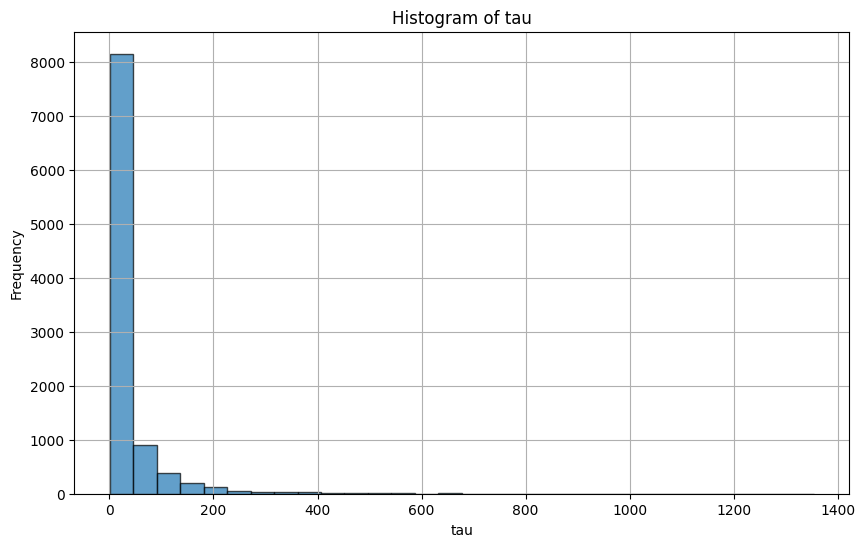

In [ ]:
# Assuming df is your DataFrame and it contains a column named 'tau'
plt.figure(figsize=(10, 6))
plt.hist(df['tau'], bins=30, edgecolor='k', alpha=0.7)
plt.title('Histogram of tau')
plt.xlabel('tau')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [ ]:
def pcnn(X, Y, T, scaling=True, batch_size=100, epochs=100, max_epochs=1, directory="tuner", fixed_model = False, noise_multiplier=1, seed = 1):
    """
    Private Causal Neural Network (PCNN) algorithm for estimating average treatment effects.

    Args:
    X (numpy.ndarray): Features matrix.
    Y (numpy.ndarray): Outcome vector.
    T (numpy.ndarray): Treatment vector.
    scaling (bool, optional): Whether to scale the features matrix. Default is True.
    simulations (int, optional): Number of simulations. Default is 1.
    batch_size (int, optional): Batch size for training. Default is 100.
    epochs (int, optional): Number of epochs for training. Default is 100.
    max_epochs (int, optional): Maximum number of epochs for hyperparameter optimization. Default is 10.
    directory (str, optional): Directory for saving hyperparameter optimization results. Default is "tuner".
    noise_multiplier (float, optional): Noise multiplier for differential privacy. Default is 1.

    Returns:
    tuple: Tuple containing average treatment effect, CATE estimates, trained tau_hat model, and privacy risk .
    """

    import random
    import re
    import numpy as np
    import tensorflow as tf
    import tensorflow_privacy
    from tensorflow import keras
    from keras.layers import Activation, LeakyReLU
    from keras import backend as K
    from keras import layers
    from keras.utils import get_custom_objects
    from sklearn.model_selection import KFold
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.linear_model import LogisticRegression
    import pandas as pd
    import math
    import keras_tuner

    # set random seeds
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)
    tf.keras.utils.set_random_seed(seed)

    # Check if batch size divides the data evenly
    if (len(X)/2) % batch_size != 0:
        divisors = [i for i in range(1, int(math.sqrt((len(X)/2))) + 1) if (len(X)/2) % i == 0]
        divisors += [(len(X)/2) // i for i in divisors if (len(X)/2) // i != i]
        divisors.sort()
        raise ValueError("The batch size you have specified does not divide the data into a whole number.\nPlease select one of the following possible batch sizes: {}".format(np.round(divisors)))

    # Calculate epsilon
    statement = tensorflow_privacy.compute_dp_sgd_privacy_statement(
        number_of_examples=len(X),
        batch_size=batch_size,
        num_epochs=epochs,
        noise_multiplier=noise_multiplier,
        delta=1/len(X),
        used_microbatching=False,
        max_examples_per_user=1
    )
    print(statement)

    # Extract epsilon and noise_multiplier from the statement
    numbers = [float(num) if '.' in num else int(num) for num in re.findall(r'\d+\.\d+|\d+', statement)]
    n, epsilon, noise_multiplier, epsilon_conservative = numbers[0], numbers[8], numbers[2], numbers[7]


    # callback settings for early stopping and saving
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, mode="min")  # early stopping just like in rboost

    # define ate loss is equal to mean squared error between pseudo outcome and prediction of net.
    def ATE(y_true, y_pred):
        return tf.reduce_mean(y_pred, axis=-1)  # Note the `axis=-1`

    def generate_fixed_architecture(X):
      model = keras.Sequential()
      model.add(keras.Input(shape=(X.shape[1],)))

      # Define the architecture with 4 layers
      num_layers = 4
      units = 64

      for _ in range(num_layers):
          model.add(layers.Dense(units, activation='tanh')) # https://arxiv.org/pdf/2007.14191.pdf
          units = max(units // 2, 1)  # Reduce the number of units by half for each subsequent layer

      # Add output layer
      model.add(layers.Dense(1, activation='linear'))

      model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=0.001),
        loss="mean_squared_error",
        metrics=["MSE"],
      )
      return model

    average_treatment_effect = []  # storage of ate estimates
    all_CATE_estimates = []  # Store CATE estimates for each simulation

    ## scale the data for well-behaved gradients
    if scaling == True:
        scaler0 = MinMaxScaler(feature_range=(-1, 1))
        scaler0 = scaler0.fit(X)
        X = scaler0.transform(X)
        X = pd.DataFrame(X)

    ## Add leaky-relu so we can use it as a string
    get_custom_objects().update({'leaky-relu': Activation(LeakyReLU(alpha=0.2))})

    def build_model(hp):
        model = keras.Sequential()
        model.add(keras.Input(shape=(X.shape[1],)))
        # Tune the number of layers.
        for i in range(hp.Int("num_layers", 1, 4)):
            model.add(
                layers.Dense(
                    # Tune number of units separately.
                    units=hp.Choice(f"units_{i}", [8, 16, 32, 64, 256, 512]),
                    activation=hp.Choice("activation", ["leaky-relu", "relu"]),
                )
            )
        model.add(layers.Dense(1, activation="linear"))

        model.compile(
            optimizer=keras.optimizers.Adam(learning_rate=0.001),
            loss="mean_squared_error",
            metrics=["MSE"],
        )
        return model

    # for epsilon calculation. Shuffeling serves as a Poisson sampling substitute (Ponomareva et al. 2023)
    idx = np.random.permutation(pd.DataFrame(X).index)
    X = np.array(pd.DataFrame(X).reindex(idx))
    Y = np.array(pd.DataFrame(Y).reindex(idx))
    T = np.array(pd.DataFrame(T).reindex(idx))

    # save models
    checkpoint_filepath_mx = f"{directory}/_{epsilon}_m_x.hdf5"
    checkpoint_filepath_taux = f"{directory}/_{epsilon}_tau_x.hdf5"

    mx_callbacks = [callback,
      tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath_mx, save_weights_only=False, monitor='val_loss', mode='min', save_freq="epoch", save_best_only=True,)]
    tau_hat_callbacks = [callback,
      tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath_taux, save_weights_only=False, monitor='val_loss', mode='min', save_freq="epoch", save_best_only=True,)]
    y_tilde_hat = []  # collect all the \tilde{Y}
    T_tilde_hat = []  # collect all the \tilde{T}
    m_x_hat = []  # collect all m_x_hat for print
    e_x_hat = []  # collect all e_x_hat for print

    print("hyperparameter optimization for yhat")
    tuner = keras_tuner.Hyperband(hypermodel=build_model, objective="val_loss", max_epochs=max_epochs, overwrite=True, directory=directory, project_name="yhat",seed=seed,) # random search is at least as slow..

    tuner.search(X, Y, epochs=epochs, validation_split=0.25, verbose=0, callbacks=[mx_callbacks])
    # Get the optimal hyperparameters
    best_hps = tuner.get_best_hyperparameters()[0]
    print("the optimal architecture is: " + str(best_hps.values))

    cv = KFold(n_splits=2, shuffle=False)  # K-fold validation shuffle is off to prevent additional noise?

    for fold, (train_idx, test_idx) in enumerate(cv.split(X)):
      # set random seeds
      np.random.seed(seed)
      tf.random.set_seed(seed)
      random.seed(seed)
      tf.keras.utils.set_random_seed(seed)

      # training model for m(x)
      model_m_x = tuner.hypermodel.build(best_hps)
      model_m_x.fit(X[train_idx],
                    Y[train_idx],
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=(X[test_idx], Y[test_idx]),
                    callbacks=mx_callbacks,
                    verbose=0)
      model_m_x = tuner.hypermodel.build(best_hps)
      model_m_x.build(input_shape=(None, X.shape[1]))
      model_m_x.load_weights(checkpoint_filepath_mx)
      m_x = model_m_x.predict(x=X[test_idx], verbose=0).reshape(len(Y[test_idx]))  # obtain \hat{m}(x) from test set

      # obtain \tilde{Y} = Y_{i} - \hat{m}(x)
      truth = Y[test_idx].T.reshape(len(Y[test_idx]))
      y_tilde = truth - m_x
      y_tilde_hat = np.concatenate((y_tilde_hat, y_tilde))  # cbind in r
      m_x_hat = np.concatenate((m_x_hat, m_x))  # cbind in r

      # fit \hat{e}(x)
      clf = LogisticRegression(verbose=0).fit(X[train_idx], np.array(T[train_idx]).reshape(len(T[train_idx])))
      e_x = clf.predict_proba(X[test_idx])  # obtain \hat{e}(x)
      print(f"Fold {fold}: mean(m_x) = {np.round(np.mean(m_x), 2):.2f}, sd(m_x) = {np.round(np.std(m_x), 3):.3f} and mean(e_x) = {np.round(np.mean(e_x[:, 1]), 2):.2f}, sd(e_x) = {np.round(np.std(e_x[:, 1]), 3):.3f}")

      # obtain \tilde{T} = T_{i} - \hat{e}(x)
      truth = T[test_idx].T.reshape(len(T[test_idx]))
      T_tilde = truth - e_x[:, 1]
      T_tilde_hat = np.concatenate((T_tilde_hat, T_tilde))
      e_x_hat = np.concatenate((e_x_hat, e_x[:, 1]))
      print(pd.DataFrame(y_tilde).describe())

    # storage
    CATE_estimates = []

    # pseudo_outcome and weights
    pseudo_outcome = (y_tilde_hat / T_tilde_hat)  # pseudo_outcome = \tilde{Y} / \tilde{T}
    w_weights = np.square(T_tilde_hat)  # \tilde{T}**2

    cv = KFold(n_splits=2, shuffle=False)

    print("training for tau hat")
    for fold, (train_idx, test_idx) in enumerate(cv.split(X)):
      # set random seeds
      np.random.seed(seed)
      tf.random.set_seed(seed)
      random.seed(seed)
      tf.keras.utils.set_random_seed(seed)

      tau_hat = generate_fixed_architecture(X) # an alternative is to fix the values of hyperparameters to some reasonable defaults and forgo hyperparameter tuning altogether (Ponomareva et al. 2023)
      if fixed_model == False:
        tau_hat = tuner.hypermodel.build(best_hps)
      tau_hat.compile(optimizer=tensorflow_privacy.DPKerasAdamOptimizer(l2_norm_clip=4, noise_multiplier=noise_multiplier, num_microbatches=batch_size, learning_rate=0.001), loss=tf.keras.losses.MeanSquaredError(reduction=tf.losses.Reduction.NONE), metrics=[ATE]) # the microbatches are equal to the batch size. No microbatching applied.
      history_tau = tau_hat.fit(
        X[train_idx],
        pseudo_outcome[train_idx],
        sample_weight=w_weights[train_idx],
        epochs=epochs,
        batch_size=batch_size,
        callbacks=tau_hat_callbacks,
        validation_data=(X[test_idx], pseudo_outcome[test_idx]),
        verbose=0)
      if fixed_model == False:
        tau_hat = tuner.hypermodel.build(best_hps)
        tau_hat.build(input_shape=(None, X.shape[1]))
      tau_hat.load_weights(checkpoint_filepath_taux)
      CATE = tau_hat.predict(x=X[test_idx], verbose=0).reshape(len(X[test_idx]))
      print(f"Fold {fold}: mean(tau_hat) = {np.round(np.mean(CATE), 2):.2f}, sd(tau_hat) = {np.round(np.std(CATE), 3):.3f}")

      CATE_estimates = np.concatenate((CATE_estimates, CATE))  # store CATE's
    average_treatment_effect = np.mean(CATE_estimates)
    X = X[np.argsort(idx)]
    Y = Y[np.argsort(idx)]
    T = T[np.argsort(idx)]
    CATE_estimates = CATE_estimates[np.argsort(idx)]
    print(f"ATE = {average_treatment_effect}")
    return average_treatment_effect, CATE_estimates, tau_hat, n, epsilon, noise_multiplier, epsilon_conservative

In [ ]:
# install PCNNs and simulation setup
#!pip install git+https://github.com/GilianPonte/PrivateTargeting.git -q

import os
import pandas as pd
import numpy as np
import random
import tensorflow
import causal_inference
from causal_inference import simulation_data
from causal_inference import strategy1
import time

try:
    seeds_data = np.genfromtxt('/content/seeds_data.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")
try:
    seeds_training = np.genfromtxt('/content/seeds_training.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")

# set time
start_time = time.time()
tensorflow.config.experimental.enable_op_determinism()
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

# Read seeds_data and seeds_training from file
seeds_data = read_file("seeds_data.txt")
seeds_training = read_file("seeds_training.txt")

# simulation parameters
iterations = 1
results_list = []
noise_multipliers = [0.48033, 0.7174,1.5088,3.5953, 6.5978, 52.174, 204,0] #0.48033, 0.7174,3.5953, 6.5978, 52.174, 204  # Initialize lists to store results for each noise multiplier

for i in range(iterations):
  print("Iteration: {}".format(i, i))
  random.seed(seeds_data[i])
  tensorflow.random.set_seed(seeds_data[i])
  np.random.seed(seeds_data[i])
  tensorflow.keras.utils.set_random_seed(seeds_data[i])

  # read data
  data = data_simulation_covariates(10000,10)

  # Separate the columns into different DataFrames
  covariate_columns = [col for col in data.columns if col.startswith('X')]
  x = data[covariate_columns]
  w, m, tau, mu1, mu0, y = data[['w']], data[['m']], data[['tau']], data[['mu1']], data[['mu0']], data[['y']]

  # Loop through each noise multiplier value
  for noise_index, noise_multiplier in enumerate(noise_multipliers):
    print(noise_multiplier)

    for a in range(1):
      combined_number = (noise_index * 100) + a
      print("Combined number: {}".format(combined_number, combined_number))
      random.seed(seeds_training[combined_number])
      tensorflow.random.set_seed(seeds_training[combined_number])
      np.random.seed(seeds_training[combined_number])
      tensorflow.keras.utils.set_random_seed(seeds_training[combined_number])

      # Define the directory based on the noise multiplier
      directory = f"tuner_{noise_multiplier}_iteration_{i}_algo_run_{a}_1"
      os.makedirs(directory, exist_ok=True)  # Create the directory if it doesn't exist

      # Call the function with the current noise_multiplier value
      if noise_multiplier == 0:
        print("no privacy")
        average_treatment_effect, CATE_estimates, tau_hat = strategy1.cnn(X = x,
                                                                  Y = y,
                                                                  T = w,
                                                                  scaling = True,
                                                                  batch_size = 100,
                                                                  epochs = 100,
                                                                  max_epochs = 1,
                                                                  folds = 10,
                                                                  directory = directory,
                                                                  seed = seeds_training[combined_number])
        epsilon = 0
        n = len(x)
        epsilon_conservative = 0
      if noise_multiplier != 0:
        average_treatment_effect, CATE_estimates, tau_hat, n, epsilon, noise_multiplier, epsilon_conservative = pcnn(
            X=x,
            Y=y,
            T=w,
            scaling=True,
            batch_size=100,
            epochs=100,
            max_epochs=1,
            fixed_model = True,
            directory=directory,  # Use the directory variable here
            noise_multiplier=noise_multiplier,
            seed = seeds_training[combined_number]
            )
      # Append the results to the list
      results_list.append({
          'Noise Multiplier': noise_multiplier,
          'Average Treatment Effect': average_treatment_effect,
          'CATE Estimates': CATE_estimates,
          'Epsilon': epsilon,
          'epsilon conservative': epsilon_conservative,
          'true ate': data[['tau']].mean(),
          'true CATE': data[['tau']],
          'sample size': n,
          'data set' : i,
          'iteration' : a,
          'covariates' : x,

          })

      np.save(f"results_list_{noise_multiplier}", results_list)

      # Print or use the DataFrames as needed
      end_time = time.time()
      execution_time = end_time - start_time
      print("Execution time one sim: {:.2f} seconds".format(execution_time))

Iteration: 0
0.48033
Combined number: 0
DP-SGD performed over 10000 examples with 100 examples per iteration, noise
multiplier 0.48033 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 0.0001 computed
with RDP accounting:
    Epsilon with each example occurring once per epoch:       303.407
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 0.0001 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       303.407
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in training pipelines, but assuming
that the data was randomly shuffled, it is believed that the actual epsilon
should be closer to this value than the cons

KeyboardInterrupt: 

In [ ]:
import pandas as pd

# Save each set of CATE Estimates to a CSV file by Epsilon level
for record in results_list:
    epsilon = record['epsilon conservative']
    estimates = record['CATE Estimates']
    iteration = record['iteration']

    df = pd.DataFrame({
        'CATE Estimates': estimates,
        'iteration': [iteration] * len(estimates)  # This ensures the iteration number is repeated for each estimate
    })

    filename = f'sim_1_{epsilon}_n10000_iter_{iteration}_field1.csv'
    df.to_csv(filename, index=False)


In [ ]:
results_list[0]['true CATE'].to_csv('CATE_estimates_field1.csv', index=False)

#larger sample

In [ ]:
import numpy as np
import pandas as pd

def data_simulation_covariates(n, num_covariates):
    # Generate random covariates from different distributions
    covariates = []
    for i in range(num_covariates):
        if i == 0:
            covariates.append(np.clip(np.random.normal(loc=42, scale=15, size=n), 0, 110))
        elif i == 1:
            covariates.append(np.random.binomial(n=1, p=0.63, size=n))
        elif i == 2:
            covariates.append(np.clip(np.random.exponential(scale=4, size=n), 0, 210))
        elif i == 3:
            covariates.append(np.clip(np.random.exponential(scale=700, size=n), 0, 87280.80))
        elif i == 4:
            covariates.append(np.clip(np.random.normal(loc=28, scale=20, size=n), -2.07, 776.65))
        elif i == 5:
            covariates.append(np.clip(np.random.normal(loc=841, scale=50, size=n), 57, 974))
        elif i == 6:
            covariates.append(np.clip(np.random.normal(loc=-81, scale=100, size=n), -1783.36, 0))
        elif i == 7:
            covariates.append(np.clip(np.random.normal(loc=-362, scale=1000, size=n), -34553.01, 0))
        elif i == 8:
            covariates.append(np.clip(np.random.poisson(lam=75, size=n), 0, 1009))
        elif i == 9:
            covariates.append(np.random.binomial(n=1, p=0.32, size=n))
        elif i == 10:
            covariates.append(np.random.binomial(n=1, p=0.98, size=n))
        elif i == 11:
            covariates.append(np.clip(np.random.beta(a=1, b=12, size=n), 0, 1))
        elif i == 12:
            covariates.append(np.random.randint(0, 10, size=n))

    # Create the design matrix
    x = np.column_stack(covariates)

    # Generate treatment indicator
    p = 0.95
    w = np.random.binomial(1, p, size=n)

    # Generate outcomes and treatment effects
    m = np.maximum(0, x[:, 1] + x[:, 2]) + np.maximum(0.5, x[:, 3])
    tau = x[:, 1] + np.log(1 + np.exp(x[:, 2])) ** 2
    mu1 = m + tau / 2
    mu0 = m - tau / 2
    y = w * mu1 + (1 - w) * mu0 + 0.5 * np.random.normal(size=n)

    # Create a dictionary to hold the data
    data = {'w': w, 'm': m, 'tau': tau, 'mu1': mu1, 'mu0': mu0, 'y': y}
    for i in range(num_covariates):
        data[f'X{i+1}'] = covariates[i]

    # Create a Pandas DataFrame
    df = pd.DataFrame(data)

    return df

# Example usage
n = 10_000  # Number of samples
num_covariates = 13  # Number of covariates
df = data_simulation_covariates(n, num_covariates)

# Display the summary statistics of the generated data
print(df.describe().transpose())


       count        mean         std          min          25%         50%  \
w    10000.0    0.950700    0.216504     0.000000     1.000000    1.000000   
m    10000.0  705.773965  699.477120     0.539940   208.220552  483.653159   
tau  10000.0   33.806015   79.319527     0.480667     2.729458    9.072161   
mu1  10000.0  722.676973  700.695073     0.794350   223.867787  502.409294   
mu0  10000.0  688.870958  700.506026  -653.646030   192.721404  466.688115   
y    10000.0  721.018983  700.751616  -104.302372   223.084523  501.025104   
X1   10000.0   41.816566   15.051515     0.000000    31.603940   41.754317   
X2   10000.0    0.630400    0.482721     0.000000     0.000000    1.000000   
X3   10000.0    4.036247    4.067214     0.000308     1.164050    2.845766   
X4   10000.0  701.107197  699.462039     0.230234   203.704576  477.921587   
X5   10000.0   28.387324   18.712763    -2.070000    14.456717   27.756861   
X6   10000.0  841.720184   49.597149   669.038621   808.659601  

In [ ]:
def pcnn(X, Y, T, scaling=True, batch_size=100, epochs=100, max_epochs=1, directory="tuner", fixed_model = False, noise_multiplier=1, seed = 1):
    """
    Private Causal Neural Network (PCNN) algorithm for estimating average treatment effects.

    Args:
    X (numpy.ndarray): Features matrix.
    Y (numpy.ndarray): Outcome vector.
    T (numpy.ndarray): Treatment vector.
    scaling (bool, optional): Whether to scale the features matrix. Default is True.
    simulations (int, optional): Number of simulations. Default is 1.
    batch_size (int, optional): Batch size for training. Default is 100.
    epochs (int, optional): Number of epochs for training. Default is 100.
    max_epochs (int, optional): Maximum number of epochs for hyperparameter optimization. Default is 10.
    directory (str, optional): Directory for saving hyperparameter optimization results. Default is "tuner".
    noise_multiplier (float, optional): Noise multiplier for differential privacy. Default is 1.

    Returns:
    tuple: Tuple containing average treatment effect, CATE estimates, trained tau_hat model, and privacy risk .
    """

    import random
    import re
    import numpy as np
    import tensorflow as tf
    import tensorflow_privacy
    from tensorflow import keras
    from keras.layers import Activation, LeakyReLU
    from keras import backend as K
    from keras import layers
    from keras.utils import get_custom_objects
    from sklearn.model_selection import KFold
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.linear_model import LogisticRegression
    import pandas as pd
    import math
    import keras_tuner

    # set random seeds
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)
    tf.keras.utils.set_random_seed(seed)

    # Check if batch size divides the data evenly
    if (len(X)/2) % batch_size != 0:
        divisors = [i for i in range(1, int(math.sqrt((len(X)/2))) + 1) if (len(X)/2) % i == 0]
        divisors += [(len(X)/2) // i for i in divisors if (len(X)/2) // i != i]
        divisors.sort()
        raise ValueError("The batch size you have specified does not divide the data into a whole number.\nPlease select one of the following possible batch sizes: {}".format(np.round(divisors)))

    # Calculate epsilon
    statement = tensorflow_privacy.compute_dp_sgd_privacy_statement(
        number_of_examples=len(X),
        batch_size=batch_size,
        num_epochs=epochs,
        noise_multiplier=noise_multiplier,
        delta=1/len(X),
        used_microbatching=False,
        max_examples_per_user=1
    )
    print(statement)

    # Extract epsilon and noise_multiplier from the statement
    numbers = [float(num) if '.' in num else int(num) for num in re.findall(r'\d+\.\d+|\d+', statement)]
    n, epsilon, noise_multiplier, epsilon_conservative = numbers[0], numbers[8], numbers[2], numbers[7]


    # callback settings for early stopping and saving
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, mode="min")  # early stopping just like in rboost

    # define ate loss is equal to mean squared error between pseudo outcome and prediction of net.
    def ATE(y_true, y_pred):
        return tf.reduce_mean(y_pred, axis=-1)  # Note the `axis=-1`

    def generate_fixed_architecture(X):
      model = keras.Sequential()
      model.add(keras.Input(shape=(X.shape[1],)))

      # Define the architecture with 4 layers
      num_layers = 4
      units = 64

      for _ in range(num_layers):
          model.add(layers.Dense(units, activation='tanh')) # https://arxiv.org/pdf/2007.14191.pdf
          units = max(units // 2, 1)  # Reduce the number of units by half for each subsequent layer

      # Add output layer
      model.add(layers.Dense(1, activation='linear'))

      model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=0.001),
        loss="mean_squared_error",
        metrics=["MSE"],
      )
      return model

    average_treatment_effect = []  # storage of ate estimates
    all_CATE_estimates = []  # Store CATE estimates for each simulation

    ## scale the data for well-behaved gradients
    if scaling == True:
        scaler0 = MinMaxScaler(feature_range=(-1, 1))
        scaler0 = scaler0.fit(X)
        X = scaler0.transform(X)
        X = pd.DataFrame(X)

    ## Add leaky-relu so we can use it as a string
    get_custom_objects().update({'leaky-relu': Activation(LeakyReLU(alpha=0.2))})

    def build_model(hp):
        model = keras.Sequential()
        model.add(keras.Input(shape=(X.shape[1],)))
        # Tune the number of layers.
        for i in range(hp.Int("num_layers", 1, 4)):
            model.add(
                layers.Dense(
                    # Tune number of units separately.
                    units=hp.Choice(f"units_{i}", [8, 16, 32, 64, 256, 512]),
                    activation=hp.Choice("activation", ["leaky-relu", "relu"]),
                )
            )
        model.add(layers.Dense(1, activation="linear"))

        model.compile(
            optimizer=keras.optimizers.Adam(learning_rate=0.001),
            loss="mean_squared_error",
            metrics=["MSE"],
        )
        return model

    # for epsilon calculation. Shuffeling serves as a Poisson sampling substitute (Ponomareva et al. 2023)
    idx = np.random.permutation(pd.DataFrame(X).index)
    X = np.array(pd.DataFrame(X).reindex(idx))
    Y = np.array(pd.DataFrame(Y).reindex(idx))
    T = np.array(pd.DataFrame(T).reindex(idx))

    # save models
    checkpoint_filepath_mx = f"{directory}/_{epsilon}_m_x.hdf5"
    checkpoint_filepath_taux = f"{directory}/_{epsilon}_tau_x.hdf5"

    mx_callbacks = [callback,
      tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath_mx, save_weights_only=False, monitor='val_loss', mode='min', save_freq="epoch", save_best_only=True,)]
    tau_hat_callbacks = [callback,
      tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath_taux, save_weights_only=False, monitor='val_loss', mode='min', save_freq="epoch", save_best_only=True,)]
    y_tilde_hat = []  # collect all the \tilde{Y}
    T_tilde_hat = []  # collect all the \tilde{T}
    m_x_hat = []  # collect all m_x_hat for print
    e_x_hat = []  # collect all e_x_hat for print

    print("hyperparameter optimization for yhat")
    tuner = keras_tuner.Hyperband(hypermodel=build_model, objective="val_loss", max_epochs=max_epochs, overwrite=True, directory=directory, project_name="yhat",seed=seed,) # random search is at least as slow..

    tuner.search(X, Y, epochs=epochs, validation_split=0.25, verbose=0, callbacks=[mx_callbacks])
    # Get the optimal hyperparameters
    best_hps = tuner.get_best_hyperparameters()[0]
    print("the optimal architecture is: " + str(best_hps.values))

    cv = KFold(n_splits=2, shuffle=False)  # K-fold validation shuffle is off to prevent additional noise?

    for fold, (train_idx, test_idx) in enumerate(cv.split(X)):
      # set random seeds
      np.random.seed(seed)
      tf.random.set_seed(seed)
      random.seed(seed)
      tf.keras.utils.set_random_seed(seed)

      # training model for m(x)
      model_m_x = tuner.hypermodel.build(best_hps)
      model_m_x.fit(X[train_idx],
                    Y[train_idx],
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=(X[test_idx], Y[test_idx]),
                    callbacks=mx_callbacks,
                    verbose=0)
      model_m_x = tuner.hypermodel.build(best_hps)
      model_m_x.build(input_shape=(None, X.shape[1]))
      model_m_x.load_weights(checkpoint_filepath_mx)
      m_x = model_m_x.predict(x=X[test_idx], verbose=0).reshape(len(Y[test_idx]))  # obtain \hat{m}(x) from test set

      # obtain \tilde{Y} = Y_{i} - \hat{m}(x)
      truth = Y[test_idx].T.reshape(len(Y[test_idx]))
      y_tilde = truth - m_x
      y_tilde_hat = np.concatenate((y_tilde_hat, y_tilde))  # cbind in r
      m_x_hat = np.concatenate((m_x_hat, m_x))  # cbind in r

      # fit \hat{e}(x)
      clf = LogisticRegression(verbose=0).fit(X[train_idx], np.array(T[train_idx]).reshape(len(T[train_idx])))
      e_x = clf.predict_proba(X[test_idx])  # obtain \hat{e}(x)
      print(f"Fold {fold}: mean(m_x) = {np.round(np.mean(m_x), 2):.2f}, sd(m_x) = {np.round(np.std(m_x), 3):.3f} and mean(e_x) = {np.round(np.mean(e_x[:, 1]), 2):.2f}, sd(e_x) = {np.round(np.std(e_x[:, 1]), 3):.3f}")

      # obtain \tilde{T} = T_{i} - \hat{e}(x)
      truth = T[test_idx].T.reshape(len(T[test_idx]))
      T_tilde = truth - e_x[:, 1]
      T_tilde_hat = np.concatenate((T_tilde_hat, T_tilde))
      e_x_hat = np.concatenate((e_x_hat, e_x[:, 1]))
      print(pd.DataFrame(y_tilde).describe())

    # storage
    CATE_estimates = []

    # pseudo_outcome and weights
    pseudo_outcome = (y_tilde_hat / T_tilde_hat)  # pseudo_outcome = \tilde{Y} / \tilde{T}
    w_weights = np.square(T_tilde_hat)  # \tilde{T}**2

    cv = KFold(n_splits=2, shuffle=False)

    print("training for tau hat")
    for fold, (train_idx, test_idx) in enumerate(cv.split(X)):
      # set random seeds
      np.random.seed(seed)
      tf.random.set_seed(seed)
      random.seed(seed)
      tf.keras.utils.set_random_seed(seed)

      tau_hat = generate_fixed_architecture(X) # an alternative is to fix the values of hyperparameters to some reasonable defaults and forgo hyperparameter tuning altogether (Ponomareva et al. 2023)
      if fixed_model == False:
        tau_hat = tuner.hypermodel.build(best_hps)
      tau_hat.compile(optimizer=tensorflow_privacy.DPKerasAdamOptimizer(l2_norm_clip=4, noise_multiplier=noise_multiplier, num_microbatches=batch_size, learning_rate=0.001), loss=tf.keras.losses.MeanSquaredError(reduction=tf.losses.Reduction.NONE), metrics=[ATE]) # the microbatches are equal to the batch size. No microbatching applied.
      history_tau = tau_hat.fit(
        X[train_idx],
        pseudo_outcome[train_idx],
        sample_weight=w_weights[train_idx],
        epochs=epochs,
        batch_size=batch_size,
        callbacks=tau_hat_callbacks,
        validation_data=(X[test_idx], pseudo_outcome[test_idx]),
        verbose=0)
      if fixed_model == False:
        tau_hat = tuner.hypermodel.build(best_hps)
        tau_hat.build(input_shape=(None, X.shape[1]))
      tau_hat.load_weights(checkpoint_filepath_taux)
      CATE = tau_hat.predict(x=X[test_idx], verbose=0).reshape(len(X[test_idx]))
      print(f"Fold {fold}: mean(tau_hat) = {np.round(np.mean(CATE), 2):.2f}, sd(tau_hat) = {np.round(np.std(CATE), 3):.3f}")

      CATE_estimates = np.concatenate((CATE_estimates, CATE))  # store CATE's
    average_treatment_effect = np.mean(CATE_estimates)
    X = X[np.argsort(idx)]
    Y = Y[np.argsort(idx)]
    T = T[np.argsort(idx)]
    CATE_estimates = CATE_estimates[np.argsort(idx)]
    print(f"ATE = {average_treatment_effect}")
    return average_treatment_effect, CATE_estimates, tau_hat, n, epsilon, noise_multiplier, epsilon_conservative

In [ ]:
import tensorflow_privacy
# read data
data = data_simulation_covariates(100_000,10)

# Separate the columns into different DataFrames
covariate_columns = [col for col in data.columns if col.startswith('X')]
X = data[covariate_columns]
w, m, tau, mu1, mu0, Y = data[['w']], data[['m']], data[['tau']], data[['mu1']], data[['mu0']], data[['y']]
noise_multipliers = [92]
# n = 100,000, 0.384457, 0.51327, 0.78075, 1.455, 2.53, 21, 92
# n = 350,000, 0.351424, 0.45592, 0.64955, 1.0147, 1.552, 12, 55
for noise in noise_multipliers:
# Calculate epsilon
    statement = tensorflow_privacy.compute_dp_sgd_privacy_statement(
        number_of_examples=len(X),
        batch_size=100,
        num_epochs=100,
        noise_multiplier=noise,
        delta=1/len(X),
        used_microbatching=False,
        max_examples_per_user=1
    )
    print(statement)

DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training pipelines, but assuming
that the data was randomly shuffled, it is believed that the actual epsilon
should be closer to this value than the conservative assumption of an arbitrary
data order

In [ ]:
# install PCNNs and simulation setup
#!pip install git+https://github.com/GilianPonte/PrivateTargeting.git -q

import os
import pandas as pd
import numpy as np
import random
import tensorflow
import causal_inference
from causal_inference import simulation_data
from causal_inference import strategy1
import time

try:
    seeds_data = np.genfromtxt('/content/seeds_data.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")
try:
    seeds_training = np.genfromtxt('/content/seeds_training.txt', delimiter=',', dtype = np.int64)
except IOError:
    print("Error: File not found or could not be read.")

# set time
start_time = time.time()
tensorflow.config.experimental.enable_op_determinism()
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

# Read seeds_data and seeds_training from file
seeds_data = read_file("seeds_data.txt")
seeds_training = read_file("seeds_training.txt")

# simulation parameters
iterations = 1
results_list = []
noise_multipliers = [0.384457, 0.51327, 0.78075, 1.455, 2.53, 21, 92]
for i in range(iterations):
  print("Iteration: {}".format(i, i))
  random.seed(seeds_data[i])
  tensorflow.random.set_seed(seeds_data[i])
  np.random.seed(seeds_data[i])
  tensorflow.keras.utils.set_random_seed(seeds_data[i])

  # read data
  data = data_simulation_covariates(100_000,10)

  # Separate the columns into different DataFrames
  covariate_columns = [col for col in data.columns if col.startswith('X')]
  x = data[covariate_columns]
  w, m, tau, mu1, mu0, y = data[['w']], data[['m']], data[['tau']], data[['mu1']], data[['mu0']], data[['y']]

  # Loop through each noise multiplier value
  for noise_index, noise_multiplier in enumerate(noise_multipliers):
    print(noise_multiplier)

    for a in range(10):
      combined_number = (noise_index * 100) + a
      print("Combined number: {}".format(combined_number, combined_number))
      random.seed(seeds_training[combined_number])
      tensorflow.random.set_seed(seeds_training[combined_number])
      np.random.seed(seeds_training[combined_number])
      tensorflow.keras.utils.set_random_seed(seeds_training[combined_number])

      # Define the directory based on the noise multiplier
      directory = f"tuner_{noise_multiplier}_iteration_{i}_algo_run_{a}_090"
      os.makedirs(directory, exist_ok=True)  # Create the directory if it doesn't exist

      # Call the function with the current noise_multiplier value
      if noise_multiplier == 0:
        print("no privacy")
        average_treatment_effect, CATE_estimates, tau_hat = strategy1.cnn(X = x,
                                                                  Y = y,
                                                                  T = w,
                                                                  scaling = True,
                                                                  batch_size = 100,
                                                                  epochs = 100,
                                                                  max_epochs = 1,
                                                                  folds = 10,
                                                                  directory = directory,
                                                                  seed = seeds_training[combined_number])
        epsilon = 0
        n = len(x)
        epsilon_conservative = 0
      if noise_multiplier != 0:
        average_treatment_effect, CATE_estimates, tau_hat, n, epsilon, noise_multiplier, epsilon_conservative = pcnn(
            X=x,
            Y=y,
            T=w,
            scaling=True,
            batch_size=100,
            epochs=100,
            max_epochs=1,
            fixed_model = True,
            directory=directory,  # Use the directory variable here
            noise_multiplier=noise_multiplier,
            seed = seeds_training[combined_number]
            )
      # Append the results to the list
      results_list.append({
          'Noise Multiplier': noise_multiplier,
          'Average Treatment Effect': average_treatment_effect,
          'CATE Estimates': CATE_estimates,
          'Epsilon': epsilon,
          'epsilon conservative': epsilon_conservative,
          'true ate': data[['tau']].mean(),
          'true CATE': data[['tau']],
          'sample size': n,
          'data set' : i,
          'iteration' : a,
          'covariates' : x,

          })

      np.save(f"results_list_{noise_multiplier}", results_list)

      # Print or use the DataFrames as needed
      end_time = time.time()
      execution_time = end_time - start_time
      print("Execution time one sim: {:.2f} seconds".format(execution_time))

Iteration: 0
0.384457
Combined number: 0
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.384457 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in training pipelines, but assuming
that the data was randomly shuffled, it is believed that the actual epsilon
should be closer to this value than the con

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 717.36, sd(m_x) = 698.580 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.239433
std       21.776973
min    -1552.195592
25%       -4.040637
50%       -0.292529
75%        4.727435
max      425.573306


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 724.52, sd(m_x) = 706.698 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.881989
std       19.969353
min    -1317.068584
25%       -4.636995
50%       -1.122126
75%        3.622663
max      428.881627
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 6.83, sd(tau_hat) = 102.787
Fold 1: mean(tau_hat) = 7.32, sd(tau_hat) = 103.011
ATE = 7.077860561361313
Execution time one sim: 822.56 seconds
Combined number: 1
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.384457 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in trainin

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 719.03, sd(m_x) = 700.835 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.120564
std       18.873781
min    -1489.199444
25%       -0.870715
50%        0.811338
75%        2.882807
max      372.121273
Fold 1: mean(m_x) = 721.59, sd(m_x) = 704.528 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       0.011206
std       19.286337
min    -1539.423253
25%       -0.858561
50%        0.793968
75%        2.862796
max      334.784093
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 29.42, sd(tau_hat) = 60.370
Fold 1: mean(tau_hat) = 31.03, sd(tau_hat) = 58.919
ATE = 30.227301344566346
Execution time one sim: 1934.07 seconds
Combined number: 2
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.384457 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in train

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 721.87, sd(m_x) = 704.856 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean       0.551586
std       20.342863
min     -868.780985
25%       -3.167179
50%        0.593342
75%        5.258059
max      477.864077
Fold 1: mean(m_x) = 717.54, sd(m_x) = 699.801 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.793117
std       21.443940
min    -1401.598302
25%       -3.087504
50%        0.762918
75%        5.430102
max      481.649449
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 34.25, sd(tau_hat) = 119.464
Fold 1: mean(tau_hat) = 33.87, sd(tau_hat) = 122.320
ATE = 34.055519559488296
Execution time one sim: 3085.78 seconds
Combined number: 3
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.384457 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in tra

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 512, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 724.01, sd(m_x) = 706.184 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.638694
std       19.790154
min    -1677.815221
25%       -1.676875
50%       -0.000505
75%        1.952395
max      298.771153


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 716.82, sd(m_x) = 698.452 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.569076
std       19.040322
min    -1418.258281
25%       -0.394945
50%        1.194426
75%        2.989575
max      390.278077
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 34.45, sd(tau_hat) = 66.009
Fold 1: mean(tau_hat) = 34.92, sd(tau_hat) = 66.674
ATE = 34.6843247041893
Execution time one sim: 4266.47 seconds
Combined number: 4
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.384457 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in trainin

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 719.07, sd(m_x) = 699.649 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.683214
std       20.823627
min    -1717.440953
25%       -1.762240
50%        0.333986
75%        2.596080
max      338.167788


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 721.98, sd(m_x) = 705.173 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       0.398350
std       18.052287
min    -1110.978333
25%       -0.590774
50%        1.102896
75%        2.860464
max      268.088070
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 36.91, sd(tau_hat) = 61.429
Fold 1: mean(tau_hat) = 36.51, sd(tau_hat) = 60.912
ATE = 36.70857736477852
Execution time one sim: 5356.41 seconds
Combined number: 5
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.384457 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in traini

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 726.41, sd(m_x) = 712.500 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.633822
std       19.997859
min    -1183.588380
25%       -2.583292
50%       -0.009996
75%        2.550880
max      525.017326


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 715.00, sd(m_x) = 692.499 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.015396
std       19.815850
min    -1587.209508
25%       -1.699788
50%        0.943487
75%        3.618901
max      485.264893
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 27.92, sd(tau_hat) = 82.669
Fold 1: mean(tau_hat) = 28.92, sd(tau_hat) = 81.998
ATE = 28.41970470132828
Execution time one sim: 6560.63 seconds
Combined number: 6
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.384457 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in traini

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 719.11, sd(m_x) = 696.514 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.177107
std       21.177968
min    -1614.443150
25%       -2.183795
50%        0.950036
75%        4.060509
max      389.284609


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 721.81, sd(m_x) = 708.878 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.015523
std       18.505470
min     -972.599771
25%       -1.343309
50%        0.917646
75%        3.114331
max      485.186280
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 26.46, sd(tau_hat) = 66.069
Fold 1: mean(tau_hat) = 26.78, sd(tau_hat) = 66.401
ATE = 26.620304650421144
Execution time one sim: 7671.80 seconds
Combined number: 7
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.384457 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in train

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 721.36, sd(m_x) = 700.749 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       0.699032
std       32.262819
min     -567.143982
25%      -11.241416
50%       -4.110369
75%        4.977744
max      730.342547
Fold 1: mean(m_x) = 718.13, sd(m_x) = 694.700 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.570870
std       33.863197
min    -1066.161412
25%      -11.219310
50%       -4.152105
75%        4.981067
max      816.252355
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = -7.58, sd(tau_hat) = 221.850
Fold 1: mean(tau_hat) = -7.42, sd(tau_hat) = 221.997
ATE = -7.499579524250031
Execution time one sim: 8818.71 seconds
Combined number: 8
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.384457 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in tra

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 728.14, sd(m_x) = 704.609 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.144291
std       19.848831
min    -1299.807354
25%       -2.892833
50%       -0.875495
75%        1.831461
max      373.446568
Fold 1: mean(m_x) = 714.95, sd(m_x) = 700.645 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -1.190223
std       19.988381
min    -1541.795567
25%       -2.856690
50%       -0.874829
75%        1.796460
max      363.816592
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 4.86, sd(tau_hat) = 100.324
Fold 1: mean(tau_hat) = 2.31, sd(tau_hat) = 103.003
ATE = 3.5848687122917173
Execution time one sim: 9978.38 seconds
Combined number: 9
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.384457 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       460.796
    Epsilon assuming Poisson sampling (*):                     50.000

(*) Poisson sampling is not usually done in train

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 718.12, sd(m_x) = 702.494 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.751879
std       19.399272
min     -936.323791
25%       -2.390711
50%        1.264488
75%        5.574406
max      401.786028
Fold 1: mean(m_x) = 721.18, sd(m_x) = 703.731 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.710922
std       21.091053
min    -1152.020244
25%       -2.440321
50%        1.247245
75%        5.622995
max      554.639396
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 31.14, sd(tau_hat) = 95.240
Fold 1: mean(tau_hat) = 31.23, sd(tau_hat) = 95.738
ATE = 31.186393545646666
Execution time one sim: 11161.24 seconds
0.51327
Combined number: 100
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.51327 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

(*) Poisson sampling is not usually don

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 722.15, sd(m_x) = 702.269 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.911262
std       21.221322
min    -1586.824742
25%       -2.275969
50%       -0.483898
75%        2.113250
max      373.865148


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 719.62, sd(m_x) = 702.706 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.100906
std       17.826787
min    -1494.378887
25%       -1.683859
50%        0.079442
75%        2.354987
max      255.862230
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 19.53, sd(tau_hat) = 61.524
Fold 1: mean(tau_hat) = 21.17, sd(tau_hat) = 72.015
ATE = 20.351847989196777
Execution time one sim: 12156.52 seconds
Combined number: 101
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.51327 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

(*) Poisson sampling is not usually done in tra

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 722.55, sd(m_x) = 705.382 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean      -0.827591
std       19.975615
min    -1426.058574
25%       -1.685920
50%       -0.120713
75%        1.853435
max      315.856509


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 719.20, sd(m_x) = 699.788 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.168951
std       18.686711
min    -1606.577428
25%       -1.298697
50%        0.343268
75%        2.539512
max      335.250401
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 19.81, sd(tau_hat) = 65.056
Fold 1: mean(tau_hat) = 19.20, sd(tau_hat) = 64.416
ATE = 19.50592709033966
Execution time one sim: 13334.66 seconds
Combined number: 102
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.51327 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

(*) Poisson sampling is not usually done in trai

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 726.12, sd(m_x) = 707.306 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.157397
std       18.990921
min     -942.818521
25%       -2.901967
50%       -0.573743
75%        2.096726
max      439.169181
Fold 1: mean(m_x) = 717.01, sd(m_x) = 697.546 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.215042
std       19.355777
min    -1259.661168
25%       -2.889416
50%       -0.583213
75%        2.051767
max      330.045840
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 4.07, sd(tau_hat) = 77.133
Fold 1: mean(tau_hat) = 6.60, sd(tau_hat) = 75.554
ATE = 5.3346532219600675
Execution time one sim: 14503.23 seconds
Combined number: 103
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.51327 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

(*) Poisson sampling is not usually done in train

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 719.41, sd(m_x) = 705.120 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean      -1.014043
std       23.193006
min     -863.864991
25%       -8.206380
50%       -1.087348
75%        6.544163
max      595.429234


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 722.24, sd(m_x) = 699.490 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.125462
std       22.830892
min    -1304.523229
25%       -7.431904
50%       -0.495141
75%        7.145972
max      455.472330
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = -7.23, sd(tau_hat) = 95.613
Fold 1: mean(tau_hat) = -13.06, sd(tau_hat) = 97.293
ATE = -10.143879094119072
Execution time one sim: 15161.06 seconds
Combined number: 104
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.51327 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

(*) Poisson sampling is not usually done in t

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 722.10, sd(m_x) = 703.106 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.271095
std       21.922090
min    -1673.534947
25%       -1.981543
50%        0.410355
75%        3.481186
max      552.080811


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 717.71, sd(m_x) = 701.057 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.667543
std       18.745026
min     -926.945251
25%       -1.798096
50%        1.131486
75%        4.622052
max      533.246111
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 32.32, sd(tau_hat) = 47.552
Fold 1: mean(tau_hat) = 32.89, sd(tau_hat) = 47.343
ATE = 32.60529098930359
Execution time one sim: 16144.21 seconds
Combined number: 105
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.51327 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

(*) Poisson sampling is not usually done in trai

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 722.49, sd(m_x) = 705.702 and mean(e_x) = 0.95, sd(e_x) = 0.005
                  0
count  50000.000000
mean      -0.041711
std       20.848651
min    -1600.198155
25%       -1.598623
50%        0.549893
75%        2.995831
max      375.609066


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 717.09, sd(m_x) = 699.118 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.219200
std       18.095947
min    -1177.124940
25%       -0.333002
50%        1.721097
75%        4.098733
max      268.763567
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 52.45, sd(tau_hat) = 77.350
Fold 1: mean(tau_hat) = 32.06, sd(tau_hat) = 85.201
ATE = 42.25318095216751
Execution time one sim: 17452.96 seconds
Combined number: 106
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.51327 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

(*) Poisson sampling is not usually done in trai

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 720.47, sd(m_x) = 698.594 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.572223
std       20.225110
min    -1254.353252
25%       -4.798795
50%       -0.587231
75%        4.430696
max      494.132754
Fold 1: mean(m_x) = 721.61, sd(m_x) = 705.798 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.747853
std       21.951394
min    -1397.243932
25%       -4.802233
50%       -0.570372
75%        4.389088
max      423.223895
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 8.90, sd(tau_hat) = 44.713
Fold 1: mean(tau_hat) = 8.99, sd(tau_hat) = 44.703
ATE = 8.942626580963433
Execution time one sim: 18096.47 seconds
Combined number: 107
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.51327 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

(*) Poisson sampling is not usually done in traini

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 718.96, sd(m_x) = 707.632 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.554119
std       19.825015
min     -876.256082
25%       -1.867783
50%        2.219958
75%        5.655535
max      619.975334
Fold 1: mean(m_x) = 718.85, sd(m_x) = 696.842 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.400931
std       21.029735
min    -1130.996983
25%       -1.863767
50%        2.220494
75%        5.690102
max      413.084229
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 46.13, sd(tau_hat) = 100.372
Fold 1: mean(tau_hat) = 58.34, sd(tau_hat) = 100.521
ATE = 52.23689859560967
Execution time one sim: 19313.18 seconds
Combined number: 108
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.51327 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

(*) Poisson sampling is not usually done in tr

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 724.17, sd(m_x) = 707.488 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.540295
std       19.367962
min    -1145.463848
25%       -1.936035
50%        0.388409
75%        3.801057
max      489.359855
Fold 1: mean(m_x) = 715.76, sd(m_x) = 694.664 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.288736
std       19.922997
min    -1176.316564
25%       -1.966327
50%        0.353986
75%        3.658666
max      399.718018
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 30.18, sd(tau_hat) = 88.663
Fold 1: mean(tau_hat) = 31.98, sd(tau_hat) = 89.094
ATE = 31.079262067298888
Execution time one sim: 20513.95 seconds
Combined number: 109
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.51327 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       282.612
    Epsilon assuming Poisson sampling (*):                     13.000

(*) Poisson sampling is not usually done in tra

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 722.18, sd(m_x) = 705.862 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean      -0.899680
std       18.643026
min     -931.527445
25%       -2.822353
50%       -0.321429
75%        2.776175
max      369.926549
Fold 1: mean(m_x) = 720.58, sd(m_x) = 700.356 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.094305
std       20.457842
min    -1504.976232
25%       -2.886027
50%       -0.383715
75%        2.753053
max      373.478091
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 8.72, sd(tau_hat) = 80.428
Fold 1: mean(tau_hat) = 7.42, sd(tau_hat) = 80.098
ATE = 8.069743233118057
Execution time one sim: 21676.97 seconds
0.78075
Combined number: 200
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.78075 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

(*) Poisson sampling is not usually done i

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 722.45, sd(m_x) = 707.810 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean      -0.648316
std       23.123897
min    -1622.012853
25%       -3.568954
50%       -0.346875
75%        3.371133
max      764.583741


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 719.80, sd(m_x) = 697.437 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.838029
std       20.101132
min     -685.168076
25%       -6.076834
50%       -1.260542
75%        4.419987
max      630.365191
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = -2.93, sd(tau_hat) = 0.551
Fold 1: mean(tau_hat) = -2.93, sd(tau_hat) = 0.558
ATE = -2.931794125497639
Execution time one sim: 22467.80 seconds
Combined number: 201
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.78075 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

(*) Poisson sampling is not usually done in train

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 717.81, sd(m_x) = 706.918 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.014699
std       21.580356
min    -1635.509191
25%       -0.429084
50%        1.888355
75%        4.242354
max      580.106690


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 722.55, sd(m_x) = 699.139 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.619508
std       17.937947
min     -860.300758
25%       -2.334784
50%       -0.189813
75%        2.465397
max      489.510002
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 18.28, sd(tau_hat) = 67.256
Fold 1: mean(tau_hat) = 18.15, sd(tau_hat) = 68.305
ATE = 18.214877342500685
Execution time one sim: 23608.08 seconds
Combined number: 202
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.78075 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

(*) Poisson sampling is not usually done in tra

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 721.59, sd(m_x) = 706.000 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -1.200343
std       21.796009
min    -1386.986730
25%       -5.940619
50%       -1.471371
75%        4.237489
max      532.151280


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 720.70, sd(m_x) = 698.611 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean      -0.336683
std       21.037722
min    -1223.329326
25%       -4.751445
50%       -0.587159
75%        4.770658
max      503.833437
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 7.84, sd(tau_hat) = 42.801
Fold 1: mean(tau_hat) = -14.01, sd(tau_hat) = 104.117
ATE = -3.085252162094116
Execution time one sim: 24607.12 seconds
Combined number: 203
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.78075 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

(*) Poisson sampling is not usually done in tr

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 719.06, sd(m_x) = 701.980 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.290624
std       20.050105
min    -1462.914287
25%        0.279699
50%        2.381440
75%        4.214831
max      317.540713


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 720.03, sd(m_x) = 703.444 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.376336
std       18.726853
min    -1557.262120
25%       -0.807014
50%        1.209218
75%        3.359672
max      385.430211
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 45.08, sd(tau_hat) = 58.216
Fold 1: mean(tau_hat) = 45.07, sd(tau_hat) = 58.258
ATE = 45.074798283720014
Execution time one sim: 25670.54 seconds
Combined number: 204
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.78075 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

(*) Poisson sampling is not usually done in tra

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 723.70, sd(m_x) = 707.231 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.111791
std       20.177787
min    -1437.079381
25%       -1.469379
50%        0.501898
75%        3.400997
max      347.332555


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 717.45, sd(m_x) = 698.273 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.506870
std       18.703731
min    -1294.193340
25%       -1.342385
50%        0.277588
75%        2.351174
max      458.906268
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 23.70, sd(tau_hat) = 50.198
Fold 1: mean(tau_hat) = 23.08, sd(tau_hat) = 50.128
ATE = 23.389038387975692
Execution time one sim: 26620.23 seconds
Combined number: 205
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.78075 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

(*) Poisson sampling is not usually done in tra

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 724.31, sd(m_x) = 703.307 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.172443
std       20.677496
min    -1192.664674
25%       -3.710889
50%       -0.698552
75%        2.902624
max      384.682862


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 717.24, sd(m_x) = 702.314 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.377100
std       19.752744
min    -1486.802281
25%       -2.535566
50%        0.382546
75%        4.276611
max      381.106753
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 24.48, sd(tau_hat) = 99.109
Fold 1: mean(tau_hat) = 24.79, sd(tau_hat) = 98.003
ATE = 24.635830469942093
Execution time one sim: 27413.61 seconds
Combined number: 206
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.78075 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

(*) Poisson sampling is not usually done in tra

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 717.49, sd(m_x) = 704.634 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.168902
std       19.526194
min    -1314.446270
25%       -1.400657
50%        1.001913
75%        3.304252
max      218.815731
Fold 1: mean(m_x) = 723.68, sd(m_x) = 702.634 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.245025
std       19.342716
min    -1507.343785
25%       -1.437300
50%        1.005044
75%        3.297173
max      303.809074
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 30.03, sd(tau_hat) = 80.535
Fold 1: mean(tau_hat) = 29.16, sd(tau_hat) = 81.198
ATE = 29.596651988258362
Execution time one sim: 28569.87 seconds
Combined number: 207
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.78075 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

(*) Poisson sampling is not usually done in tra

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 726.37, sd(m_x) = 703.928 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.598846
std       19.411128
min     -809.637916
25%       -6.017064
50%       -2.013155
75%        3.420648
max      410.452578
Fold 1: mean(m_x) = 717.77, sd(m_x) = 700.185 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.784536
std       22.343282
min    -1495.193517
25%       -6.032625
50%       -2.039961
75%        3.423351
max      420.585362
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = -12.90, sd(tau_hat) = 46.513
Fold 1: mean(tau_hat) = -12.99, sd(tau_hat) = 46.509
ATE = -12.945409098587037
Execution time one sim: 29102.90 seconds
Combined number: 208
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.78075 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

(*) Poisson sampling is not usually done in 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 724.74, sd(m_x) = 704.247 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.070797
std       21.785548
min    -1370.749547
25%       -5.589082
50%       -1.496379
75%        4.389604
max      488.295352


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 716.52, sd(m_x) = 700.473 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.565992
std       19.525314
min    -1316.489727
25%       -1.579549
50%        0.843927
75%        4.033884
max      444.806798
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 39.07, sd(tau_hat) = 82.005
Fold 1: mean(tau_hat) = -1.74, sd(tau_hat) = 0.368
ATE = 18.660672835632713
Execution time one sim: 29877.81 seconds
Combined number: 209
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 0.78075 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:       141.523
    Epsilon assuming Poisson sampling (*):                      3.000

(*) Poisson sampling is not usually done in trai

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 716.57, sd(m_x) = 697.879 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       0.736220
std       18.188950
min    -1593.454503
25%       -0.750285
50%        1.264464
75%        3.620227
max      267.424130
Fold 1: mean(m_x) = 722.88, sd(m_x) = 707.676 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.563132
std       19.861016
min    -1314.487041
25%       -0.743990
50%        1.255004
75%        3.652545
max      286.988805
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 44.79, sd(tau_hat) = 67.879
Fold 1: mean(tau_hat) = 44.85, sd(tau_hat) = 68.316
ATE = 44.819071928873065
Execution time one sim: 31051.09 seconds
1.455
Combined number: 300
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 1.455 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

(*) Poisson sampling is not usually done in

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 720.88, sd(m_x) = 701.864 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.407633
std       23.618534
min    -1308.338048
25%       -7.314067
50%       -0.527569
75%        7.390566
max      607.196080


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 721.58, sd(m_x) = 702.268 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -1.298446
std       21.861347
min     -937.742921
25%       -7.376612
50%       -1.747566
75%        5.249233
max      581.725399
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = -13.09, sd(tau_hat) = 80.456
Fold 1: mean(tau_hat) = -1.17, sd(tau_hat) = 72.075
ATE = -7.131401536647082
Execution time one sim: 31651.64 seconds
Combined number: 301
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 1.455 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

(*) Poisson sampling is not usually done in trai

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 721.68, sd(m_x) = 700.817 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.500341
std       22.968244
min    -1514.094029
25%       -4.112876
50%        0.385610
75%        5.970735
max      562.392335


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 717.85, sd(m_x) = 703.370 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       0.731144
std       20.036139
min     -959.453248
25%       -4.340681
50%        0.348136
75%        6.304196
max      428.552770
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 23.82, sd(tau_hat) = 28.341
Fold 1: mean(tau_hat) = 24.69, sd(tau_hat) = 104.156
ATE = 24.25309937426567
Execution time one sim: 32526.83 seconds
Combined number: 302
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 1.455 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

(*) Poisson sampling is not usually done in train

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 512, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 720.18, sd(m_x) = 704.486 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.939044
std       19.615481
min    -1373.592510
25%       -0.648851
50%        1.692469
75%        4.351441
max      539.359132


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 717.94, sd(m_x) = 699.248 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.697732
std       19.490808
min    -1547.580846
25%        0.868528
50%        2.805275
75%        4.649162
max      334.508946
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 46.46, sd(tau_hat) = 0.153
Fold 1: mean(tau_hat) = 32.66, sd(tau_hat) = 0.035
ATE = 39.55724251777649
Execution time one sim: 32995.82 seconds
Combined number: 303
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 1.455 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

(*) Poisson sampling is not usually done in training

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 720.17, sd(m_x) = 707.552 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.601501
std       19.550319
min    -1597.273595
25%       -1.148685
50%        0.812446
75%        3.305745
max      301.994809
Fold 1: mean(m_x) = 719.33, sd(m_x) = 697.595 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       0.655318
std       19.452655
min    -1389.162822
25%       -1.180297
50%        0.797539
75%        3.231656
max      321.976992
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 40.20, sd(tau_hat) = 74.105
Fold 1: mean(tau_hat) = 39.33, sd(tau_hat) = 73.582
ATE = 39.7688808467865
Execution time one sim: 34169.43 seconds
Combined number: 304
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 1.455 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

(*) Poisson sampling is not usually done in trainin

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 718.28, sd(m_x) = 700.316 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.369602
std       18.411167
min    -1269.464336
25%       -1.550887
50%        0.229321
75%        2.318014
max      246.506209
Fold 1: mean(m_x) = 723.37, sd(m_x) = 706.574 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.517844
std       18.628553
min     -952.368504
25%       -1.555672
50%        0.210320
75%        2.299941
max      310.273467
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 21.82, sd(tau_hat) = 63.690
Fold 1: mean(tau_hat) = 21.55, sd(tau_hat) = 63.358
ATE = 21.683489069576265
Execution time one sim: 35313.39 seconds
Combined number: 305
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 1.455 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

(*) Poisson sampling is not usually done in train

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 720.00, sd(m_x) = 700.655 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.258029
std       18.436618
min    -1108.156251
25%       -0.669371
50%        1.541534
75%        4.455820
max      850.802037
Fold 1: mean(m_x) = 718.39, sd(m_x) = 703.778 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.107115
std       17.789170
min     -925.789774
25%       -0.706054
50%        1.508007
75%        4.402214
max      262.951718
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 52.76, sd(tau_hat) = 72.106
Fold 1: mean(tau_hat) = 52.57, sd(tau_hat) = 70.898
ATE = 52.662724167394636
Execution time one sim: 36466.68 seconds
Combined number: 306
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 1.455 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

(*) Poisson sampling is not usually done in train

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 716.38, sd(m_x) = 683.865 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       5.921571
std       86.557682
min     -393.225530
25%      -48.432607
50%      -12.920909
75%       36.235929
max      974.499816
Fold 1: mean(m_x) = 713.13, sd(m_x) = 678.543 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       5.328688
std       87.532910
min     -502.183728
25%      -48.571447
50%      -13.254045
75%       34.943497
max     1415.435552
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = -58.62, sd(tau_hat) = 378.998
Fold 1: mean(tau_hat) = -60.90, sd(tau_hat) = 378.610
ATE = -59.75763268661499
Execution time one sim: 37620.24 seconds
Combined number: 307
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 1.455 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

(*) Poisson sampling is not usually done in t

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 512, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 720.15, sd(m_x) = 703.772 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       0.777429
std       20.744478
min    -1669.312779
25%       -0.390843
50%        1.506076
75%        3.777409
max      292.327794


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 718.45, sd(m_x) = 701.087 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.379502
std       18.094529
min    -1115.882264
25%        0.599654
50%        2.424121
75%        4.229258
max      312.185792
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 51.66, sd(tau_hat) = 46.911
Fold 1: mean(tau_hat) = 51.69, sd(tau_hat) = 46.806
ATE = 51.67412377087593
Execution time one sim: 38777.75 seconds
Combined number: 308
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 1.455 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

(*) Poisson sampling is not usually done in traini

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 718.41, sd(m_x) = 699.484 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.022955
std       19.950476
min    -1816.099278
25%       -0.711733
50%        1.040273
75%        2.730566
max      179.296666


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 722.74, sd(m_x) = 707.260 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.374126
std       19.115755
min    -1118.023011
25%       -1.315844
50%        0.521505
75%        2.468319
max      305.683047
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 22.55, sd(tau_hat) = 65.902
Fold 1: mean(tau_hat) = 22.85, sd(tau_hat) = 66.863
ATE = 22.69891345646858
Execution time one sim: 39888.13 seconds
Combined number: 309
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 1.455 for 100 epochs without microbatching, and at most 1 examples
per user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        54.952
    Epsilon assuming Poisson sampling (*):                      1.000

(*) Poisson sampling is not usually done in traini

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 720.58, sd(m_x) = 705.334 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.311506
std       23.558370
min    -1318.325719
25%       -6.553393
50%        0.847151
75%        8.842143
max      710.311280


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 719.64, sd(m_x) = 699.696 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.771090
std       23.259343
min    -1203.437725
25%       -7.936640
50%       -1.125451
75%        6.311436
max      607.606969
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = -12.50, sd(tau_hat) = 94.290
Fold 1: mean(tau_hat) = -11.72, sd(tau_hat) = 94.232
ATE = -12.113467118206025
Execution time one sim: 40478.49 seconds
2.53
Combined number: 400
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 2.53 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

(*) Poisson sampling is not usually done i

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 721.04, sd(m_x) = 703.969 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.884069
std       18.700527
min    -1149.254395
25%       -1.208889
50%        0.847032
75%        3.894377
max      453.687169
Fold 1: mean(m_x) = 717.88, sd(m_x) = 700.660 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.954845
std       19.654282
min    -1250.579015
25%       -1.206970
50%        0.859967
75%        3.929589
max      433.444816
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 44.06, sd(tau_hat) = 69.466
Fold 1: mean(tau_hat) = 44.07, sd(tau_hat) = 69.658
ATE = 44.064414460878375
Execution time one sim: 41581.18 seconds
Combined number: 401
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 2.53 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

(*) Poisson sampling is not usually done in traini

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 720.63, sd(m_x) = 704.339 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.329217
std       18.454461
min    -1354.875469
25%       -0.811369
50%        0.795914
75%        2.610783
max      347.211321
Fold 1: mean(m_x) = 720.82, sd(m_x) = 700.190 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.367935
std       18.947901
min    -1081.986146
25%       -0.828463
50%        0.776488
75%        2.591102
max      248.515376
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 18.29, sd(tau_hat) = 0.013
Fold 1: mean(tau_hat) = 18.29, sd(tau_hat) = 0.013
ATE = 18.28684537618637
Execution time one sim: 42152.48 seconds
Combined number: 402
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 2.53 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

(*) Poisson sampling is not usually done in training 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 720.19, sd(m_x) = 700.723 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.753824
std       19.747130
min    -1523.751866
25%       -1.418887
50%       -0.055075
75%        1.832992
max      281.580502


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 721.63, sd(m_x) = 704.995 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.307258
std       18.439741
min    -1441.975078
25%       -1.103708
50%        0.409018
75%        2.134985
max      366.469518
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 21.13, sd(tau_hat) = 48.422
Fold 1: mean(tau_hat) = 16.32, sd(tau_hat) = 52.092
ATE = 18.721704211978913
Execution time one sim: 43325.29 seconds
Combined number: 403
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 2.53 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

(*) Poisson sampling is not usually done in traini

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 723.74, sd(m_x) = 705.184 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.406679
std       20.538578
min    -1232.633912
25%       -2.585969
50%        0.146446
75%        3.122625
max      592.568107


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 718.44, sd(m_x) = 698.396 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.010160
std       19.398392
min    -1272.328404
25%       -3.505987
50%       -0.783848
75%        2.552996
max      479.146868
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 2.47, sd(tau_hat) = 7.914
Fold 1: mean(tau_hat) = 2.45, sd(tau_hat) = 7.919
ATE = 2.460779591741562
Execution time one sim: 44136.86 seconds
Combined number: 404
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 2.53 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

(*) Poisson sampling is not usually done in training pi

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 720.26, sd(m_x) = 696.990 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       0.904301
std       20.155489
min    -1681.757482
25%        0.074311
50%        2.157379
75%        4.064795
max      309.830142


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 719.49, sd(m_x) = 707.879 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.099727
std       18.644247
min    -1092.213258
25%       -1.253001
50%        0.666507
75%        3.103704
max      325.790911
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 20.09, sd(tau_hat) = 0.614
Fold 1: mean(tau_hat) = 34.82, sd(tau_hat) = 0.009
ATE = 27.45248180319786
Execution time one sim: 44543.66 seconds
Combined number: 405
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 2.53 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

(*) Poisson sampling is not usually done in training 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 512, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 718.95, sd(m_x) = 698.182 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.399349
std       20.782627
min    -1392.004863
25%       -1.336041
50%        0.364984
75%        2.526926
max      336.274083


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 721.91, sd(m_x) = 706.862 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.297829
std       18.067034
min    -1625.765416
25%       -1.138742
50%        0.810071
75%        3.230045
max      277.367921
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 32.89, sd(tau_hat) = 61.380
Fold 1: mean(tau_hat) = 20.93, sd(tau_hat) = 51.302
ATE = 26.912051251716615
Execution time one sim: 45724.99 seconds
Combined number: 406
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 2.53 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

(*) Poisson sampling is not usually done in traini

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 718.62, sd(m_x) = 698.367 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.295566
std       20.252239
min    -1303.241680
25%       -3.586019
50%       -0.770101
75%        2.735039
max      847.077882
Fold 1: mean(m_x) = 724.63, sd(m_x) = 705.289 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -1.193506
std       20.246925
min    -1449.120397
25%       -3.541791
50%       -0.716495
75%        2.766617
max      353.621373
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = -0.30, sd(tau_hat) = 43.320
Fold 1: mean(tau_hat) = 1.23, sd(tau_hat) = 42.428
ATE = 0.46295766182124615
Execution time one sim: 46594.82 seconds
Combined number: 407
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 2.53 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

(*) Poisson sampling is not usually done in traini

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 721.33, sd(m_x) = 706.597 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.046620
std       21.393684
min    -1706.772130
25%       -1.413109
50%        0.924300
75%        3.335799
max      222.992367


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 720.38, sd(m_x) = 700.166 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.992318
std       18.090453
min     -911.223854
25%       -2.113825
50%       -0.296156
75%        1.973432
max      519.739443
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 7.40, sd(tau_hat) = 52.460
Fold 1: mean(tau_hat) = 7.11, sd(tau_hat) = 51.808
ATE = 7.259585578927994
Execution time one sim: 47680.22 seconds
Combined number: 408
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 2.53 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

(*) Poisson sampling is not usually done in training 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 718.58, sd(m_x) = 702.111 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.616154
std       18.517987
min     -939.852234
25%       -1.997631
50%        1.417533
75%        4.225083
max      549.188494
Fold 1: mean(m_x) = 721.13, sd(m_x) = 702.816 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.426059
std       20.686303
min    -1142.726055
25%       -2.049259
50%        1.420917
75%        4.204254
max      470.979972
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 30.63, sd(tau_hat) = 60.596
Fold 1: mean(tau_hat) = 30.56, sd(tau_hat) = 60.894
ATE = 30.59020781673908
Execution time one sim: 48866.07 seconds
Combined number: 409
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 2.53 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:        25.516
    Epsilon assuming Poisson sampling (*):                      0.500

(*) Poisson sampling is not usually done in trainin

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 718.73, sd(m_x) = 702.622 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       0.965608
std       19.850330
min    -1252.026104
25%       -2.012253
50%        1.258654
75%        5.259990
max      461.833000
Fold 1: mean(m_x) = 720.08, sd(m_x) = 701.413 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.979945
std       19.231325
min    -1184.632115
25%       -1.997476
50%        1.236668
75%        5.235322
max      311.578387
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 28.17, sd(tau_hat) = 21.709
Fold 1: mean(tau_hat) = 25.45, sd(tau_hat) = 21.637
ATE = 26.80933284946203
Execution time one sim: 49604.57 seconds
21
Combined number: 500
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 21 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

(*) Poisson sampling is not usually done in traini

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 724.96, sd(m_x) = 704.733 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.277657
std       21.308561
min    -1252.127422
25%       -4.828993
50%       -0.915323
75%        3.506691
max      596.097413


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 715.73, sd(m_x) = 701.518 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.345262
std       19.964048
min    -1351.975743
25%       -2.311114
50%        1.887576
75%        6.351537
max      611.349113
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 10.64, sd(tau_hat) = 0.062
Fold 1: mean(tau_hat) = 10.64, sd(tau_hat) = 0.060
ATE = 10.635074322128295
Execution time one sim: 50068.98 seconds
Combined number: 501
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 21 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

(*) Poisson sampling is not usually done in training p

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 720.63, sd(m_x) = 701.864 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.025508
std       19.788239
min    -1308.549541
25%       -1.401442
50%        1.084659
75%        3.429936
max      396.042961


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 720.34, sd(m_x) = 701.903 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.237515
std       19.383491
min    -1557.238683
25%       -2.041774
50%        0.543358
75%        3.288412
max      347.518862
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 10.31, sd(tau_hat) = 24.519
Fold 1: mean(tau_hat) = 17.05, sd(tau_hat) = 27.214
ATE = 13.679360167815686
Execution time one sim: 51242.50 seconds
Combined number: 502
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 21 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

(*) Poisson sampling is not usually done in training

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 718.31, sd(m_x) = 700.686 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.301622
std       17.575725
min     -946.458069
25%       -1.437605
50%        0.485879
75%        2.640735
max      362.090245
Fold 1: mean(m_x) = 723.25, sd(m_x) = 704.821 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.499028
std       19.934547
min    -1235.487706
25%       -1.401189
50%        0.481760
75%        2.630896
max      298.243835
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 8.76, sd(tau_hat) = 14.905
Fold 1: mean(tau_hat) = 8.87, sd(tau_hat) = 14.850
ATE = 8.81481853229046
Execution time one sim: 52381.57 seconds
Combined number: 503
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 21 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

(*) Poisson sampling is not usually done in training pip

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 716.65, sd(m_x) = 699.934 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.093756
std       20.040807
min    -1612.177159
25%       -1.608066
50%        0.719863
75%        3.059298
max      332.464269


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 725.01, sd(m_x) = 705.178 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.808553
std       18.943110
min    -1357.346904
25%       -2.569464
50%       -0.378711
75%        2.401999
max      342.863223
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 2.04, sd(tau_hat) = 0.548
Fold 1: mean(tau_hat) = 2.05, sd(tau_hat) = 0.549
ATE = 2.0442434502648563
Execution time one sim: 53164.51 seconds
Combined number: 504
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 21 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

(*) Poisson sampling is not usually done in training pip

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 16, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 719.81, sd(m_x) = 701.449 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.194437
std       21.597862
min    -1480.065465
25%       -3.196522
50%       -0.203744
75%        3.551248
max      301.077822


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 720.14, sd(m_x) = 703.374 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.994435
std       19.583055
min     -824.008734
25%       -2.452970
50%        0.851339
75%        4.996153
max      584.755607
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 16.84, sd(tau_hat) = 15.544
Fold 1: mean(tau_hat) = 16.81, sd(tau_hat) = 15.600
ATE = 16.82267103815198
Execution time one sim: 54034.21 seconds
Combined number: 505
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 21 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

(*) Poisson sampling is not usually done in training 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 32, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 719.40, sd(m_x) = 700.371 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.436910
std       19.393722
min    -1274.159893
25%       -2.575775
50%       -0.593623
75%        2.572188
max      493.817584
Fold 1: mean(m_x) = 722.19, sd(m_x) = 704.958 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.395056
std       18.725531
min    -1021.402589
25%       -2.591486
50%       -0.626411
75%        2.558043
max      321.731236
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = -2.51, sd(tau_hat) = 24.976
Fold 1: mean(tau_hat) = -1.68, sd(tau_hat) = 25.311
ATE = -2.093613279145956
Execution time one sim: 55156.41 seconds
Combined number: 506
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 21 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

(*) Poisson sampling is not usually done in training

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 8, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 719.95, sd(m_x) = 702.523 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean       0.582510
std       19.662822
min    -1398.117345
25%       -5.020311
50%        0.521270
75%        7.109797
max      479.155754
Fold 1: mean(m_x) = 719.97, sd(m_x) = 703.585 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.262825
std       22.533495
min    -1137.309083
25%       -5.091569
50%        0.409742
75%        6.976341
max      395.648257
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 15.37, sd(tau_hat) = 32.242
Fold 1: mean(tau_hat) = 15.45, sd(tau_hat) = 32.217
ATE = 15.410269504466056
Execution time one sim: 56343.68 seconds
Combined number: 507
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 21 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

(*) Poisson sampling is not usually done in training

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 722.96, sd(m_x) = 704.513 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.804004
std       19.279020
min    -1571.359044
25%       -2.643611
50%       -0.442230
75%        2.258327
max      199.398495
Fold 1: mean(m_x) = 719.50, sd(m_x) = 700.171 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean      -0.906029
std       19.468293
min    -1318.115215
25%       -2.642583
50%       -0.441504
75%        2.199599
max      324.509190
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = -2.03, sd(tau_hat) = 16.519
Fold 1: mean(tau_hat) = -2.22, sd(tau_hat) = 16.477
ATE = -2.1248661017483474
Execution time one sim: 57474.97 seconds
Combined number: 508
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 21 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

(*) Poisson sampling is not usually done in trainin

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 256, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 724.96, sd(m_x) = 707.843 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.173144
std       19.114996
min    -1336.161358
25%       -2.218317
50%        0.172447
75%        3.293089
max      390.337954
Fold 1: mean(m_x) = 716.29, sd(m_x) = 697.215 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.313755
std       20.280037
min    -1507.739537
25%       -2.236127
50%        0.138446
75%        3.236952
max      347.597103
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 7.43, sd(tau_hat) = 14.505
Fold 1: mean(tau_hat) = 7.55, sd(tau_hat) = 15.118
ATE = 7.487184600371123
Execution time one sim: 58638.74 seconds
Combined number: 509
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 21 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         2.052
    Epsilon assuming Poisson sampling (*):                      0.049

(*) Poisson sampling is not usually done in training pi

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 720.62, sd(m_x) = 700.641 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.466251
std       23.387721
min    -1302.814733
25%       -7.130094
50%       -0.955754
75%        6.573825
max      611.146642


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 720.87, sd(m_x) = 703.280 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean      -0.271836
std       21.820098
min     -917.185700
25%       -6.781735
50%       -0.626606
75%        6.743754
max      517.822939
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 0.69, sd(tau_hat) = 1.781
Fold 1: mean(tau_hat) = 0.70, sd(tau_hat) = 1.777
ATE = 0.6934269294095784
Execution time one sim: 59118.74 seconds
92
Combined number: 600
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 721.18, sd(m_x) = 701.921 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.497582
std       20.630702
min    -1666.185704
25%       -1.597055
50%        0.420657
75%        2.623915
max      334.918492


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 719.18, sd(m_x) = 701.442 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.894438
std       18.122994
min    -1083.987305
25%       -0.143084
50%        1.850832
75%        3.950744
max      329.216616
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 19.04, sd(tau_hat) = 0.503
Fold 1: mean(tau_hat) = 19.04, sd(tau_hat) = 0.479
ATE = 19.042793382632734
Execution time one sim: 60248.43 seconds
Combined number: 601
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training p

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 719.63, sd(m_x) = 701.675 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.410920
std       20.611193
min    -1552.311070
25%       -2.339762
50%        0.847454
75%        5.176242
max      322.886400


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 721.29, sd(m_x) = 702.840 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.576836
std       20.594305
min    -1421.719219
25%       -2.876691
50%       -0.264125
75%        3.727458
max      457.676083
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 3.01, sd(tau_hat) = 1.100
Fold 1: mean(tau_hat) = 10.38, sd(tau_hat) = 2.279
ATE = 6.696915140937865
Execution time one sim: 61201.15 seconds
Combined number: 602
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training pip

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 64, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 724.19, sd(m_x) = 708.311 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean      -0.466116
std       19.755165
min    -1413.330846
25%       -2.098725
50%        0.710107
75%        3.262099
max      399.106062


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 717.21, sd(m_x) = 698.194 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.182302
std       19.490150
min    -1446.618145
25%       -2.129612
50%        0.606089
75%        3.444651
max      511.497315
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 8.74, sd(tau_hat) = 0.785
Fold 1: mean(tau_hat) = 8.74, sd(tau_hat) = 0.787
ATE = 8.741695873093605
Execution time one sim: 62399.77 seconds
Combined number: 603
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training pipe

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 2, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8}
Fold 0: mean(m_x) = 717.43, sd(m_x) = 702.351 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       0.478300
std       23.134800
min    -1318.291539
25%       -7.144627
50%        0.220973
75%        8.088222
max      739.822999
Fold 1: mean(m_x) = 722.42, sd(m_x) = 701.850 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.421176
std       23.352689
min    -1208.961651
25%       -7.157611
50%        0.152634
75%        8.061812
max      568.792172
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 4.23, sd(tau_hat) = 1.020
Fold 1: mean(tau_hat) = 4.35, sd(tau_hat) = 1.161
ATE = 4.287072793884278
Execution time one sim: 63569.05 seconds
Combined number: 604
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training pipe

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 32, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 723.08, sd(m_x) = 706.600 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.797779
std       20.917825
min    -1550.626988
25%       -3.414957
50%       -0.825247
75%        2.890926
max      579.234620


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 717.33, sd(m_x) = 697.352 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean       1.148047
std       19.741376
min    -1148.175050
25%       -1.686134
50%        1.410631
75%        5.218958
max      621.067131
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 7.84, sd(tau_hat) = 0.824
Fold 1: mean(tau_hat) = 0.73, sd(tau_hat) = 0.273
ATE = 4.283748392562195
Execution time one sim: 64169.45 seconds
Combined number: 605
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training pipe

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 16, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 720.08, sd(m_x) = 697.683 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.708775
std       20.570121
min    -1667.100133
25%       -2.535889
50%       -0.264768
75%        2.628187
max      319.359438


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 720.52, sd(m_x) = 706.974 and mean(e_x) = 0.95, sd(e_x) = 0.004
                  0
count  50000.000000
mean       0.871341
std       19.325933
min    -1111.254639
25%       -0.506822
50%        1.390217
75%        3.947561
max      796.111041
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 19.00, sd(tau_hat) = 0.141
Fold 1: mean(tau_hat) = 19.00, sd(tau_hat) = 0.142
ATE = 18.9954739443779
Execution time one sim: 65175.98 seconds
Combined number: 606
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training pip

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 3, 'units_0': 64, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8}
Fold 0: mean(m_x) = 724.46, sd(m_x) = 706.044 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.580952
std       21.016272
min    -1721.918492
25%       -2.203966
50%       -0.687103
75%        0.873736
max      185.680910


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 717.81, sd(m_x) = 699.742 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.065293
std       17.726200
min    -1067.435364
25%       -1.028593
50%        0.843231
75%        2.866046
max      319.432803
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 7.28, sd(tau_hat) = 0.240
Fold 1: mean(tau_hat) = 7.28, sd(tau_hat) = 0.238
ATE = 7.276051890594959
Execution time one sim: 65866.07 seconds
Combined number: 607
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training pipe

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 1, 'units_0': 512, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0}
Fold 0: mean(m_x) = 722.64, sd(m_x) = 707.695 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -0.865562
std       18.600341
min    -1638.151402
25%       -0.990250
50%        0.142655
75%        1.291586
max      354.460118
Fold 1: mean(m_x) = 719.99, sd(m_x) = 698.015 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -1.012789
std       19.604124
min    -1434.924053
25%       -1.006096
50%        0.136313
75%        1.308583
max      337.884823
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 4.01, sd(tau_hat) = 3.116
Fold 1: mean(tau_hat) = 4.02, sd(tau_hat) = 3.106
ATE = 4.017968533875644
Execution time one sim: 67044.31 seconds
Combined number: 608
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training pipe

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 8, 'activation': 'leaky-relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 718.90, sd(m_x) = 696.021 and mean(e_x) = 0.95, sd(e_x) = 0.002
                  0
count  50000.000000
mean      -1.111511
std       20.365619
min    -1694.275670
25%       -3.470815
50%       -1.024687
75%        1.827339
max      230.851555


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 1: mean(m_x) = 721.87, sd(m_x) = 708.116 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       1.103791
std       19.204368
min    -1373.520977
25%        0.074247
50%        1.815435
75%        4.058921
max      401.358067
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 14.60, sd(tau_hat) = 0.063
Fold 1: mean(tau_hat) = 14.60, sd(tau_hat) = 0.063
ATE = 14.595712300720216
Execution time one sim: 67777.55 seconds
Combined number: 609
DP-SGD performed over 100000 examples with 100 examples per iteration, noise
multiplier 92 for 100 epochs without microbatching, and at most 1 examples per
user.

This privacy guarantee protects the release of all model checkpoints in addition
to the final model.

Example-level DP with add-or-remove-one adjacency at delta = 1e-05 computed with
RDP accounting:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

User-level DP with add-or-remove-one adjacency at delta = 1e-05 computed using
RDP accounting and group privacy:
    Epsilon with each example occurring once per epoch:         0.411
    Epsilon assuming Poisson sampling (*):                      0.010

(*) Poisson sampling is not usually done in training p

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


the optimal architecture is: {'num_layers': 4, 'units_0': 256, 'activation': 'relu', 'tuner/epochs': 1, 'tuner/initial_epoch': 0, 'tuner/bracket': 0, 'tuner/round': 0, 'units_1': 8, 'units_2': 8, 'units_3': 8}
Fold 0: mean(m_x) = 721.59, sd(m_x) = 704.763 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean      -0.015641
std       19.151645
min    -1481.152080
25%       -1.116050
50%        1.060307
75%        3.235108
max      304.648501
Fold 1: mean(m_x) = 719.16, sd(m_x) = 700.976 and mean(e_x) = 0.95, sd(e_x) = 0.003
                  0
count  50000.000000
mean       0.023737
std       19.024619
min    -1556.580480
25%       -1.076831
50%        1.088009
75%        3.244852
max      254.937762
training for tau hat


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Fold 0: mean(tau_hat) = 11.76, sd(tau_hat) = 2.588
Fold 1: mean(tau_hat) = 12.00, sd(tau_hat) = 2.476
ATE = 11.880245525423884
Execution time one sim: 68920.26 seconds


In [347]:
results_list[0]['true CATE'].to_csv('CATE_estimates_field_100_000.csv', index=False)

In [350]:
import pandas as pd

# Initialize a dictionary to accumulate results by epsilon level
epsilon_records = {}

# Organize results by epsilon
for record in results_list:
    epsilon = record['epsilon conservative']
    estimates = record['CATE Estimates']
    iteration = record['iteration']

    if epsilon not in epsilon_records:
        epsilon_records[epsilon] = []

    df = pd.DataFrame({
        'CATE Estimates': estimates,
        'iteration': [iteration] * len(estimates)  # Repeat the iteration number for each estimate
    })
    epsilon_records[epsilon].append(df)

# Concatenate results for each epsilon level and save to CSV
for epsilon, dfs in epsilon_records.items():
    combined_df = pd.concat(dfs, ignore_index=True)
    filename = f'sim_1_{epsilon}_field_100_000.csv'
    print(filename)
    combined_df.to_csv(filename, index=False)


sim_1_460.796_field_100_000.csv
sim_1_282.612_field_100_000.csv
sim_1_141.523_field_100_000.csv
sim_1_54.952_field_100_000.csv
sim_1_25.516_field_100_000.csv
sim_1_2.052_field_100_000.csv
sim_1_0.411_field_100_000.csv
